<a href="https://colab.research.google.com/github/SabirDivs/Colab-Python-analysis/blob/main/mmi_survay_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# raw file link:
# file_id = "1VZhEiPPXm5yLOoWLZKS3crkfhDXOMD1L"
file_id = "1ksQolzdfHo72XhsZbffSbmLURgr7XOA4"
url = f"https://docs.google.com/spreadsheets/d/{file_id}/export?format=xlsx"

# df = pd.read_csv(url)
# # print("First 5 rows:")
# # print(df.head())

**Transforming Raw Data**

In [ ]:
import pandas as pd
import numpy as np
import re
import math

def enhanced_preprocess_raw_data(raw_df):
    clean_cols = raw_df.columns.str.replace('\n', ' ', regex=True).str.strip()
    clean_cols = clean_cols.str.replace('\r', ' ', regex=True).str.strip()
    raw_df.columns = clean_cols

    def find_col(partial_name):
        matched = [col for col in raw_df.columns if partial_name.lower() in col.lower()]
        return matched[0] if matched else None

    respid = find_col('respid')
    if respid:
        raw_df['resp_Id'] = raw_df[respid]
    else:
        raw_df['resp_Id'] = np.nan

    altid = find_col('altid')
    if altid:
        raw_df['alt_Id'] = raw_df[altid]
    else:
        raw_df['alt_Id'] = np.nan

    gender_col = find_col('Gender')
    if gender_col:
        raw_df[gender_col] = raw_df[gender_col].astype(str).str.strip()
        raw_df['Gender_Cat'] = raw_df[gender_col].replace({
            'Male': 'Male',
            'Female': 'Female',
            'Other': 'Other/Prefer not to say',
            'Prefer not to say': 'Other/Prefer not to say',
            'Prefer not to say ': 'Other/Prefer not to say',
            'nan': 'Other/Prefer not to say'
        }).fillna('Other/Prefer not to say')
    else:
        raw_df['Gender_Cat'] = 'Other/Prefer not to say'

    age_col = find_col('Age')
    if age_col:
        raw_df['Age'] = pd.to_numeric(raw_df[age_col], errors='coerce')
        bins = [0, 17, 34, 54, 150]
        labels = ['Under 18', '18-34', '35-54', '55+']
        raw_df['Age_Group'] = pd.cut(raw_df['Age'], bins=bins, labels=labels, right=True)
    else:
        raw_df['Age'] = np.nan
        raw_df['Age_Group'] = np.nan

    def assign_generation(age):
        if pd.isna(age):
            return np.nan
        elif 18 <= age <= 27:
            return 'Gen Z (18-27)'
        elif 28 <= age <= 43:
            return 'Millennials (28-43)'
        elif 44 <= age <= 59:
            return 'Gen X (44-59)'
        elif 60 <= age <= 78:
            return 'Boomers (60-78)'
        elif age >= 79:
            return 'Silent Generation (79+)'
        else:
            return np.nan
    raw_df['Generation'] = raw_df['Age'].apply(assign_generation)
    region_col = find_col('Region')
    if region_col:
        raw_df[region_col] = raw_df[region_col].astype(str).str.strip()
        raw_df['Region'] = raw_df[region_col]
    else:
        raw_df['Region'] = np.nan

    # city_col = find_col('Nearest City')
    # if city_col:
    #     raw_df[city_col] = raw_df[city_col].astype(str).str.strip()
    #     raw_df['Nearest_City'] = raw_df[city_col]
    # else:
    #     raw_df['Nearest_City'] = np.nan

    household_income_col = find_col('household income')
    def bin_income(val):
        try:
            v = float(val)
            if v < 30000:
                return 'Less than £30,000'
            elif 30000 <= v <= 50000:
                return '£30,001-£50,000'
            elif 50000 < v <= 80000:
                return '£50,001-£80,000'
            else:
                return 'More than £80,000'
        except:
            return str(val).strip()
    if household_income_col:
        raw_df['Household_Income'] = raw_df[household_income_col].apply(bin_income)
    else:
        raw_df['Household_Income'] = np.nan

    personal_income_col = find_col('personal income')
    if personal_income_col:
        raw_df['Personal_Income_Bin'] = raw_df[personal_income_col].apply(bin_income)
    else:
        raw_df['Personal_Income_Bin'] = np.nan

    working_col = find_col('currently working')
    if working_col:
        raw_df[working_col] = raw_df[working_col].astype(str).str.strip()
        raw_df['Working_Type'] = raw_df[working_col].fillna('Not Working')
    else:
        raw_df['Working_Type'] = 'Unknown'

    fin_prod_cols = [col for col in raw_df.columns if col.startswith('D8.a')]
    raw_df['Financial_Products_Held_Count'] = raw_df[fin_prod_cols].apply(lambda row: row.notnull().sum(), axis=1) if fin_prod_cols else 0

    insurance_cols = [col for col in raw_df.columns if col.startswith('D11.a')]
    raw_df['Insurance_Products_Held_Count'] = raw_df[insurance_cols].apply(lambda row: row.notnull().sum(), axis=1) if insurance_cols else 0

    # prop_col = find_col('main home')
    # if prop_col:
    #     raw_df[prop_col] = raw_df[prop_col].astype(str).str.strip()
    #     raw_df['Property_Situation'] = raw_df[prop_col]
    # else:
    #     raw_df['Property_Situation'] = np.nan

    parent_col = find_col('parent or carer')
    if parent_col:
        raw_df[parent_col] = raw_df[parent_col].astype(str).str.strip()
        raw_df['Is_Parent_Carer'] = raw_df[parent_col].map({'Yes': True, 'No': False})
    else:
        raw_df['Is_Parent_Carer'] = False

    # debt_col = find_col('unsecured debt')
    # if debt_col:
    #     raw_df['Has_Debt'] = raw_df[debt_col].apply(lambda x: x > 0 if pd.notnull(x) else False)
    # else:
    #     raw_df['Has_Debt'] = False

    # job_sec_col = [col for col in raw_df.columns if 'secure' in col.lower() and 'job' in col.lower()]
    # if job_sec_col:
    #     col = job_sec_col[0]
    #     raw_df[col] = raw_df[col].astype(str).str.strip()
    #     raw_df['Job_Security'] = raw_df[col]
    # else:
    #     raw_df['Job_Security'] = np.nan

    edu_col = find_col('education')
    if edu_col:
        raw_df[edu_col] = raw_df[edu_col].astype(str).str.strip()
        raw_df['Education_Level'] = raw_df[edu_col]
    else:
        raw_df['Education_Level'] = np.nan

    # marital_col = find_col('marital')
    # if marital_col:
    #     raw_df[marital_col] = raw_df[marital_col].astype(str).str.strip()
    #     raw_df['Marital_Status'] = raw_df[marital_col]
    # else:
    #     raw_df['Marital_Status'] = np.nan

    ethnic_group = find_col('ethnic group')
    if ethnic_group:
        raw_df['ethnic_group'] = pd.to_numeric(raw_df[ethnic_group], errors='coerce')
    else:
        raw_df['ethnic_group'] = 1

    # weight_col = find_col('weight')
    # if weight_col:
    #     raw_df['Weight'] = pd.to_numeric(raw_df[weight_col], errors='coerce')
    # else:
    #     raw_df['Weight'] = 1

    selected_cols = ['resp_Id', 'alt_Id', 'Gender_Cat', 'Age', 'Age_Group', 'Generation', 'Region',
        'Household_Income', 'Personal_Income_Bin', 'Working_Type',
        'Financial_Products_Held_Count', 'Insurance_Products_Held_Count',
         'Is_Parent_Carer',
        'Education_Level', 'ethnic_group'
    ]
    processed_df = raw_df[selected_cols].copy()
    return processed_df

def get_question_prefix(col_name):
    for sep in ['.', '_']:
        if sep in col_name:
            return col_name.split(sep)[0]
    return col_name

def export_merged_questions(raw_df, processed_df, chunk_size=10, output_folder='.'):
    import os
    #
    question_prefixes = ['D6_Nearest_City', 'D5A.a', 'D5B.a', 'D6.a', 'D7.a', 'D8.a.1', 'D8.a.2', 'D8.a.3', 'D8.a.4', 'D8.a.5', 'D8.a.6','D8.a.7', 'D8.a.8', 'D8.a.9','D8.a.10', 'D9.a', 'D10.a',
                         'D11.a.1', 'D11.a.2','D11.a.3','D11.a.4','D11.a.5', 'D11.a.6','D11.a.7','D11.a.8','D11.a.9', 'D11.a.10', 'D12.a',
                         'D13.a.1', 'D13.a.2', 'D13.a.3','D13.a.4','D13.a.5','D13.a.6','D13.a.7','D13.a.8','D13.a.9','D13.a.10','D13.a.11',
                         'D14A_CHILDREN.a', 'D14B_CHILDREN.a.1' , 'D14B_CHILDREN.a.2', 'D14B_CHILDREN.a.3','D14B_CHILDREN.a.4','D14B_CHILDREN.a.5',
                         'D14B_CHILDREN.a.6','D14B_CHILDREN.a.7', 'D14B_CHILDREN.a.8','D14B_CHILDREN.a.9','D14B_CHILDREN.a.10', 'D14B_CHILDREN.a.11','D14B_CHILDREN.a.12',
                         'D14B_CHILDREN.a.13', 'D14B_CHILDREN.a.14', 'D14B_CHILDREN.a.15', 'D14B_CHILDREN.a.16','D14B_CHILDREN.a.17', 'D14B_CHILDREN.a.18', 'D14C_CHILDREN.a',
                         'Q1.a', 'Q2.a', 'Q3.a','Q4.a', 'Q5.a', 'Q6.a','Q7.a', 'Q8.a', 'Q8.a','Q9.a.1' ,'Q9.a.2','Q9.a.3','Q10.a','Q11.a.1','Q11.a.2','Q11.a.3','Q11.a.4',
                         'Q11.a.5','Q11.a.6','Q11.a.7','Q11.a.8','Q11.a.9','Q11.a.10','Q11.a.11','Q11.a.12', 'Q12.a.1','Q12.a.2','Q12.a.3','Q12.a.4',
                         'Q12.a.5','Q12.a.6','Q12.a.7','Q12.a.8','Q12.a.9','Q12.a.10','Q12.a.11','Q12.a.12', 'Q13.a.1','Q13.a.2','Q13.a.3','Q13.a.4',
                         'Q13.a.5','Q13.a.6','Q13.a.7','Q13.a.8', 'Q14.a.1','Q14.a.2','Q14.a.3','Q14.a.4',
                         'Q14.a.5','Q14.a.6','Q15.a','Q16.a','Q17.a','Q18.a','Q19.a','Q20.a', 'Q21.a.1','Q21.a.2','Q21.a.3','Q21.a.4',
                         'Q21.a.5','Q21.a.6','Q21.a.7','Q21.a.8', 'Q22.a.1','Q22.a.2','Q22.a.3','Q22.a.4','Q22.a.5', 'Q23.a','Q24.a','Q25.a',
                         'Q26.a','Q27.a','Q28.a.1','Q28.a.2','Q28.a.3', 'Q29.a','Q30.a','Q31.a','Q32.a','Q33.a','Q34.a.1','Q34.a.2','Q34.a.3','Q34.a.4',
                         'Q34.a.5','Q34.a.6','Q34.a.7','Q34.a.8','Q34.a.9','Q34.a.10','Q34.a.11','Q34.a.12','Q34.a.13','Q34.a.14','Q34.a.15','Q34.a.16','Q35.a.1','Q35.a.2','Q35.a.3','Q35.a.4',
                         'Q35.a.5','Q35.a.6','Q35.a.7','Q35.a.8','Q35.a.9','Q35.a.10','Q35.a.11','Q35.a.12','Q35.a.13','Q35.a.14','Q35.a.15','Q35.a.16','Q36.a.1','Q36.a.2','Q36.a.3','Q36.a.4',
                         'Q36.a.5','Q36.a.6','Q36.a.7','Q36.a.8','Q36.a.9','Q36.a.10','Q36.a.11','Q36.a.12','Q36.a.13','Q36.a.14','Q36.a.15','Q36.a.16', 'Q36.a.17','Q36.a.17','Q36.a.19','Q36.a.20','Q36.a.21', 'Q36.a.22',
                         'Q37.a.1','Q37.a.2','Q37.a.3','Q37.a.4','Q37.a.5','Q37.a.6','Q37.a.7','Q37.a.8','Q37.a.9','Q37.a.10','Q37.a.11','Q37.a.12','Q37.a.13','Q37.a.14','Q37.a.15','Q37.a.16', 'Q37.a.17','Q37.a.18', 'Q37.a.19',
                         'Q38.a.1','Q38.a.2','Q38.a.3','Q38.a.4','Q38.a.5','Q38.a.6','Q38.a.7','Q38.a.8','Q39.a.1','Q39.a.2','Q39.a.3','Q39.a.4','Q39.a.5','Q39.a.6','Q39.a.7','Q39.a.8','D15.a.1', 'D15.a.2', 'D16.a', 'D17.a', 'D8_Ethnicity.a']
    question_cols = [col for col in raw_df.columns if any(col.startswith(prefix) for prefix in question_prefixes)]
    num_chunks = math.ceil(len(question_cols) / chunk_size)

    for i in range(num_chunks):
        start_idx = i * chunk_size
        end_idx = min((i + 1) * chunk_size, len(question_cols))
        chunk_questions = question_cols[start_idx:end_idx]

        chunk_file_path = os.path.join("/content/drive/MyDrive/PythonApps/DrIrfan_survayData/QuestionPerSheet", f"Merged_Questions_Part{i+1}.xlsx")
        print(f"Processing chunk {i+1} with {len(chunk_questions)} questions, saving to {chunk_file_path}")

        with pd.ExcelWriter(chunk_file_path, engine='openpyxl') as writer:
            for question_col in chunk_questions:
                prefix = get_question_prefix(question_col)
                sheet_name = re.sub(r'[^\w]', '_', prefix)[:31]

                merged_df = raw_df[[question_col]].join(processed_df)
                merged_df['Question_Prefix'] = prefix

                merged_df.to_excel(writer, sheet_name=sheet_name, index=False)

if __name__ == "__main__":
    import sys
    import math
    file_id = "1VZhEiPPXm5yLOoWLZKS3crkfhDXOMD1L"
    url = f"https://docs.google.com/spreadsheets/d/{file_id}/export?format=xlsx"

    if len(sys.argv) < 2:
        print("Usage: python process_survey.py <path_to_raw_data_excel> [output_folder]")
        sys.exit(1)

    raw_data_path = sys.argv[1]
    output_folder = sys.argv[2] if len(sys.argv) > 2 else '.'

    print(f"Loading raw data from: {raw_data_path}")
    raw_df = pd.read_excel(url)

    print("Running enhanced preprocessing...")
    processed_df = enhanced_preprocess_raw_data(raw_df)

    print("Exporting merged questions in chunks...")
    export_merged_questions(raw_df, processed_df, chunk_size=10, output_folder=output_folder)

    print("All done!")


In [ ]:
import os
import pandas as pd

def list_sheets_in_files(folder_path):
    # Get all the Excel files in the folder
    excel_files = [f for f in os.listdir(folder_path) if f.endswith('.xlsx')]

    # Loop through each Excel file and list the sheet names
    for file in excel_files:
        file_path = os.path.join(folder_path, file)
        try:
            xls = pd.ExcelFile(file_path)
            print(f"Sheets in {file}: {xls.sheet_names}")
        except Exception as e:
            print(f"Could not read {file} due to error: {e}")

# Usage example:
folder_path = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/QuestionPerSheet'  # Replace this with your actual folder path
list_sheets_in_files(folder_path)

In [ ]:
import pandas as pd
import os

def consolidate_sheets(input_folder, output_folder, chunk_size=10):
    # Get all the Excel files in the input folder
    excel_files = [f for f in os.listdir(input_folder) if f.endswith('.xlsx')]

    # Create a dictionary to hold sheets for each file
    sheet_data = {}

    for file in excel_files:
        file_path = os.path.join(input_folder, file)
        xls = pd.ExcelFile(file_path)

        # Loop through each sheet in the current Excel file
        for sheet_name in xls.sheet_names:
            # Read the sheet into a DataFrame
            df = pd.read_excel(xls, sheet_name=sheet_name)

            # Add sheet data to the dictionary
            sheet_data[sheet_name] = df

    # Now, let's save the consolidated data into a single or multiple files
    chunked_files = []
    num_chunks = len(sheet_data) // chunk_size + (1 if len(sheet_data) % chunk_size != 0 else 0)

    for i in range(num_chunks):
        chunked_file = os.path.join(output_folder, f"Consolidated_Part{i+1}.xlsx")
        chunked_files.append(chunked_file)

        with pd.ExcelWriter(chunked_file, engine='openpyxl') as writer:
            start_idx = i * chunk_size
            end_idx = min((i + 1) * chunk_size, len(sheet_data))
            chunk_sheets = list(sheet_data.keys())[start_idx:end_idx]

            # Write each chunk's sheets to the new file
            for sheet_name in chunk_sheets:
                sheet_data[sheet_name].to_excel(writer, sheet_name=sheet_name, index=False)

    return chunked_files

# Example usage:
input_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/QuestionPerSheet'  # Adjust this to your folder
output_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/ConsoludatedQuestionSheets'  # Adjust this to your output folder

consolidated_files = consolidate_sheets(input_folder, output_folder)
print(f"Consolidated files saved: {consolidated_files}")


In [ ]:
import os
import pandas as pd

def print_first_column_headers(folder_path):
    # List all Excel files in the folder
    excel_files = [f for f in os.listdir(folder_path) if f.endswith('.xlsx')]
    total_questions = 0  # Initialize counter for total questions

    for file in excel_files:
        file_path = os.path.join(folder_path, file)
        try:
            xls = pd.ExcelFile(file_path)
            sheet_count = len(xls.sheet_names)
            total_questions += sheet_count  # Update total question count
            print(f"\n📘 File: {file} - Total Sheets: {sheet_count}")

            for sheet in xls.sheet_names:
                df = pd.read_excel(xls, sheet_name=sheet, nrows=1)  # Only read the header
                first_col = df.columns[0] if not df.empty else "EMPTY SHEET"
                print(f"  - Sheet: {sheet} → First Column: '{first_col}'")

        except Exception as e:
            print(f"❌ Error reading {file}: {e}")

    print(f"\nTotal Number of Questions: {total_questions}")

# Example usage:
consolidated_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/ConsoludatedQuestionSheets'  # Replace with actual path
print_first_column_headers(consolidated_folder)


In [ ]:
import os
import pandas as pd

def load_and_analyze_all_sheets(consolidated_folder, file_name):
    # Load the file from the specified folder
    file_path = os.path.join(consolidated_folder, file_name)
    try:
        xls = pd.ExcelFile(file_path)
        all_sheets = xls.sheet_names
        print(f"Sheets in {file_name}: {all_sheets}")

        # Loop through all sheets and load each one
        for sheet_name in all_sheets:
            print(f"\n📄 Analyzing Sheet: {sheet_name}")
            df = pd.read_excel(xls, sheet_name=sheet_name)
            print(f"First few rows of {sheet_name}:")
            print(df.head())  # Display first few rows of the sheet

            # Perform analysis on the data in the sheet
            demographic_analysis(df)

    except Exception as e:
        print(f"Error loading file {file_name}: {e}")

def demographic_analysis(df):
    # Example: demographic analysis - basic count and breakdown for 'Gender_Cat'
    if 'Gender_Cat' in df.columns:
        gender_counts = df['Gender_Cat'].value_counts()
        print("\nGender Breakdown:")
        print(gender_counts)

    # Example: Descriptive statistics for numerical columns
    print("\nDescriptive Statistics for Numerical Columns:")
    print(df.head())

# Example usage:
consolidated_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/ConsoludatedQuestionSheets'  # Replace with your folder path
file_name = 'Consolidated_Part1.xlsx'  # Replace with your desired file name

load_and_analyze_all_sheets(consolidated_folder, file_name)


**Analysis Starts From Here**

In [1]:
# Raw File Link
file_id = "1ksQolzdfHo72XhsZbffSbmLURgr7XOA4"
url = f"https://docs.google.com/spreadsheets/d/{file_id}/export?format=xlsx"



📊 Total Number of Questions: 235
🧍 Total Number of Respondents: 10000

🧾 Gender Distribution:
Gender
2    5186
1    4786
3      14
4      14
Name: count, dtype: int64


<ipython-input-2-d2766028d508>:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  'Gender_by_Age': df.groupby(['Age_Group', 'Gender']).size().unstack(fill_value=0)
<ipython-input-2-d2766028d508>:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df.index, y=df.values, palette="viridis")


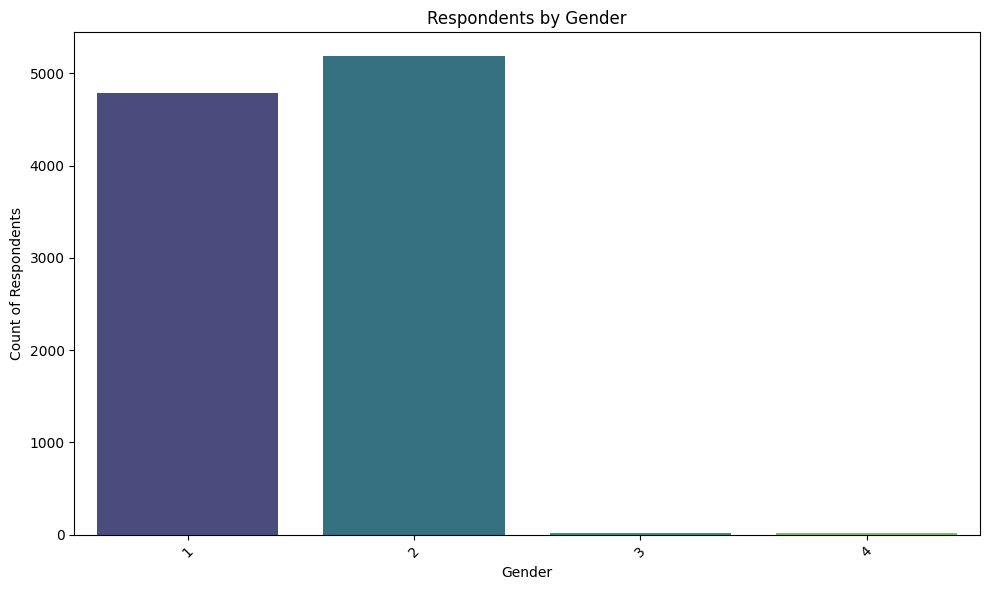


🧾 Gender by Region:
Gender    1    2  3  4
Region                
1       389  384  0  0
2        95   99  0  0
3       247  234  0  2
4       538  566  2  1
5       399  451  4  1
6       353  392  1  1
7       363  464  2  2
8       227  248  0  1
9       443  500  3  1
10      664  559  0  4
11      676  775  2  0
12      392  514  0  1


<Figure size 1000x600 with 0 Axes>

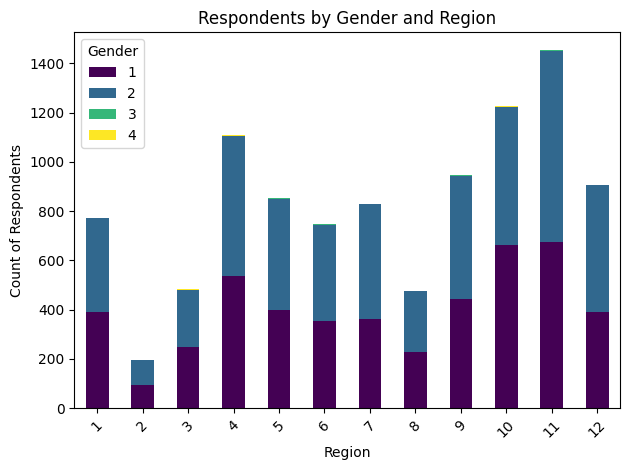


🧾 Gender by Generation:
Gender                      1     2  3  4
Age_Group                                
Gen Z (18-27)             532   685  6  3
Millennials (28-43)      1355  1561  4  4
Gen X (44-59)            1297  1504  3  4
Boomers (60-78)          1459  1311  1  3
Silent Generation (79+)   143   125  0  0


<Figure size 1000x600 with 0 Axes>

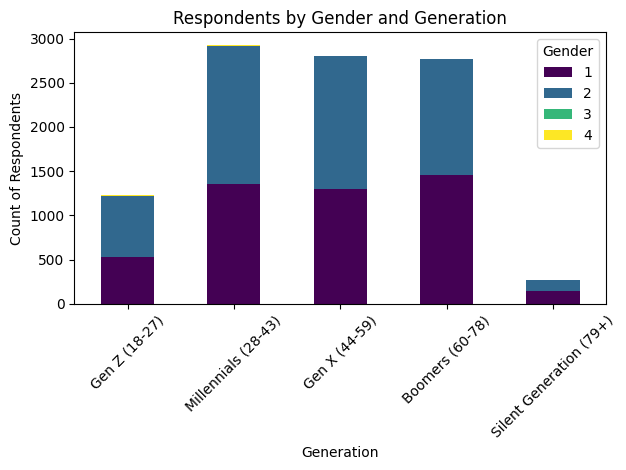


✅ All outputs saved to: /content/drive/MyDrive/PythonApps/DrIrfan_survayData/AnalysisResults/survey_statistics_overall.xlsx


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# === Configuration ===
chart_output_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/AnalysisCharts'
output_file = 'survey_statistics_overall.xlsx'
output_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/AnalysisResults'
os.makedirs(chart_output_folder, exist_ok=True)
os.makedirs(output_folder, exist_ok=True)

# === Preprocessing Function ===
def preprocess_data(df):
    col_map = {}
    for col in df.columns:
        col_str = str(col)
        if 'D1_Gender' in col_str: col_map[col] = 'Gender'
        elif 'D2_Age' in col_str: col_map[col] = 'Age'
        elif 'D3_Region' in col_str: col_map[col] = 'Region'
        elif 'D7.a' in col_str and 'personal income' in col_str: col_map[col] = 'Personal_Income'
        elif 'D6.a' in col_str and 'household income' in col_str: col_map[col] = 'Household_Income'
        elif 'D8_Ethnicity' in col_str: col_map[col] = 'Ethnicity'
    df.rename(columns=col_map, inplace=True)
    if 'Age' in df.columns:
        bins = [0, 27, 43, 59, 78, 150]
        labels = ['Gen Z (18-27)', 'Millennials (28-43)', 'Gen X (44-59)', 'Boomers (60-78)', 'Silent Generation (79+)']
        df['Age_Group'] = pd.cut(df['Age'], bins=bins, labels=labels, include_lowest=True)
    return df

# === Count Function ===
def count_respondents(df):
    count_data = {
        'Gender': df['Gender'].value_counts(),
        'Gender_by_Region': df.groupby(['Region', 'Gender']).size().unstack(fill_value=0),
        'Gender_by_Age': df.groupby(['Age_Group', 'Gender']).size().unstack(fill_value=0)
    }
    return count_data

# === Plot Functions with Display ===
def display_and_save_chart(df, filename, title, x_label, y_label, is_grouped=False):
    plt.figure(figsize=(10, 6))
    if is_grouped:
        df.plot(kind='bar', stacked=True, cmap="viridis")
    else:
        sns.barplot(x=df.index, y=df.values, palette="viridis")
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.xticks(rotation=45)
    plt.tight_layout()
    full_path = os.path.join(chart_output_folder, filename)
    plt.savefig(full_path)
    plt.show()
    return full_path

# === Load and Process ===
df = pd.read_excel(url)
df = preprocess_data(df)

total_questions = df.shape[1] - 5
total_respondents = len(df)
print(f"\n📊 Total Number of Questions: {total_questions}")
print(f"🧍 Total Number of Respondents: {total_respondents}")

count_data = count_respondents(df)

# Display + Chart: Gender
print("\n🧾 Gender Distribution:")
print(count_data['Gender'])
gender_chart = display_and_save_chart(count_data['Gender'], 'gender_distribution.png', 'Respondents by Gender', 'Gender', 'Count of Respondents')

# Display + Chart: Gender by Region
print("\n🧾 Gender by Region:")
print(count_data['Gender_by_Region'])
gender_region_chart = display_and_save_chart(count_data['Gender_by_Region'], 'gender_by_region.png', 'Respondents by Gender and Region', 'Region', 'Count of Respondents', is_grouped=True)

# Display + Chart: Gender by Age Group
print("\n🧾 Gender by Generation:")
print(count_data['Gender_by_Age'])
gender_age_chart = display_and_save_chart(count_data['Gender_by_Age'], 'gender_by_age.png', 'Respondents by Gender and Generation', 'Generation', 'Count of Respondents', is_grouped=True)

# === Save to Excel ===
output_path = os.path.join(output_folder, output_file)
with pd.ExcelWriter(output_path, engine='xlsxwriter') as writer:
    workbook = writer.book
    worksheet = workbook.add_worksheet('Overall Survey Statistics')
    writer.sheets['Overall Survey Statistics'] = worksheet

    # Summary info
    df_summary = pd.DataFrame({
        'Total Respondents': [total_respondents],
        'Total Questions': [total_questions]
    })
    df_summary.to_excel(writer, sheet_name='Overall Survey Statistics', startrow=0, index=False)

    start_row = 3
    # Gender count data
    count_data['Gender'].to_frame(name='Count').to_excel(writer, sheet_name='Overall Survey Statistics', startrow=start_row, index=True)
    worksheet.insert_image(start_row, 4, gender_chart, {'x_scale': 0.8, 'y_scale': 0.8})

    # Gender by Region data
    start_row = 10
    count_data['Gender_by_Region'].to_excel(writer, sheet_name='Overall Survey Statistics', startrow=start_row, index=True)
    worksheet.insert_image(start_row, 6, gender_region_chart, {'x_scale': 0.8, 'y_scale': 0.8})

    # Gender by Age Group data
    start_row = 25
    count_data['Gender_by_Age'].to_excel(writer, sheet_name='Overall Survey Statistics', startrow=start_row, index=True)
    worksheet.insert_image(start_row, 6, gender_age_chart, {'x_scale': 0.8, 'y_scale': 0.8})

print(f"\n✅ All outputs saved to: {output_path}")


In [3]:
pip install mplcursors

**Raw Analysis By question prefix**

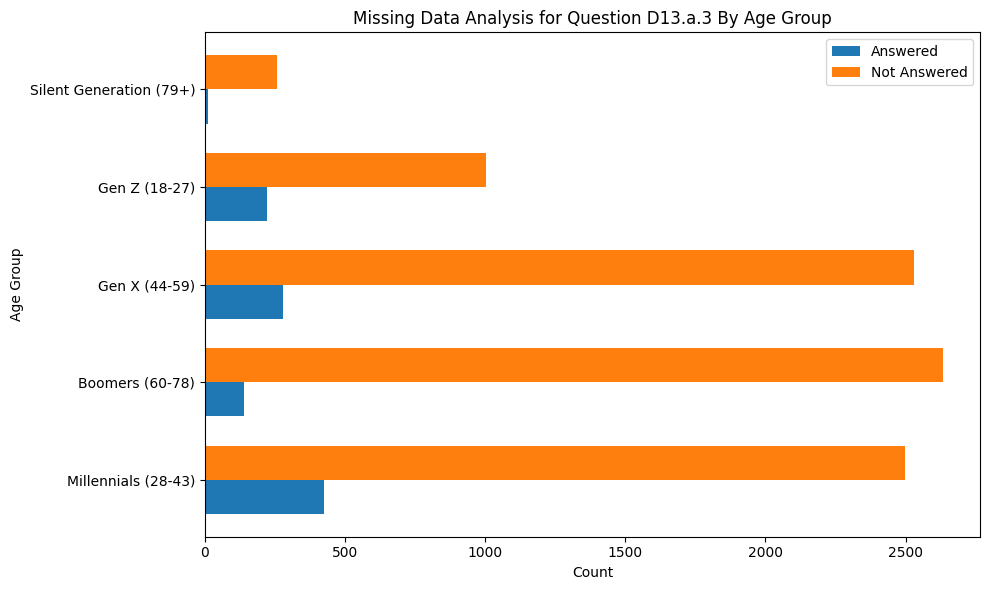

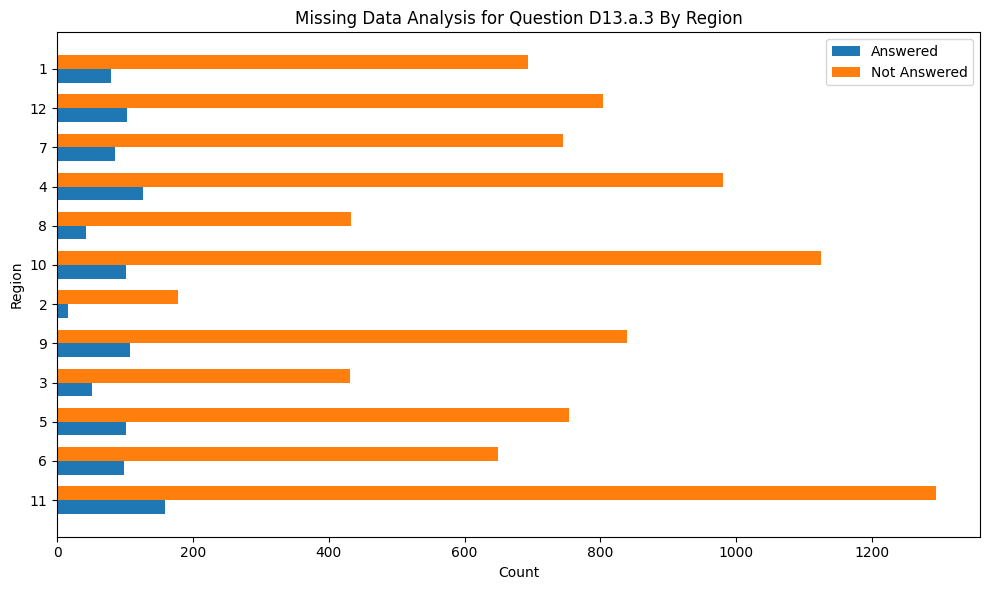

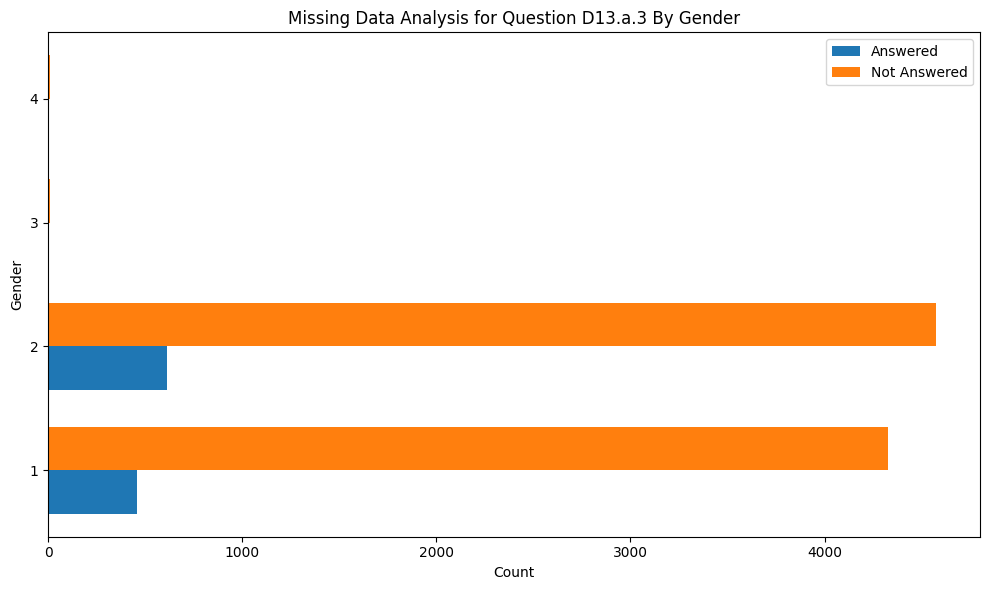

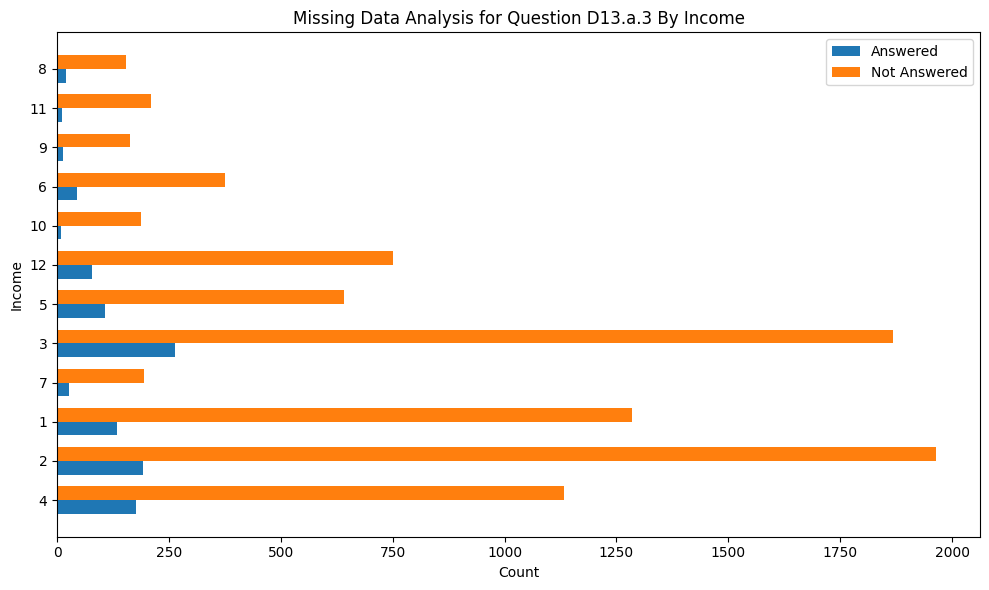

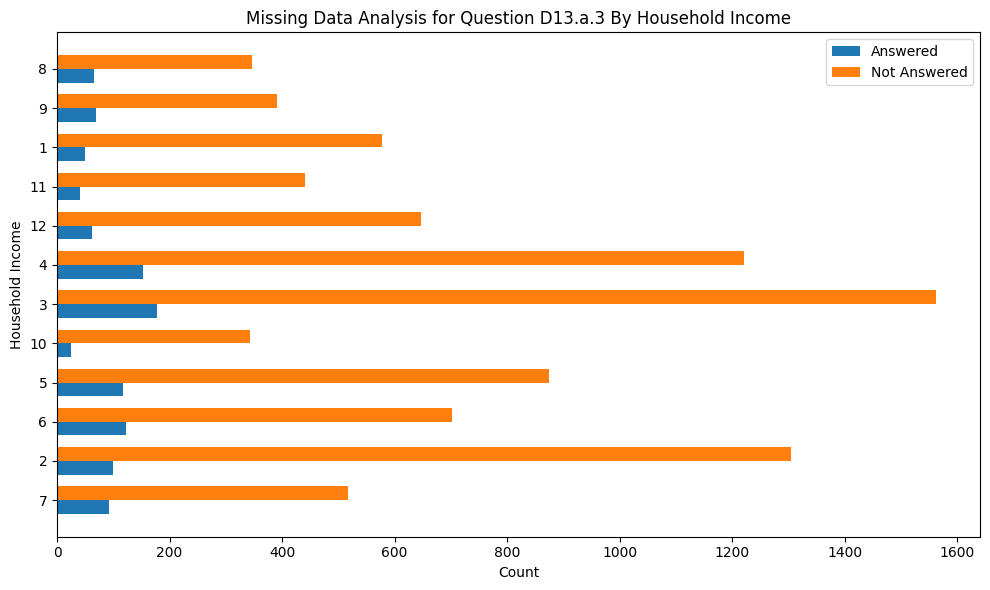

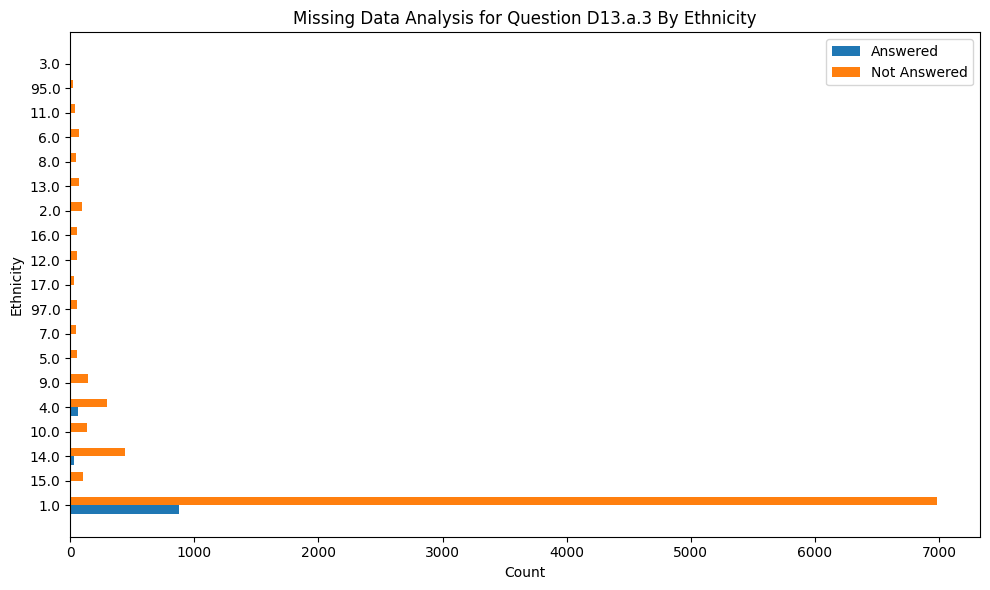

In [4]:
# Raw File Overall
import matplotlib.pyplot as plt
import numpy as np
import mplcursors

def analyze_question_by_prefix(df, question_prefix):
    """Analyze the missingness for a specific question based on the question prefix"""
    # Find columns that match the question prefix
    question_columns = [col for col in df.columns if question_prefix in str(col)]

    if not question_columns:
        print(f"⚠️ No columns found with prefix: {question_prefix}")
        return None

    # Total records for the question
    total_records = len(df)

    # Find the column with the question
    question_column = question_columns[0]  # Assuming there is only one column per prefix

    # Missingness by Age Group
    age_groups = df['Age_Group'].dropna().unique() if 'Age_Group' in df.columns else []
    age_group_answered = {}
    age_group_not_answered = {}

    for age_group in age_groups:
        age_group_data = df[df['Age_Group'] == age_group]
        answered = age_group_data[question_column].notnull().sum()
        not_answered = age_group_data[question_column].isnull().sum()
        age_group_answered[age_group] = answered
        age_group_not_answered[age_group] = not_answered

    # Missingness by Region
    regions = df['Region'].dropna().unique() if 'Region' in df.columns else []
    region_answered = {}
    region_not_answered = {}

    for region in regions:
        region_data = df[df['Region'] == region]
        answered = region_data[question_column].notnull().sum()
        not_answered = region_data[question_column].isnull().sum()
        region_answered[region] = answered
        region_not_answered[region] = not_answered

    # Missingness by Gender
    genders = df['Gender'].dropna().unique() if 'Gender' in df.columns else []
    gender_answered = {}
    gender_not_answered = {}

    for gender in genders:
        gender_data = df[df['Gender'] == gender]
        answered = gender_data[question_column].notnull().sum()
        not_answered = gender_data[question_column].isnull().sum()
        gender_answered[gender] = answered
        gender_not_answered[gender] = not_answered

    # Missingness by Personal Income
    income_levels = df['Personal_Income'].dropna().unique() if 'Personal_Income' in df.columns else []
    income_answered = {}
    income_not_answered = {}

    for income in income_levels:
        income_data = df[df['Personal_Income'] == income]
        answered = income_data[question_column].notnull().sum()
        not_answered = income_data[question_column].isnull().sum()
        income_answered[income] = answered
        income_not_answered[income] = not_answered

    # Missingness by Household Income
    household_income_levels = df['Household_Income'].dropna().unique() if 'Household_Income' in df.columns else []
    household_income_answered = {}
    household_income_not_answered = {}

    for household_income in household_income_levels:
        household_income_data = df[df['Household_Income'] == household_income]
        answered = household_income_data[question_column].notnull().sum()
        not_answered = household_income_data[question_column].isnull().sum()
        household_income_answered[household_income] = answered
        household_income_not_answered[household_income] = not_answered

    # Missingness by Ethnicity
    ethnicities = df['Ethnicity'].dropna().unique() if 'Ethnicity' in df.columns else []
    ethnicity_answered = {}
    ethnicity_not_answered = {}

    for ethnicity in ethnicities:
        ethnicity_data = df[df['Ethnicity'] == ethnicity]
        answered = ethnicity_data[question_column].notnull().sum()
        not_answered = ethnicity_data[question_column].isnull().sum()
        ethnicity_answered[ethnicity] = answered
        ethnicity_not_answered[ethnicity] = not_answered

    # Overall Missingness for the Question
    overall_answered = df[question_column].notnull().sum()
    overall_not_answered = df[question_column].isnull().sum()

    # Prepare the statistics
    statistics = {
        'Total Records': total_records,
        'Age Group Answered': age_group_answered,
        'Age Group Not Answered': age_group_not_answered,
        'Region Answered': region_answered,
        'Region Not Answered': region_not_answered,
        'Gender Answered': gender_answered,
        'Gender Not Answered': gender_not_answered,
        'Income Answered': income_answered,
        'Income Not Answered': income_not_answered,
        'Household Income Answered': household_income_answered,
        'Household Income Not Answered': household_income_not_answered,
        'Ethnicity Answered': ethnicity_answered,
        'Ethnicity Not Answered': ethnicity_not_answered,
        'Overall Answered': overall_answered,
        'Overall Not Answered': overall_not_answered,
    }

    return statistics

def plot_missing_data(statistics, question_prefix):
    """Plot missing data based on the statistics dictionary dynamically"""
    # Create a function to plot missing data for a specific category
    def plot_bar_chart(data, category, prefix):
        categories = list(data.keys())
        answered = [data[category].get('Answered', 0) for category in categories]
        not_answered = [data[category].get('Not Answered', 0) for category in categories]

        x = np.arange(len(categories))  # the label locations
        width = 0.35  # the width of the bars

        fig, ax = plt.subplots(figsize=(10, 6))

        # Plot bars
        bars_answered = ax.barh(x - width/2, answered, width, label='Answered')
        bars_not_answered = ax.barh(x + width/2, not_answered, width, label='Not Answered')

        # Add labels, title, and custom x-axis tick labels
        ax.set_xlabel('Count')
        ax.set_ylabel(category)  # Set y-axis label dynamically based on the category
        ax.set_title(f'Missing Data Analysis for Question {prefix} By {category}')  # Title with question prefix
        ax.set_yticks(x)
        ax.set_yticklabels(categories)
        ax.legend()

        # Enable interactivity using mplcursors
        cursor = mplcursors.cursor(bars_answered, hover=True)
        cursor.connect("add", lambda sel: sel.annotation.set_text(f"Answered: {answered[sel.index]}"))

        cursor = mplcursors.cursor(bars_not_answered, hover=True)
        cursor.connect("add", lambda sel: sel.annotation.set_text(f"Not Answered: {not_answered[sel.index]}"))

        # Show the plot
        plt.tight_layout()
        plt.show()

    # Loop through each key (category) in the statistics data and plot the chart dynamically
    categories = ['Age Group', 'Region', 'Gender', 'Income', 'Household Income', 'Ethnicity']

    for category in categories:
        # Extract the dynamic data for each category from the statistics
        category_answered = statistics.get(f'{category} Answered', {})
        category_not_answered = statistics.get(f'{category} Not Answered', {})

        # Prepare combined data for each category
        category_data = {}
        for key in category_answered:
            category_data[key] = {
                'Answered': category_answered[key],
                'Not Answered': category_not_answered.get(key, 0)  # Default to 0 if no data exists for 'Not Answered'
            }

        # Plot the chart for the current category
        plot_bar_chart(category_data, category, question_prefix)

# usage:
question_prefix = "D13.a.3"  # Specify the question prefix you're interested in
statistics = analyze_question_by_prefix(df, question_prefix)

# # PrefixesForTest = ['D6_Nearest_City', 'D5A.a', 'D5B.a', 'D6.a', 'D7.a', 'D8.a.1', 'D8.a.2', 'D8.a.3', 'D8.a.4', 'D8.a.5', 'D8.a.6','D8.a.7', 'D8.a.8', 'D8.a.9','D8.a.10', 'D9.a', 'D10.a',
# #                          'D11.a.1', 'D11.a.2','D11.a.3','D11.a.4','D11.a.5', 'D11.a.6','D11.a.7','D11.a.8','D11.a.9', 'D11.a.10', 'D12.a',
# #                          'D13.a.1', 'D13.a.2', 'D13.a.3','D13.a.4','D13.a.5','D13.a.6','D13.a.7','D13.a.8','D13.a.9','D13.a.10','D13.a.11',
# #                          'D14A_CHILDREN.a', 'D14B_CHILDREN.a.1' , 'D14B_CHILDREN.a.2', 'D14B_CHILDREN.a.3','D14B_CHILDREN.a.4','D14B_CHILDREN.a.5',
# #                          'D14B_CHILDREN.a.6','D14B_CHILDREN.a.7', 'D14B_CHILDREN.a.8','D14B_CHILDREN.a.9','D14B_CHILDREN.a.10', 'D14B_CHILDREN.a.11','D14B_CHILDREN.a.12',
# #                          'D14B_CHILDREN.a.13', 'D14B_CHILDREN.a.14', 'D14B_CHILDREN.a.15', 'D14B_CHILDREN.a.16','D14B_CHILDREN.a.17', 'D14B_CHILDREN.a.18', 'D14C_CHILDREN.a',
# #                          'Q1.a', 'Q2.a', 'Q3.a','Q4.a', 'Q5.a', 'Q6.a','Q7.a', 'Q8.a', 'Q8.a','Q9.a.1' ,'Q9.a.2','Q9.a.3','Q10.a','Q11.a.1','Q11.a.2','Q11.a.3','Q11.a.4',
# #                          'Q11.a.5','Q11.a.6','Q11.a.7','Q11.a.8','Q11.a.9','Q11.a.10','Q11.a.11','Q11.a.12', 'Q12.a.1','Q12.a.2','Q12.a.3','Q12.a.4',
# #                          'Q12.a.5','Q12.a.6','Q12.a.7','Q12.a.8','Q12.a.9','Q12.a.10','Q12.a.11','Q12.a.12', 'Q13.a.1','Q13.a.2','Q13.a.3','Q13.a.4',
# #                          'Q13.a.5','Q13.a.6','Q13.a.7','Q13.a.8', 'Q14.a.1','Q14.a.2','Q14.a.3','Q14.a.4',
# #                          'Q14.a.5','Q14.a.6','Q15.a','Q16.a','Q17.a','Q18.a','Q19.a','Q20.a', 'Q21.a.1','Q21.a.2','Q21.a.3','Q21.a.4',
# #                          'Q21.a.5','Q21.a.6','Q21.a.7','Q21.a.8', 'Q22.a.1','Q22.a.2','Q22.a.3','Q22.a.4','Q22.a.5', 'Q23.a','Q24.a','Q25.a',
# #                          'Q26.a','Q27.a','Q28.a.1','Q28.a.2','Q28.a.3', 'Q29.a','Q30.a','Q31.a','Q32.a','Q33.a','Q34.a.1','Q34.a.2','Q34.a.3','Q34.a.4',
# #                          'Q34.a.5','Q34.a.6','Q34.a.7','Q34.a.8','Q34.a.9','Q34.a.10','Q34.a.11','Q34.a.12','Q34.a.13','Q34.a.14','Q34.a.15','Q34.a.16','Q35.a.1','Q35.a.2','Q35.a.3','Q35.a.4',
# #                          'Q35.a.5','Q35.a.6','Q35.a.7','Q35.a.8','Q35.a.9','Q35.a.10','Q35.a.11','Q35.a.12','Q35.a.13','Q35.a.14','Q35.a.15','Q35.a.16','Q36.a.1','Q36.a.2','Q36.a.3','Q36.a.4',
# #                          'Q36.a.5','Q36.a.6','Q36.a.7','Q36.a.8','Q36.a.9','Q36.a.10','Q36.a.11','Q36.a.12','Q36.a.13','Q36.a.14','Q36.a.15','Q36.a.16', 'Q36.a.17','Q36.a.17','Q36.a.19','Q36.a.20','Q36.a.21', 'Q36.a.22',
# #                          'Q37.a.1','Q37.a.2','Q37.a.3','Q37.a.4','Q37.a.5','Q37.a.6','Q37.a.7','Q37.a.8','Q37.a.9','Q37.a.10','Q37.a.11','Q37.a.12','Q37.a.13','Q37.a.14','Q37.a.15','Q37.a.16', 'Q37.a.17','Q37.a.18', 'Q37.a.19',
# #                          'Q38.a.1','Q38.a.2','Q38.a.3','Q38.a.4','Q38.a.5','Q38.a.6','Q38.a.7','Q38.a.8','Q39.a.1','Q39.a.2','Q39.a.3','Q39.a.4','Q39.a.5','Q39.a.6','Q39.a.7','Q39.a.8','D15.a.1', 'D15.a.2', 'D16.a', 'D17.a', 'D8_Ethnicity.a']


# Plot the missing data dynamically
plot_missing_data(statistics, question_prefix)


## **# Processed Data Multiple Sheets Analysis Question Per Sheet**

In [5]:
!pip install xlsxwriter


In [6]:
pip install xlsxwriter

In [7]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import xlsxwriter

In [8]:
# ========== CONFIGURATION ==========
folder_path = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/ConsoludatedQuestionSheets'
chart_output_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/AnalysisCharts'
output_file = 'survey_analysis_output.xlsx'
output_folder = '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/AnalysisResults'

# Ensure folders exist
os.makedirs(chart_output_folder, exist_ok=True)
os.makedirs(output_folder, exist_ok=True)

# ========== COLUMN PREPROCESSING ==========
def preprocess_column_names(df):
    df.columns = df.columns.str.replace(r'\n', ' ', regex=True).str.strip()
    df.columns = df.columns.str.replace(r'c\.', '', regex=True).str.strip()
    df.columns = df.columns.str.replace(r'a\.', '', regex=True).str.strip()
    df.columns = df.columns.str.replace(r'\.', '_', regex=True)
    return df

# ========== MISSING VALUE ANALYSIS ==========
def analyze_missing_values(df, question_col, region_col, gender_col, ethnicity_col, sheet_name):
    variables = ['Household_Income', 'Generation', 'Working_Type',
                 'Financial_Products_Held_Count', 'Personal_Income_Bin',
                 'Insurance_Products_Held_Count', 'ethnic_group']
    results = {}

    for var in variables:
        if var in df.columns:
            missing = df[df[question_col].isna()].groupby(var).size()
            total = df.groupby(var).size()
            var_df = pd.DataFrame({
                'Missing Responses': missing,
                'Total Responses': total
            }).fillna(0)
            var_df['Percentage Missing'] = (var_df['Missing Responses'] / var_df['Total Responses']) * 100
            var_df = var_df.sort_values(by='Missing Responses', ascending=False).round(2)

            # Save plot
            chart_path = os.path.join(chart_output_folder, f'{sheet_name}_{var}_missing_chart.png')
            ax = var_df[['Missing Responses', 'Percentage Missing']].plot(kind='barh', figsize=(10, 6))
            plt.title(f'Missing Data for {sheet_name} by {var}')
            plt.xlabel('Count')
            plt.tight_layout()
            plt.savefig(chart_path)
            plt.close()

            results[f"{var} Missing Values Breakdown"] = (var_df, chart_path)
    return results

In [9]:
# ========== REGION DEMOGRAPHICS ==========
def analyze_region_demographics_by_generation(df, region_col, generation_col, sheet_name):
    if region_col not in df.columns:
        return None, None, None

    count_df = df.groupby([region_col, generation_col]).size().unstack().fillna(0)
    pct_df = count_df.div(count_df.sum(axis=1), axis=0) * 100

    # Save chart
    chart_path = os.path.join(chart_output_folder, f'{sheet_name}_region_gen_chart.png')
    count_df.plot(kind='barh', stacked=True, figsize=(10, 6), colormap='Set2')
    plt.title('Region-wise Demographics by Generation')
    plt.xlabel('Count of Respondents')
    plt.tight_layout()
    plt.savefig(chart_path)
    plt.close()

    return count_df.round(0), pct_df.round(2), chart_path

In [10]:
# ========== LOAD EXCEL SHEETS ==========
def load_excel_files(folder_path):
    excel_files = [f for f in os.listdir(folder_path) if f.endswith('.xlsx')]
    sheets_data = {}
    for file in excel_files:
        xls = pd.ExcelFile(os.path.join(folder_path, file))
        for sheet_name in xls.sheet_names:
            df = pd.read_excel(xls, sheet_name=sheet_name)
            df = preprocess_column_names(df)
            sheets_data[sheet_name] = df

            question_text = df.columns[0]  # capture the actual question column name
            sheets_data[sheet_name] = (df, question_text)
    return sheets_data


In [14]:
# ========== WRITE TO EXCEL WITH CHARTS ==========
def save_to_excel(all_data, output_path):
    print("All Data: ", all_data )
    with pd.ExcelWriter(output_path, engine='xlsxwriter') as writer:
        workbook = writer.book
        for sheet_name, content in all_data.items():
            truncated_name = sheet_name[:31]
            worksheet = workbook.add_worksheet(truncated_name)
            writer.sheets[truncated_name] = worksheet

           # ✅ Get question text safely, truncate to 10 characters
            question_text = content.get("question_text", sheet_name)[:60]  # or [:10] if you want shorter
            worksheet.write(0, 0, f"Analysis for Question: {question_text}")

            row = 2
            print("actual_question_text: ", question_text)


            for title, (df, chart_path) in analyses.items():
                worksheet.write(row, 0, title)
                row += 1

                for col_num, column_name in enumerate(df.columns):
                    worksheet.write(row, col_num, column_name)
                row += 1

                for idx, row_data in df.iterrows():
                    for col_num, val in enumerate(row_data):
                        worksheet.write(row, col_num, val)
                    row += 1

                # Insert chart
                worksheet.insert_image(row, 0, chart_path, {'x_scale': 0.5, 'y_scale': 0.5})
                row += 20

    print(f"✅ Data and charts saved to: {output_path}")


📄 Analyzing Sheet: D6_Nearest_City

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               2435            10000               24.35


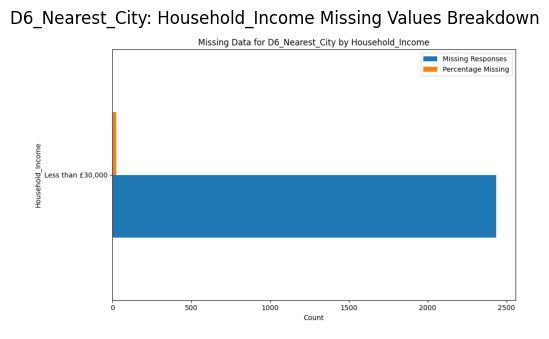


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       1093             2774   
Gen X (44-59)                          722             2808   
Millennials (28-43)                    392             2924   
Silent Generation (79+)                147              268   
Gen Z (18-27)                           81             1226   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       39.40  
Gen X (44-59)                         25.71  
Millennials (28-43)                   13.41  
Silent Generation (79+)               54.85  
Gen Z (18-27)                          6.61  


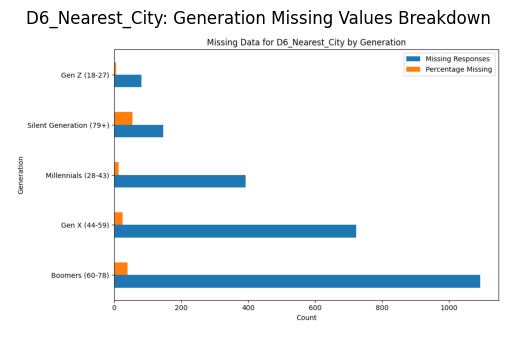


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        1119             5467               20.47
2.0                         166              642               25.86
6.0                          18              102               17.65
9.0                          18               90               20.00
5.0                          16               78               20.51
3.0                           9               33               27.27
7.0                           7               28               25.00
4.0                           6               18               33.33
8.0                           1               42                2.38


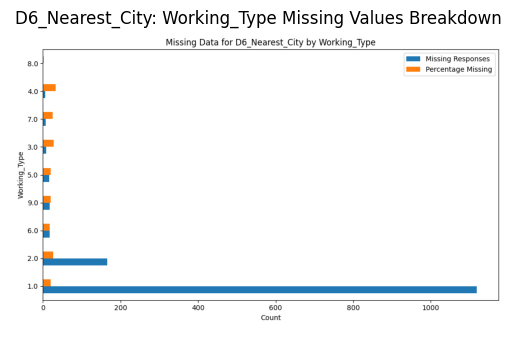


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           1047             5073   
2                                            652             2367   
3                                            386             1338   
4                                            173              618   
5                                            108              327   
6                                             41              161   
7                                             16               58   
8                                              7               32   
9                                              5               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           20.64

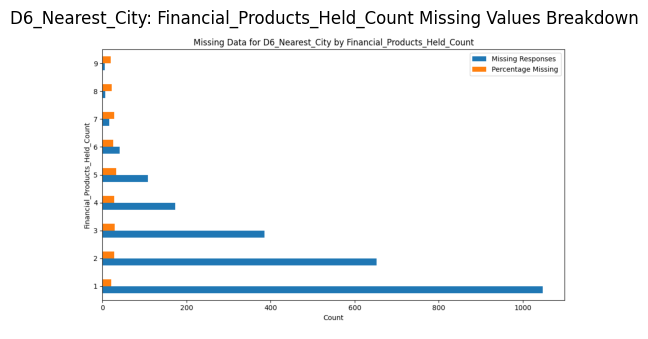


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 2435            10000               24.35


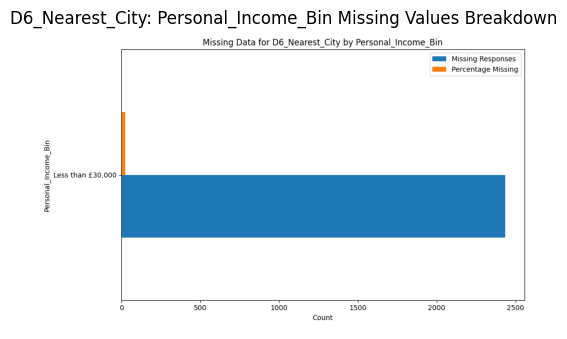


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         1478.0             5942   
2                                          584.0             2156   
3                                          228.0             1128   
4                                           93.0              494   
5                                           38.0              181   
6                                           12.0               65   
7                                            2.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           24.87  
2                                           27.09  
3             

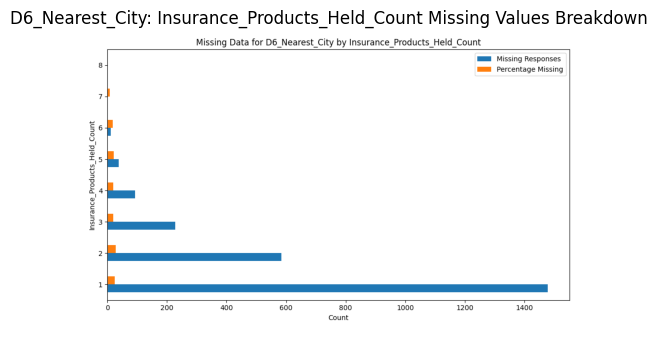


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      2122.0             7854               27.02
4.0                        86.0              360               23.89
9.0                        32.0              151               21.19
2.0                        27.0              100               27.00
14.0                       25.0              470                5.32
10.0                       21.0              141               14.89
13.0                       12.0               77               15.58
7.0                         9.0               54               16.67
15.0                        9.0              111                8.11
12.0                        8.0               59               13.56
11.0                        7.0               42               16.67
97.0                        7.0  

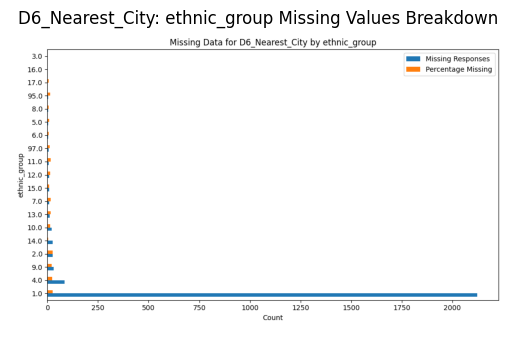


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

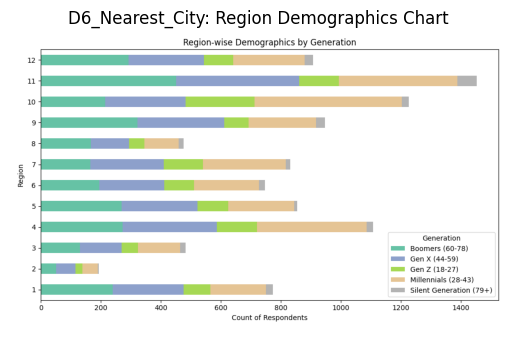


📄 Analyzing Sheet: D5A

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


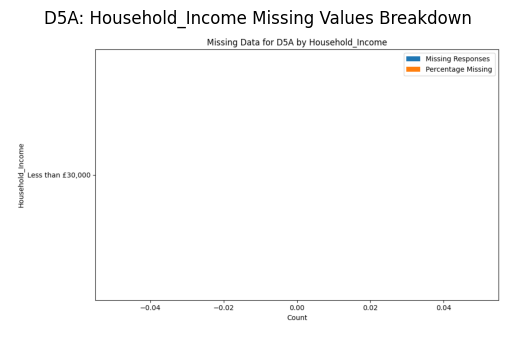


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


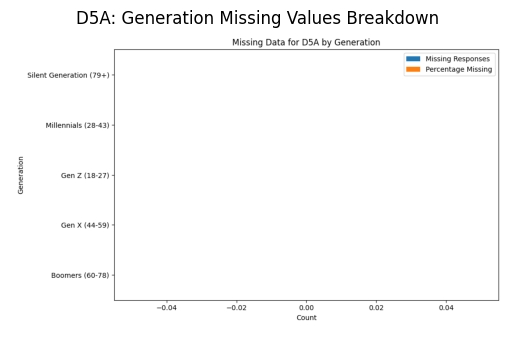


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


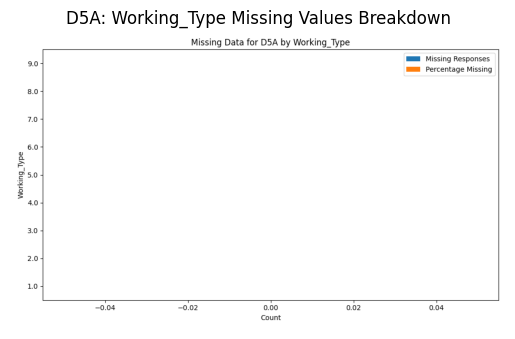


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

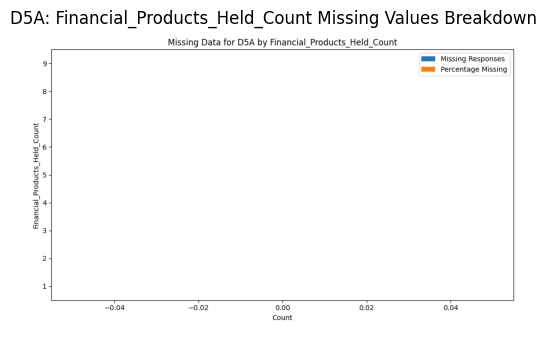


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


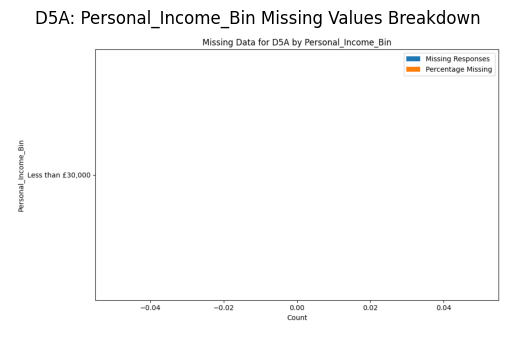


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

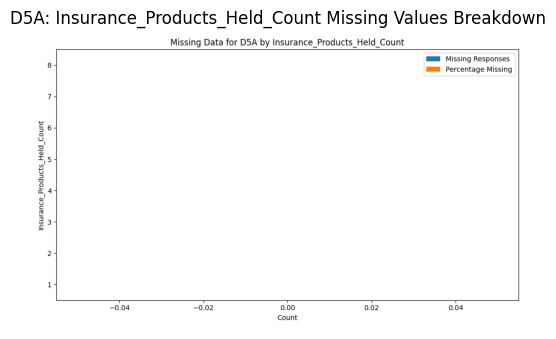


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

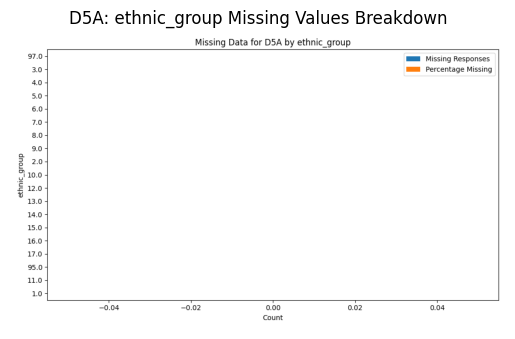


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

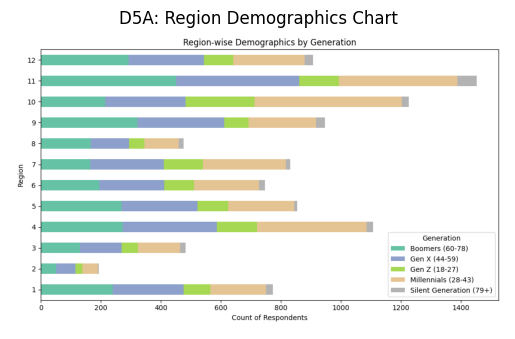


📄 Analyzing Sheet: D5B

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               3500            10000                35.0


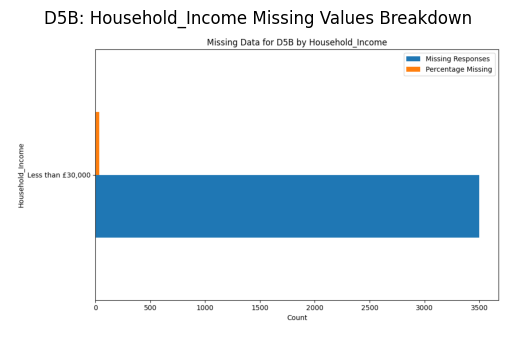


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       1829             2774   
Gen X (44-59)                          659             2808   
Millennials (28-43)                    382             2924   
Gen Z (18-27)                          381             1226   
Silent Generation (79+)                249              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       65.93  
Gen X (44-59)                         23.47  
Millennials (28-43)                   13.06  
Gen Z (18-27)                         31.08  
Silent Generation (79+)               92.91  


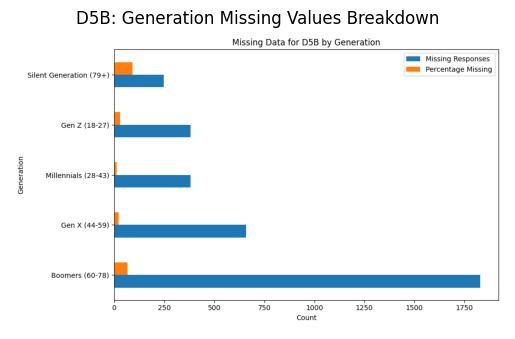


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


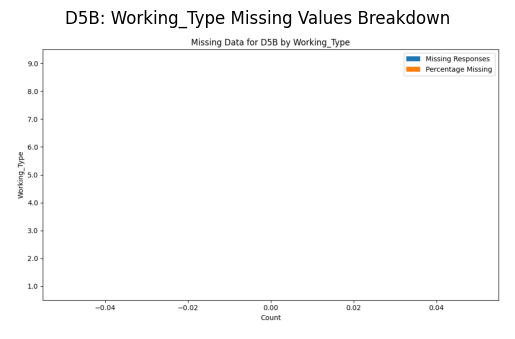


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           2255             5073   
2                                            677             2367   
3                                            301             1338   
4                                            141              618   
5                                             83              327   
6                                             29              161   
7                                              9               58   
8                                              3               32   
9                                              2               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           44.45

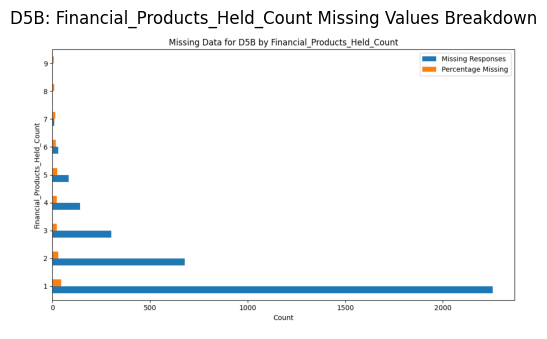


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 3500            10000                35.0


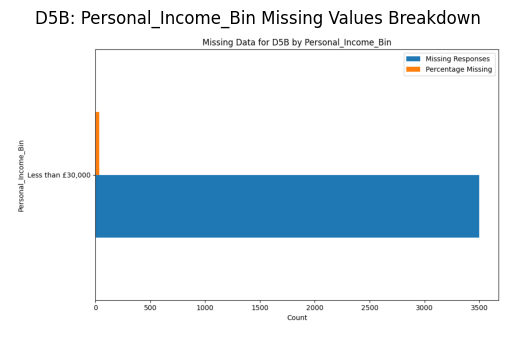


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         2447.0             5942   
2                                          724.0             2156   
3                                          238.0             1128   
4                                           68.0              494   
5                                           18.0              181   
6                                            3.0               65   
7                                            2.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           41.18  
2                                           33.58  
3             

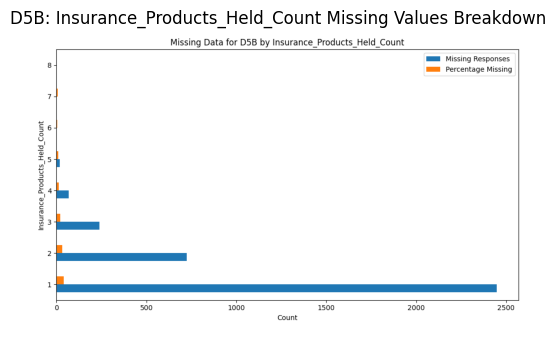


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      3008.0             7854               38.30
4.0                        74.0              360               20.56
9.0                        46.0              151               30.46
14.0                       44.0              470                9.36
10.0                       41.0              141               29.08
2.0                        30.0              100               30.00
15.0                       23.0              111               20.72
12.0                       22.0               59               37.29
7.0                        19.0               54               35.19
5.0                        19.0               62               30.65
13.0                       19.0               77               24.68
97.0                       15.0  

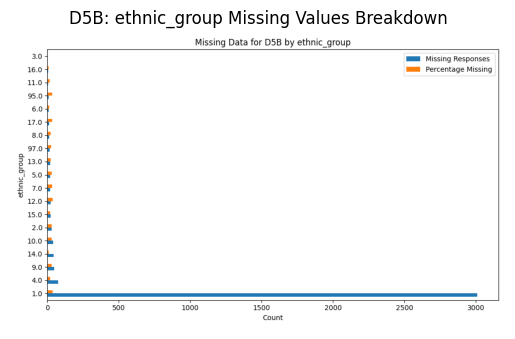


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

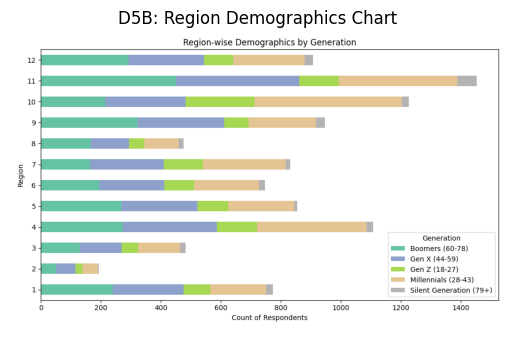


📄 Analyzing Sheet: D6

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


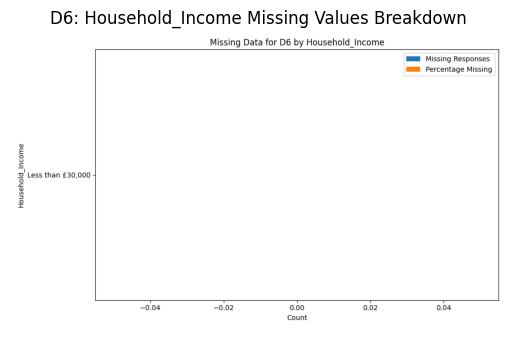


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


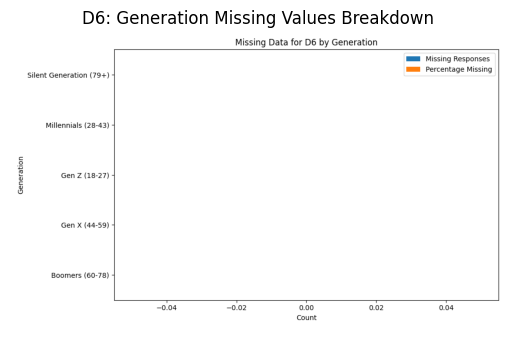


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


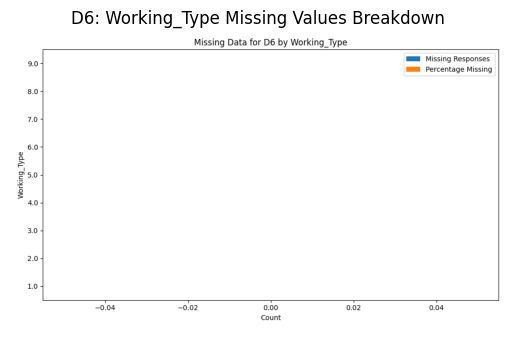


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

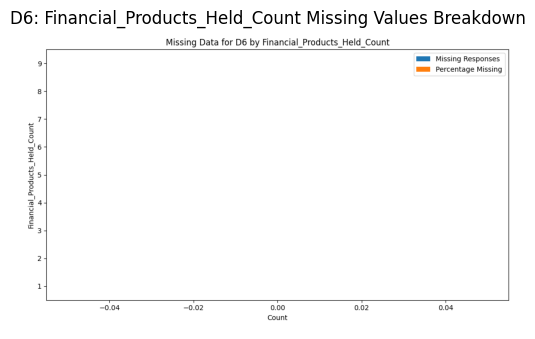


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


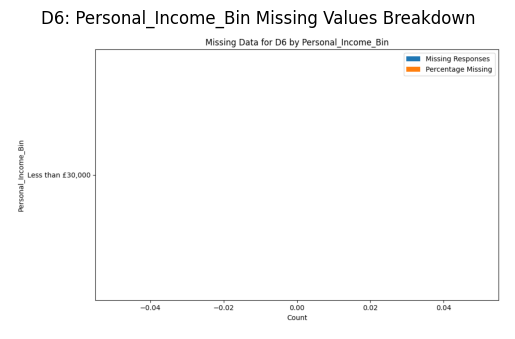


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

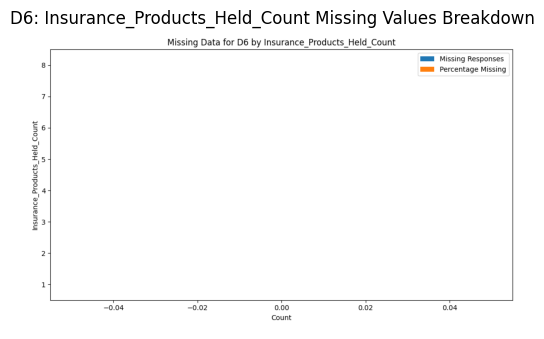


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

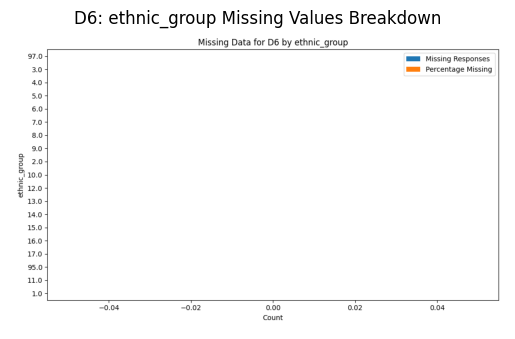


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

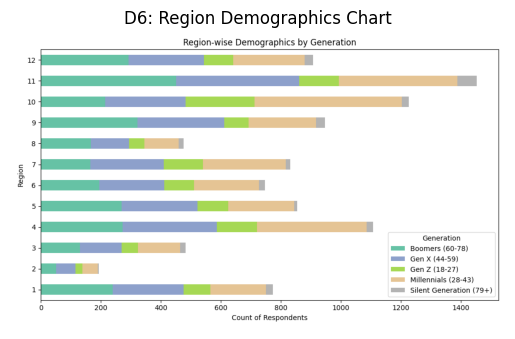


📄 Analyzing Sheet: D7

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


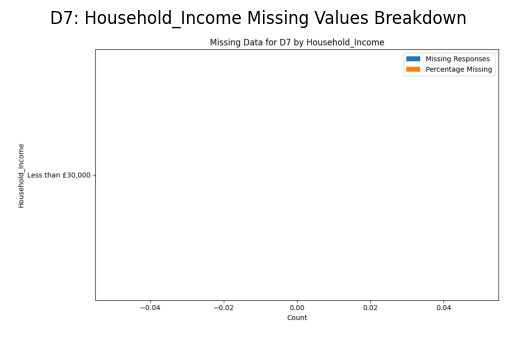


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


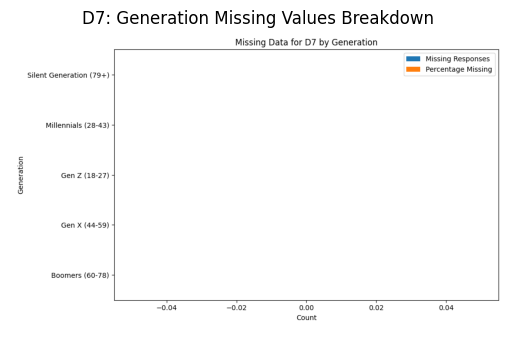


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


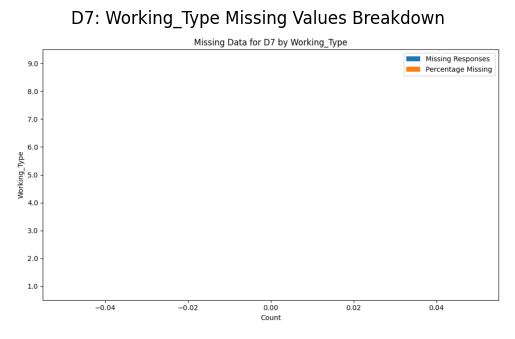


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

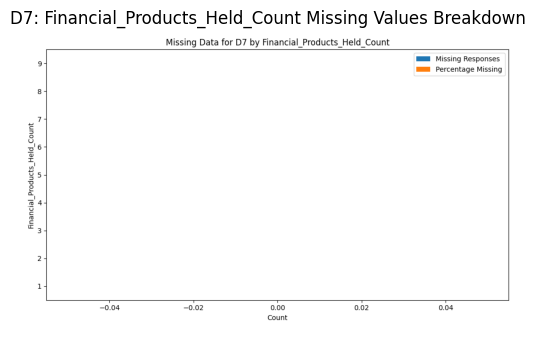


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


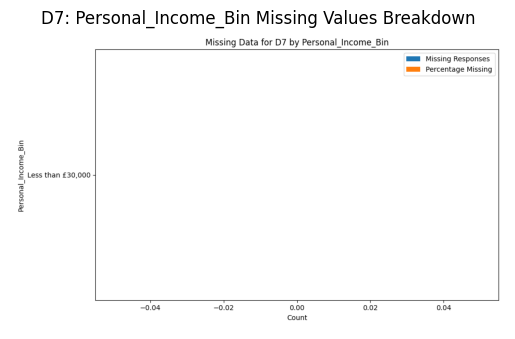


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

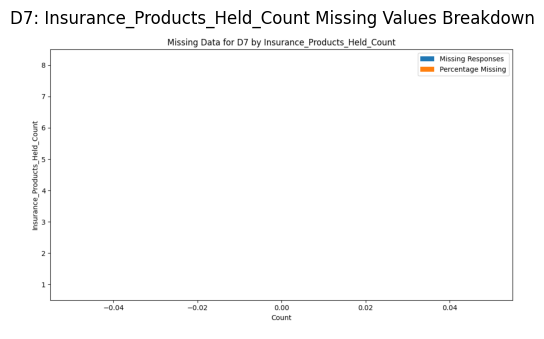


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

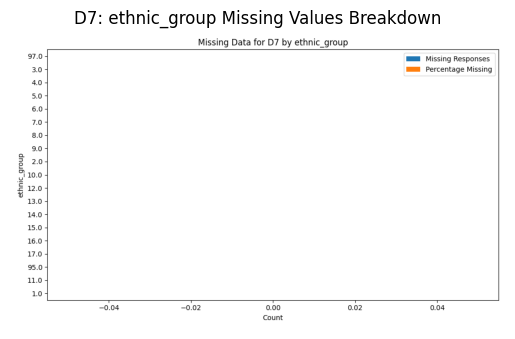


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

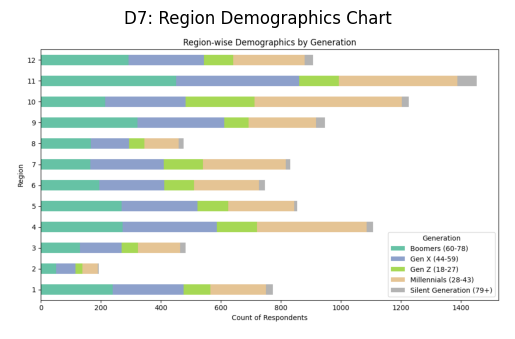


📄 Analyzing Sheet: D8

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               8401            10000               84.01


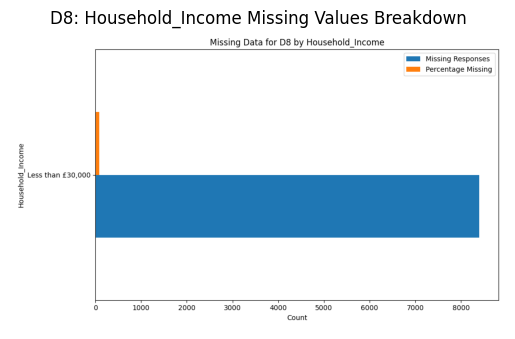


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2450             2924   
Boomers (60-78)                       2411             2774   
Gen X (44-59)                         2321             2808   
Gen Z (18-27)                          981             1226   
Silent Generation (79+)                238              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   83.79  
Boomers (60-78)                       86.91  
Gen X (44-59)                         82.66  
Gen Z (18-27)                         80.02  
Silent Generation (79+)               88.81  


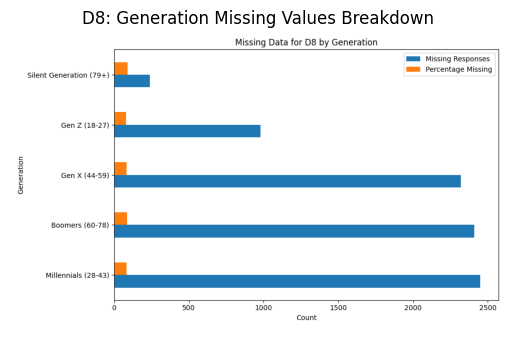


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        4909             5467               89.79
2.0                         547              642               85.20
6.0                          81              102               79.41
5.0                          68               78               87.18
9.0                          61               90               67.78
3.0                          31               33               93.94
8.0                          31               42               73.81
7.0                          27               28               96.43
4.0                          18               18              100.00


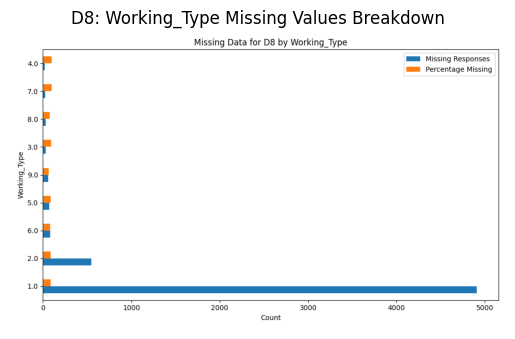


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           3474             5073   
2                                           2367             2367   
3                                           1338             1338   
4                                            618              618   
5                                            327              327   
6                                            161              161   
7                                             58               58   
8                                             32               32   
9                                             26               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           68.48

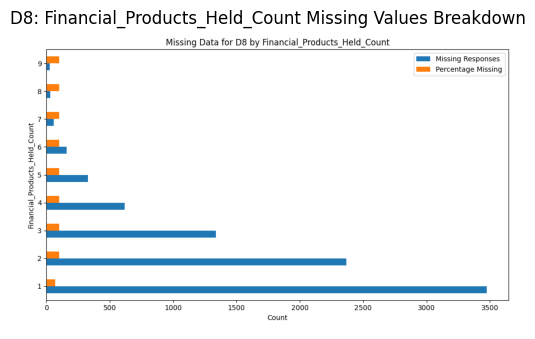


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 8401            10000               84.01


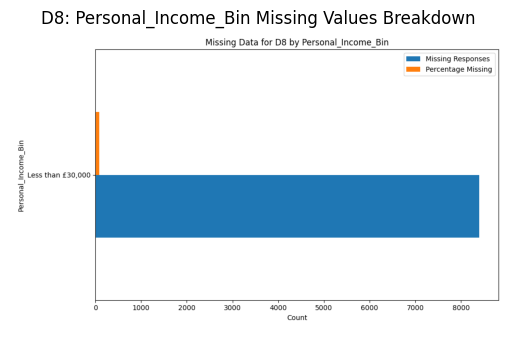


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           4631             5942   
2                                           1956             2156   
3                                           1067             1128   
4                                            476              494   
5                                            173              181   
6                                             64               65   
7                                             24               24   
8                                             10               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           77.94  
2                                           90.72  
3             

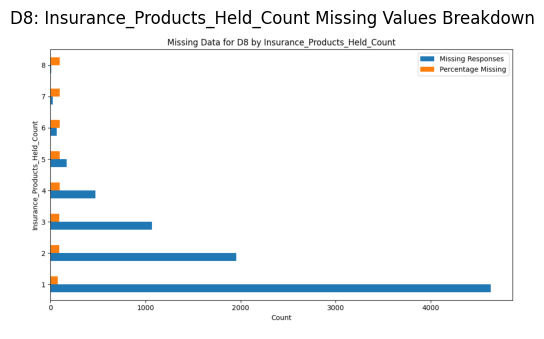


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        6663             7854               84.84
14.0                        408              470               86.81
4.0                         292              360               81.11
9.0                         126              151               83.44
10.0                        107              141               75.89
2.0                          88              100               88.00
15.0                         88              111               79.28
6.0                          67               79               84.81
13.0                         60               77               77.92
16.0                         54               57               94.74
12.0                         52               59               88.14
5.0                          49  

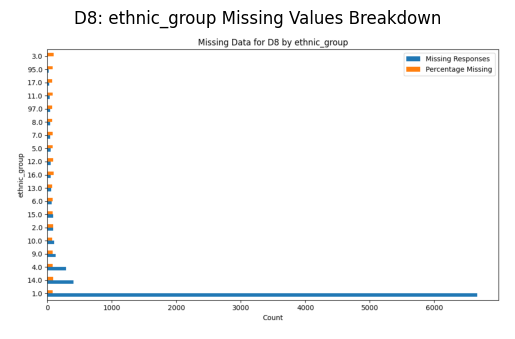


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

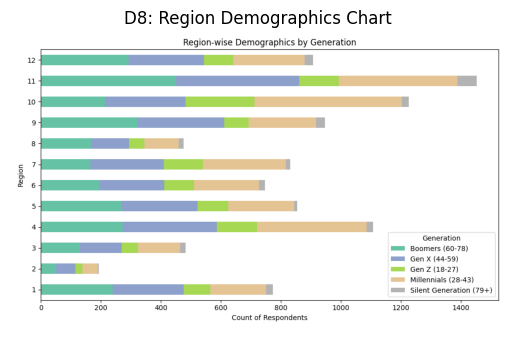


📄 Analyzing Sheet: D9

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6158            10000               61.58


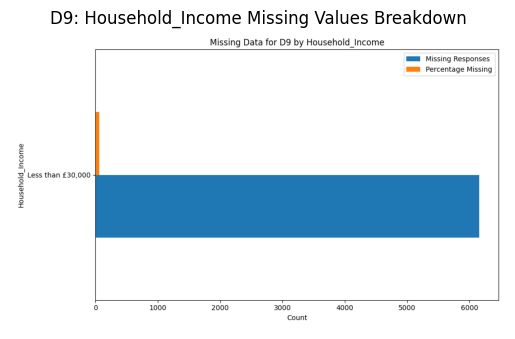


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Gen X (44-59)                         1820             2808   
Boomers (60-78)                       1733             2774   
Millennials (28-43)                   1671             2924   
Gen Z (18-27)                          769             1226   
Silent Generation (79+)                165              268   

                         Percentage Missing  
Generation                                   
Gen X (44-59)                         64.81  
Boomers (60-78)                       62.47  
Millennials (28-43)                   57.15  
Gen Z (18-27)                         62.72  
Silent Generation (79+)               61.57  


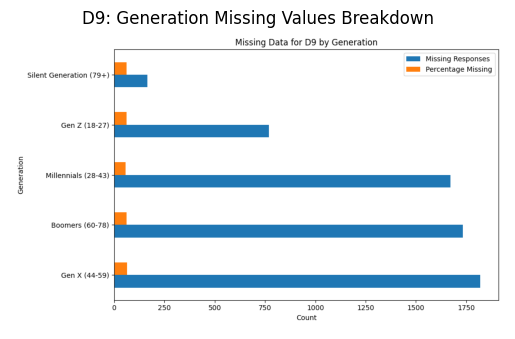


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3034             5467               55.50
2.0                         309              642               48.13
6.0                          66              102               64.71
9.0                          61               90               67.78
5.0                          35               78               44.87
8.0                          29               42               69.05
7.0                          13               28               46.43
3.0                          10               33               30.30
4.0                           8               18               44.44


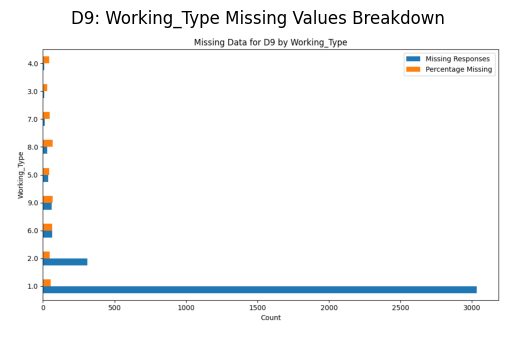


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         4741.0             5073   
2                                         1299.0             2367   
3                                          118.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           93.46

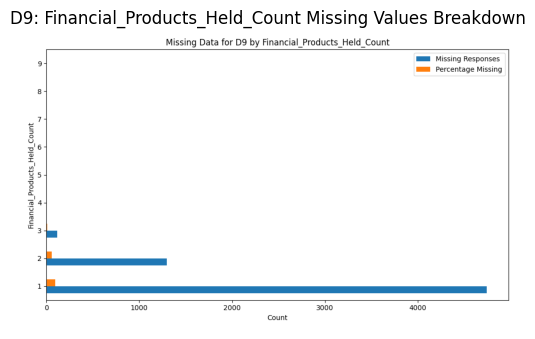


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6158            10000               61.58


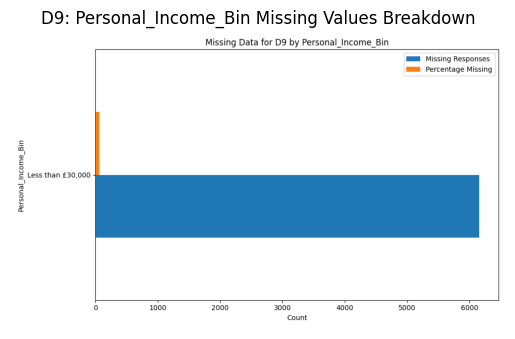


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           4289             5942   
2                                           1184             2156   
3                                            459             1128   
4                                            167              494   
5                                             45              181   
6                                              7               65   
8                                              4               10   
7                                              3               24   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           72.18  
2                                           54.92  
3             

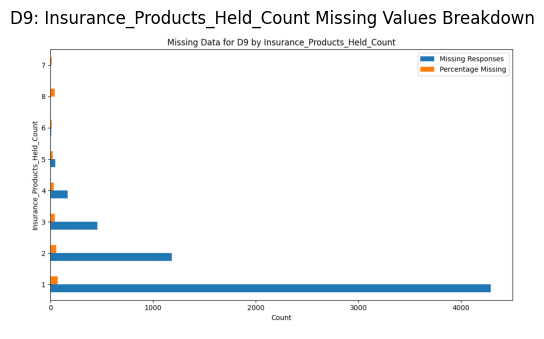


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      4917.0             7854               62.61
4.0                       234.0              360               65.00
14.0                      224.0              470               47.66
10.0                       96.0              141               68.09
9.0                        80.0              151               52.98
15.0                       72.0              111               64.86
2.0                        54.0              100               54.00
13.0                       54.0               77               70.13
6.0                        44.0               79               55.70
5.0                        39.0               62               62.90
97.0                       38.0               57               66.67
7.0                        32.0  

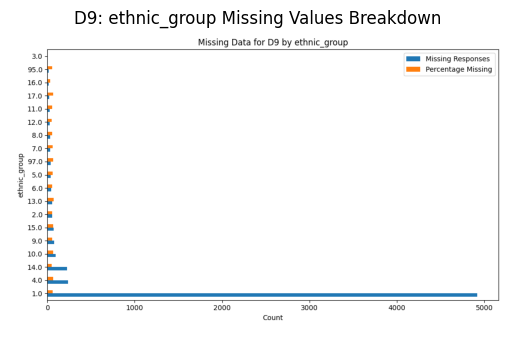


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

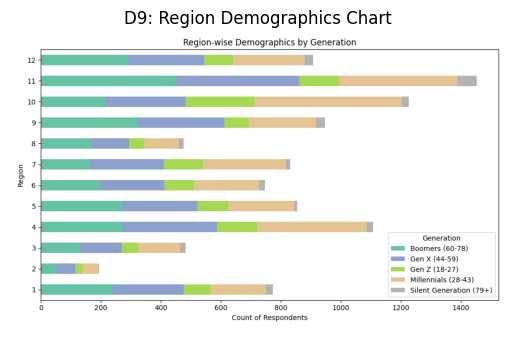


📄 Analyzing Sheet: D10

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               2558            10000               25.58


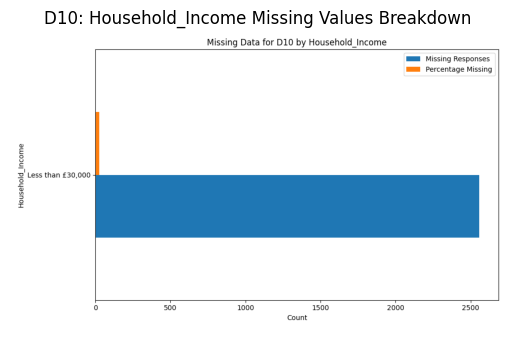


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                    793             2924   
Gen X (44-59)                          776             2808   
Boomers (60-78)                        561             2774   
Gen Z (18-27)                          378             1226   
Silent Generation (79+)                 50              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   27.12  
Gen X (44-59)                         27.64  
Boomers (60-78)                       20.22  
Gen Z (18-27)                         30.83  
Silent Generation (79+)               18.66  


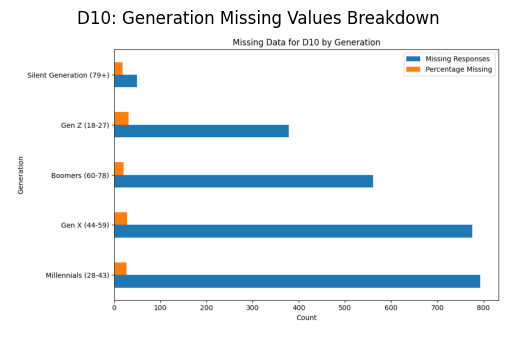


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        1195             5467               21.86
2.0                         176              642               27.41
9.0                          38               90               42.22
6.0                          33              102               32.35
5.0                          24               78               30.77
8.0                          17               42               40.48
3.0                          10               33               30.30
7.0                           6               28               21.43
4.0                           2               18               11.11


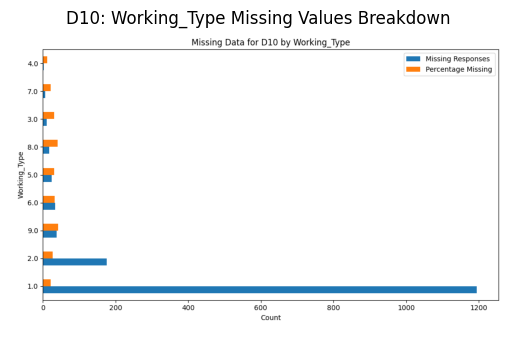


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         2243.0             5073   
2                                          195.0             2367   
3                                           76.0             1338   
4                                           32.0              618   
5                                            8.0              327   
6                                            2.0              161   
7                                            1.0               58   
8                                            1.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           44.21

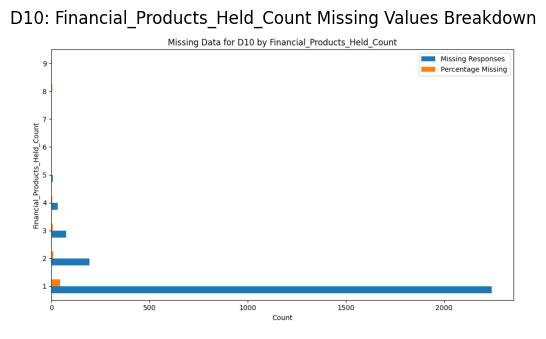


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 2558            10000               25.58


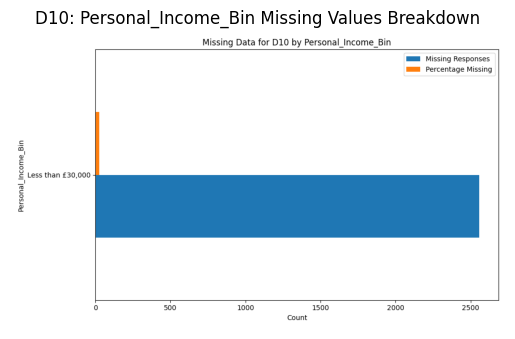


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         1884.0             5942   
2                                          397.0             2156   
3                                          190.0             1128   
4                                           53.0              494   
5                                           26.0              181   
6                                            6.0               65   
7                                            2.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           31.71  
2                                           18.41  
3             

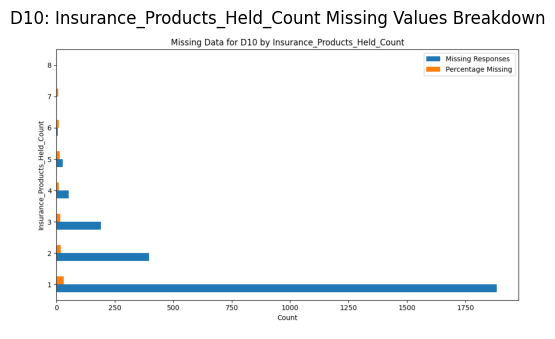


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        1896             7854               24.14
4.0                         112              360               31.11
14.0                        107              470               22.77
10.0                         54              141               38.30
9.0                          41              151               27.15
15.0                         34              111               30.63
13.0                         28               77               36.36
8.0                          25               58               43.10
5.0                          23               62               37.10
2.0                          22              100               22.00
6.0                          21               79               26.58
97.0                         20  

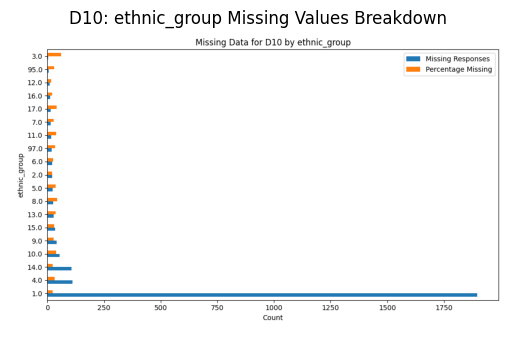


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

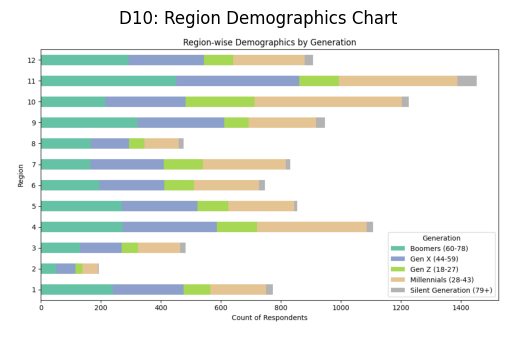


📄 Analyzing Sheet: D11

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               7524            10000               75.24


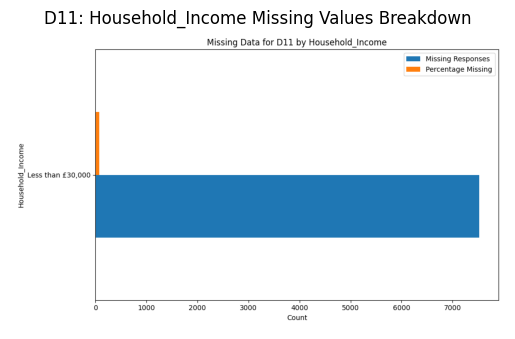


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       2409             2774   
Millennials (28-43)                   2089             2924   
Gen X (44-59)                         2083             2808   
Gen Z (18-27)                          694             1226   
Silent Generation (79+)                249              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       86.84  
Millennials (28-43)                   71.44  
Gen X (44-59)                         74.18  
Gen Z (18-27)                         56.61  
Silent Generation (79+)               92.91  


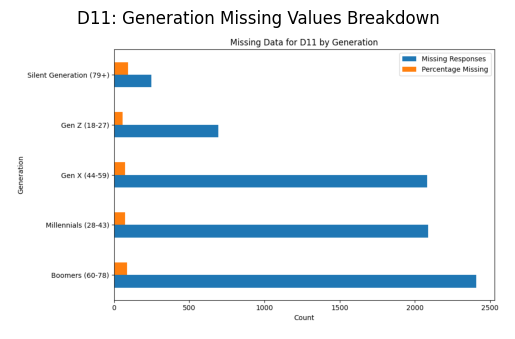


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        4344             5467               79.46
2.0                         462              642               71.96
6.0                          67              102               65.69
5.0                          59               78               75.64
9.0                          50               90               55.56
3.0                          28               33               84.85
7.0                          23               28               82.14
8.0                          23               42               54.76
4.0                          14               18               77.78


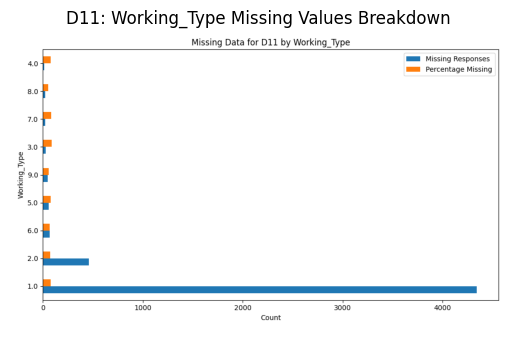


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           3150             5073   
2                                           1991             2367   
3                                           1227             1338   
4                                            572              618   
5                                            313              327   
6                                            158              161   
7                                             56               58   
8                                             31               32   
9                                             26               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           62.09

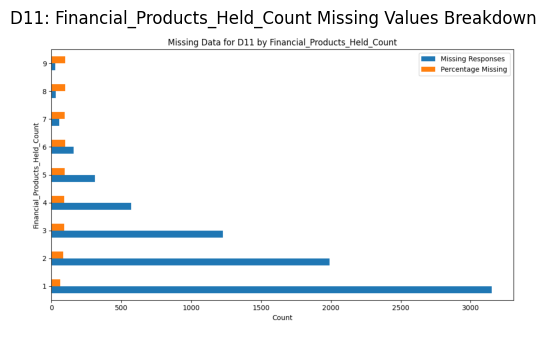


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 7524            10000               75.24


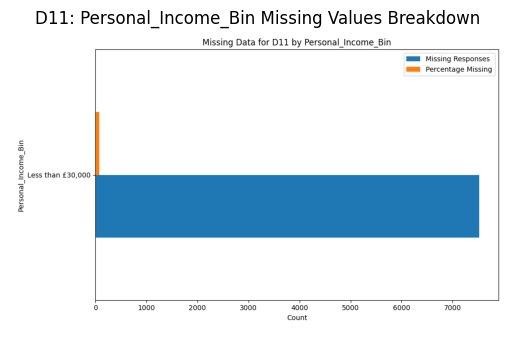


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           3466             5942   
2                                           2156             2156   
3                                           1128             1128   
4                                            494              494   
5                                            181              181   
6                                             65               65   
7                                             24               24   
8                                             10               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           58.33  
2                                          100.00  
3             

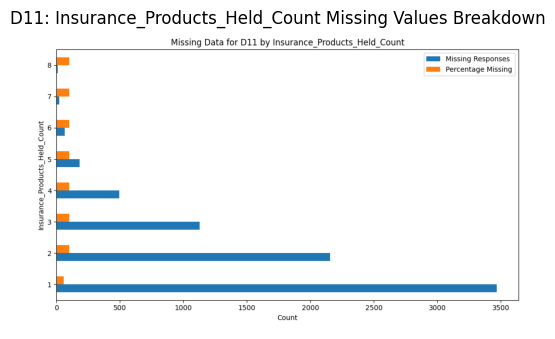


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        6095             7854               77.60
14.0                        353              470               75.11
4.0                         224              360               62.22
9.0                         106              151               70.20
10.0                         89              141               63.12
2.0                          85              100               85.00
15.0                         75              111               67.57
6.0                          62               79               78.48
16.0                         50               57               87.72
12.0                         43               59               72.88
8.0                          38               58               65.52
13.0                         38  

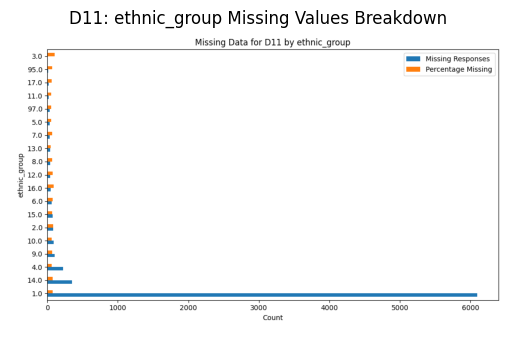


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

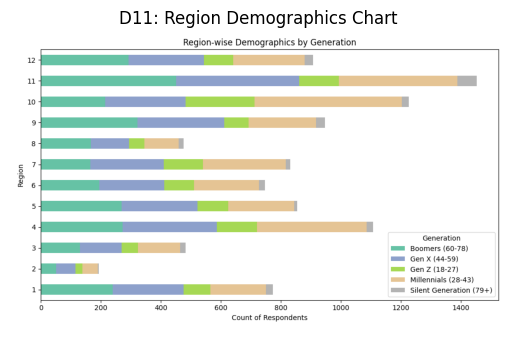


📄 Analyzing Sheet: D12

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


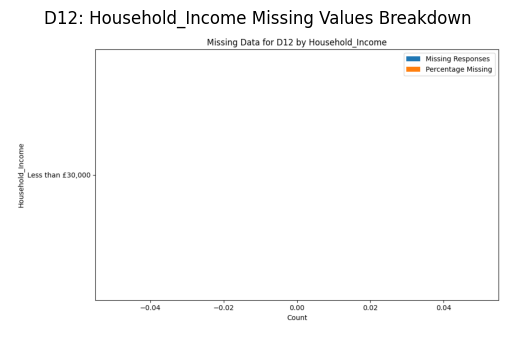


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


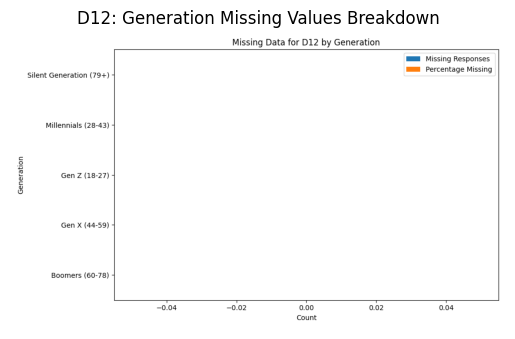


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


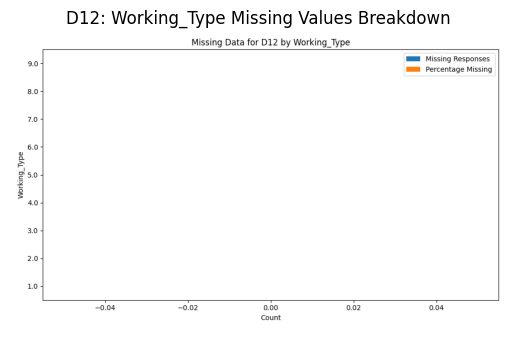


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

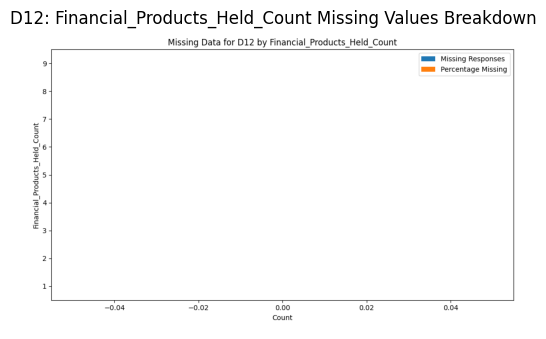


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


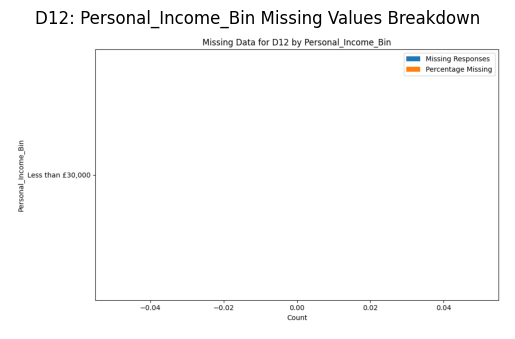


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

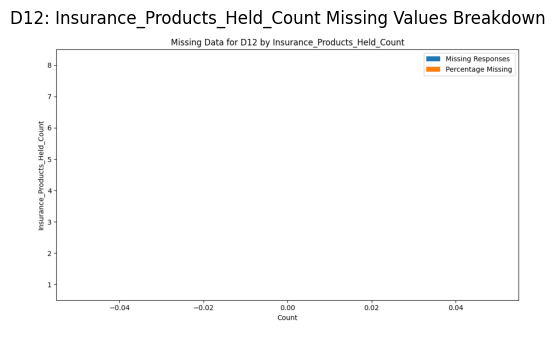


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

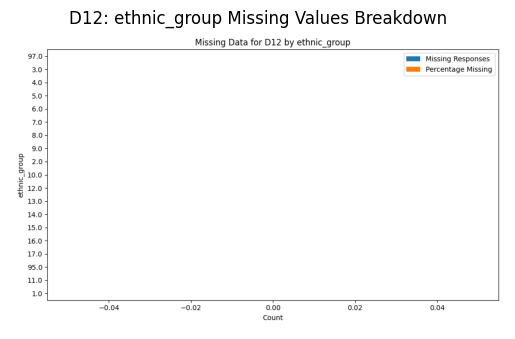


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

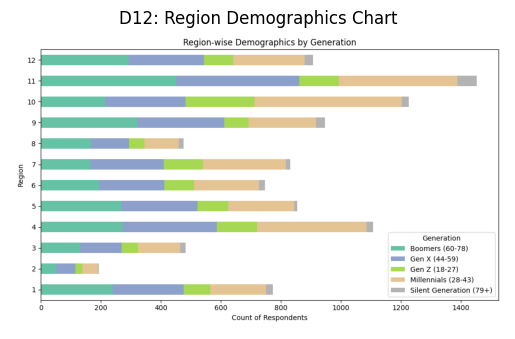


📄 Analyzing Sheet: D13

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               9738            10000               97.38


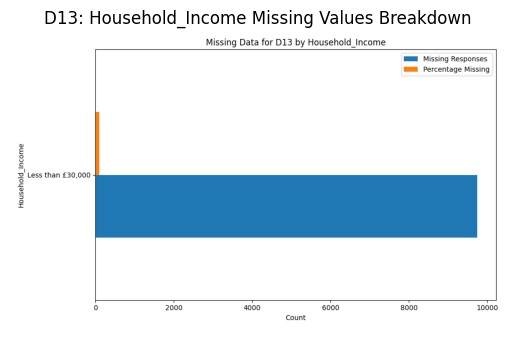


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2845             2924   
Gen X (44-59)                         2757             2808   
Boomers (60-78)                       2738             2774   
Gen Z (18-27)                         1131             1226   
Silent Generation (79+)                267              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   97.30  
Gen X (44-59)                         98.18  
Boomers (60-78)                       98.70  
Gen Z (18-27)                         92.25  
Silent Generation (79+)               99.63  


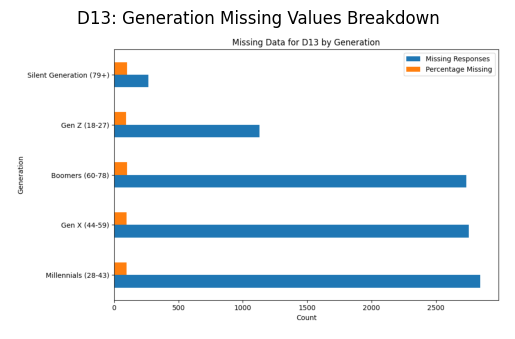


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        5338             5467               97.64
2.0                         626              642               97.51
6.0                         100              102               98.04
9.0                          82               90               91.11
5.0                          75               78               96.15
8.0                          37               42               88.10
3.0                          33               33              100.00
7.0                          27               28               96.43
4.0                          18               18              100.00


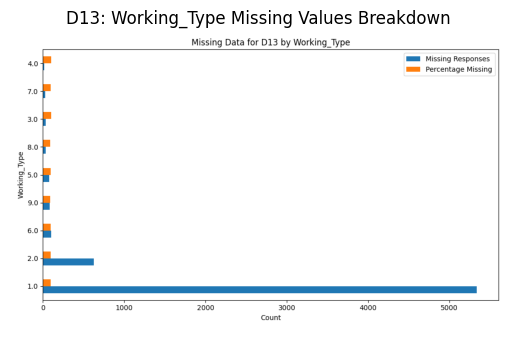


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4902             5073   
2                                           2315             2367   
3                                           1318             1338   
4                                            607              618   
5                                            324              327   
6                                            157              161   
7                                             58               58   
8                                             32               32   
9                                             25               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           96.63

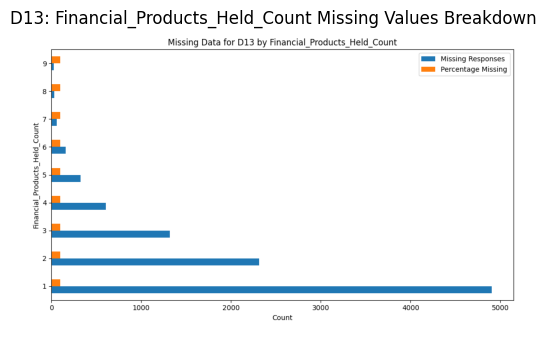


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 9738            10000               97.38


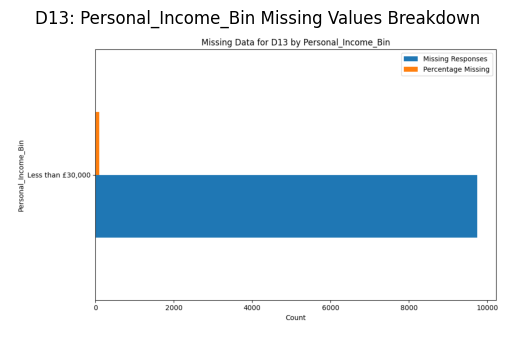


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5741             5942   
2                                           2122             2156   
3                                           1112             1128   
4                                            490              494   
5                                            178              181   
6                                             62               65   
7                                             24               24   
8                                              9               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           96.62  
2                                           98.42  
3             

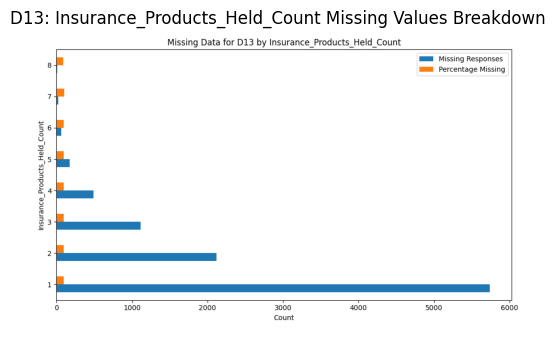


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        7699             7854               98.03
14.0                        449              470               95.53
4.0                         331              360               91.94
9.0                         142              151               94.04
10.0                        141              141              100.00
15.0                        103              111               92.79
2.0                          98              100               98.00
6.0                          75               79               94.94
13.0                         72               77               93.51
5.0                          60               62               96.77
16.0                         55               57               96.49
12.0                         54  

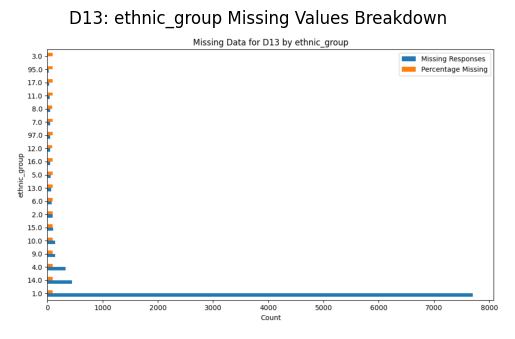


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

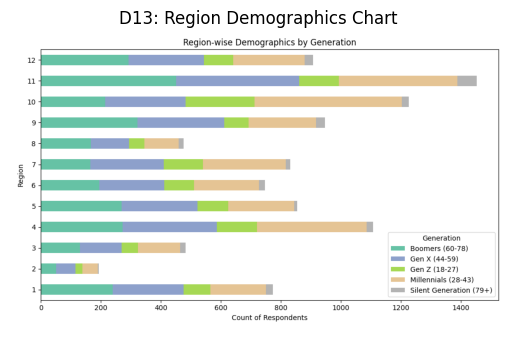


📄 Analyzing Sheet: D14A_CHILDREN

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


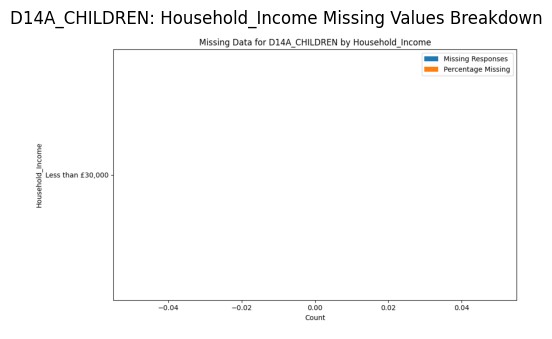


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


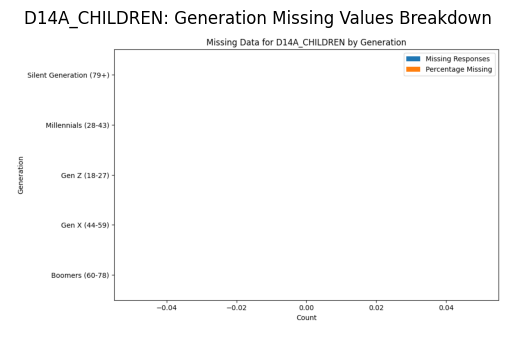


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


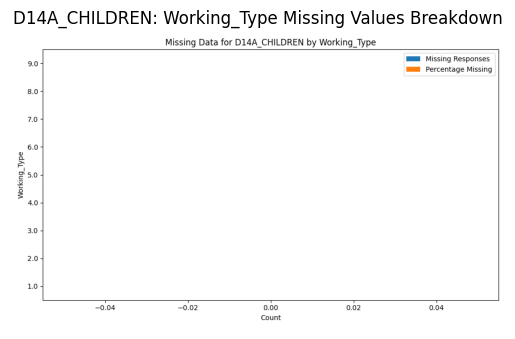


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

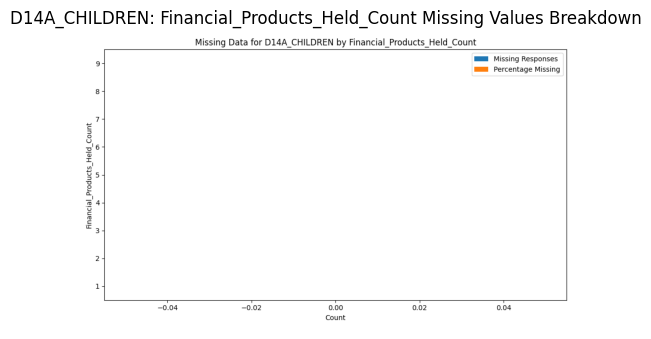


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


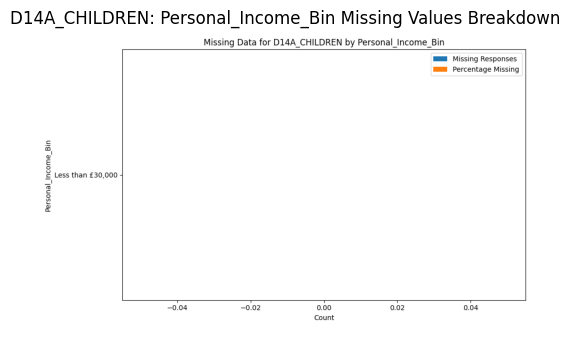


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

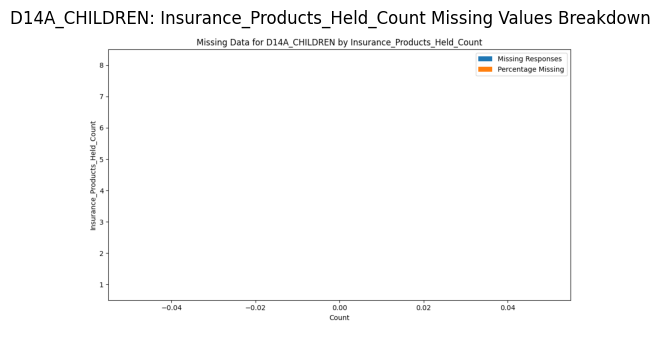


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

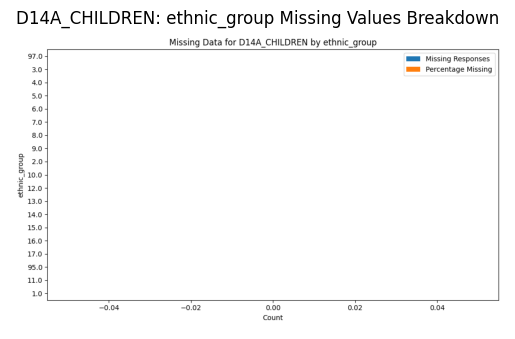


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

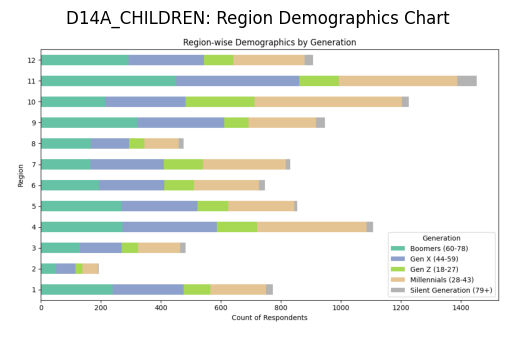


📄 Analyzing Sheet: D14B_CHILDREN

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               9674            10000               96.74


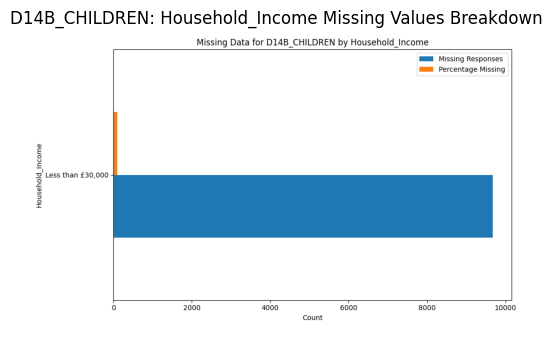


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2830             2924   
Boomers (60-78)                       2737             2774   
Gen X (44-59)                         2614             2808   
Gen Z (18-27)                         1226             1226   
Silent Generation (79+)                267              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   96.79  
Boomers (60-78)                       98.67  
Gen X (44-59)                         93.09  
Gen Z (18-27)                        100.00  
Silent Generation (79+)               99.63  


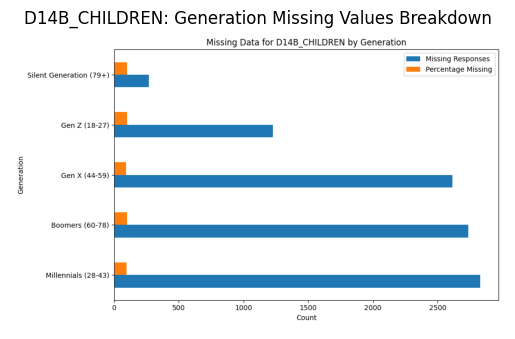


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        5247             5467               95.98
2.0                         616              642               95.95
6.0                          95              102               93.14
9.0                          84               90               93.33
5.0                          76               78               97.44
8.0                          40               42               95.24
3.0                          32               33               96.97
7.0                          27               28               96.43
4.0                          18               18              100.00


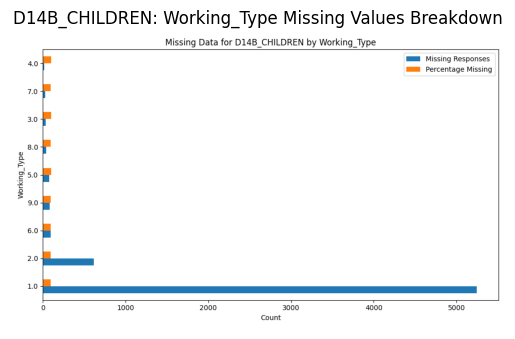


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4903             5073   
2                                           2306             2367   
3                                           1296             1338   
4                                            595              618   
5                                            312              327   
6                                            153              161   
7                                             55               58   
8                                             29               32   
9                                             25               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           96.65

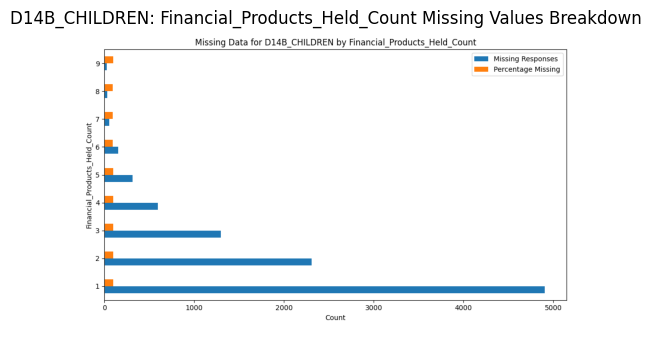


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 9674            10000               96.74


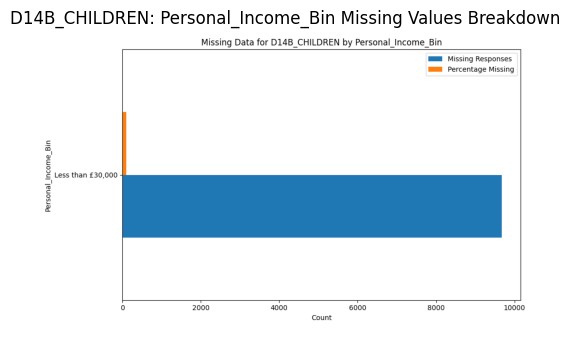


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5776             5942   
2                                           2083             2156   
3                                           1086             1128   
4                                            469              494   
5                                            166              181   
6                                             65               65   
7                                             20               24   
8                                              9               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           97.21  
2                                           96.61  
3             

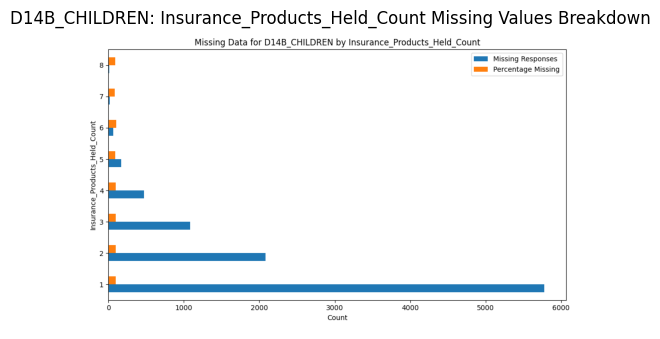


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        7617             7854               96.98
14.0                        457              470               97.23
4.0                         348              360               96.67
9.0                         144              151               95.36
10.0                        128              141               90.78
15.0                        107              111               96.40
2.0                          92              100               92.00
6.0                          76               79               96.20
13.0                         76               77               98.70
5.0                          57               62               91.94
97.0                         57               57              100.00
12.0                         55  

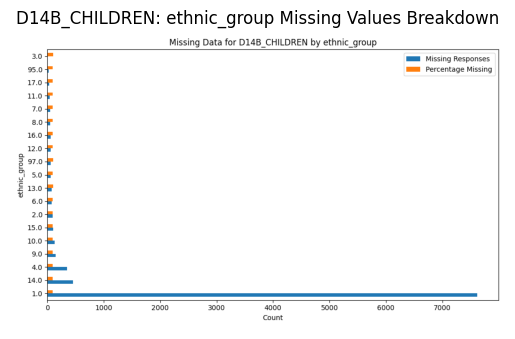


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

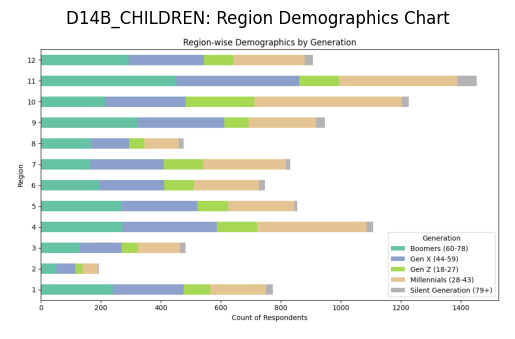


📄 Analyzing Sheet: D14C_CHILDREN

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


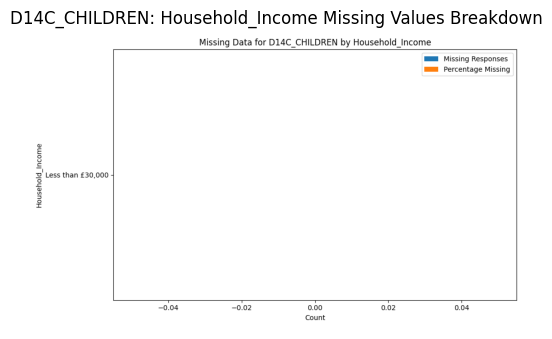


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


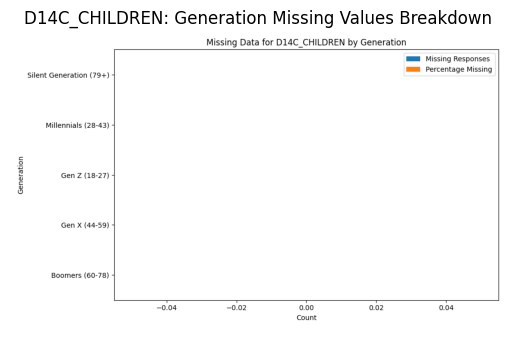


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


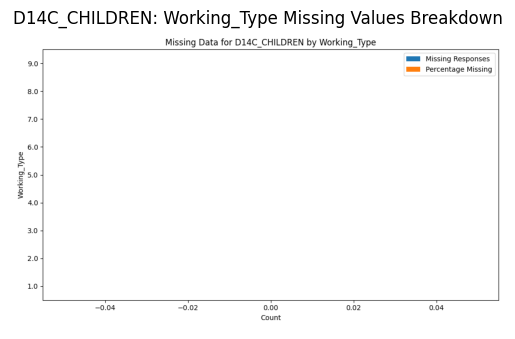


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

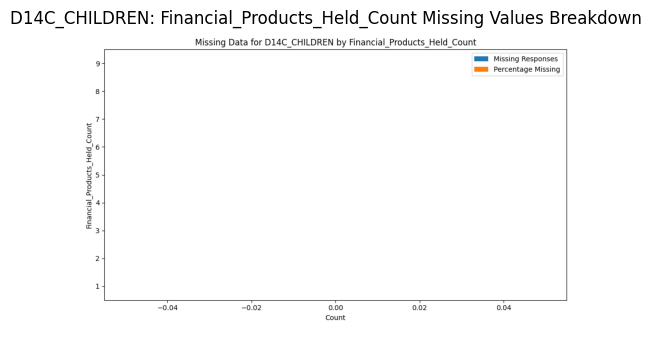


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


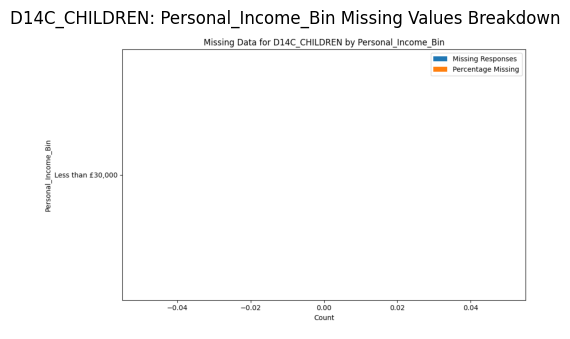


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

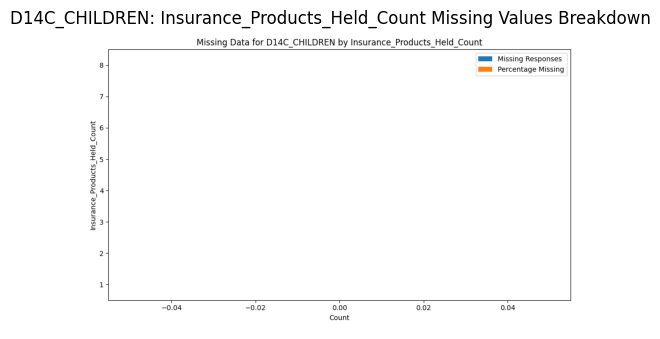


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

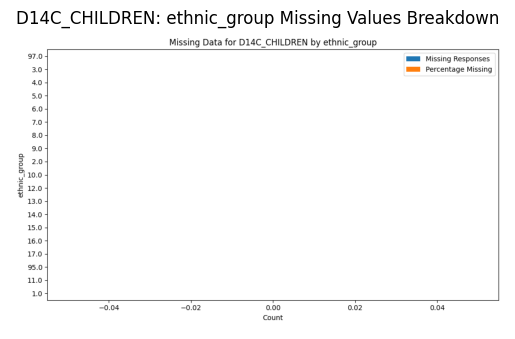


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

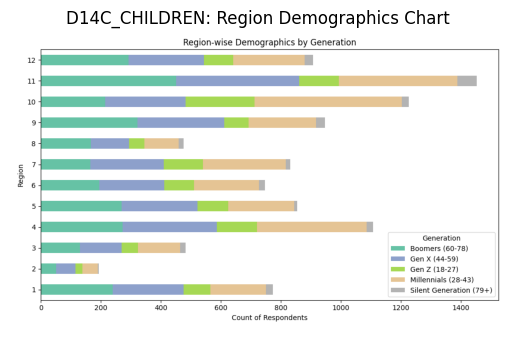


📄 Analyzing Sheet: Q1

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               3976            10000               39.76


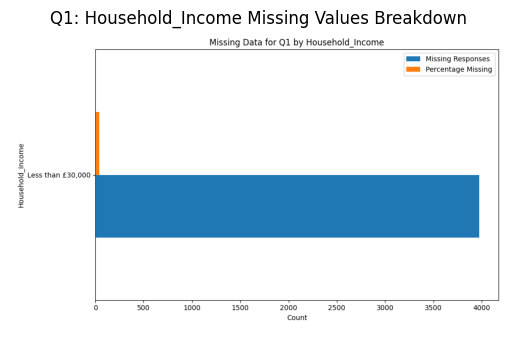


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   1360             2924   
Gen X (44-59)                         1108             2808   
Gen Z (18-27)                          827             1226   
Boomers (60-78)                        634             2774   
Silent Generation (79+)                 47              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   46.51  
Gen X (44-59)                         39.46  
Gen Z (18-27)                         67.46  
Boomers (60-78)                       22.86  
Silent Generation (79+)               17.54  


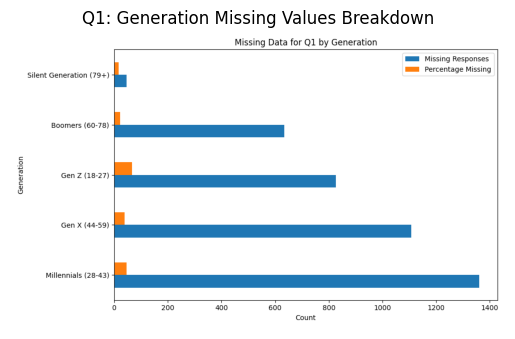


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        2041             5467               37.33
2.0                         257              642               40.03
6.0                          54              102               52.94
9.0                          52               90               57.78
5.0                          37               78               47.44
8.0                          30               42               71.43
7.0                          18               28               64.29
3.0                          12               33               36.36
4.0                          12               18               66.67


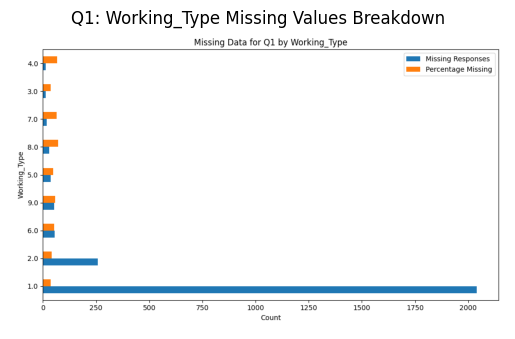


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           2744             5073   
2                                            760             2367   
3                                            297             1338   
4                                            116              618   
5                                             33              327   
6                                             14              161   
7                                              6               58   
8                                              3               32   
9                                              3               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           54.09

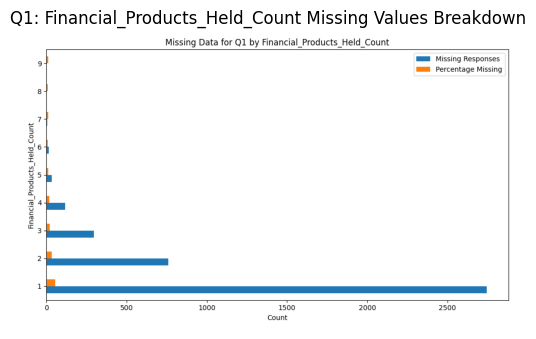


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 3976            10000               39.76


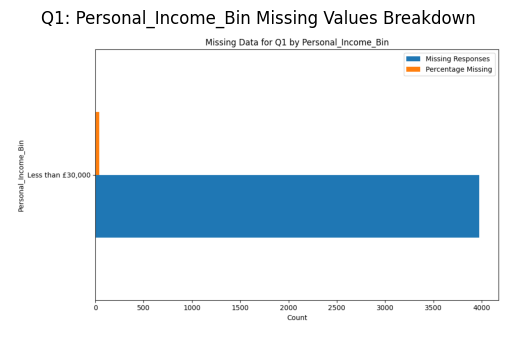


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           3097             5942   
2                                            538             2156   
3                                            227             1128   
4                                             79              494   
5                                             24              181   
6                                              5               65   
8                                              4               10   
7                                              2               24   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           52.12  
2                                           24.95  
3             

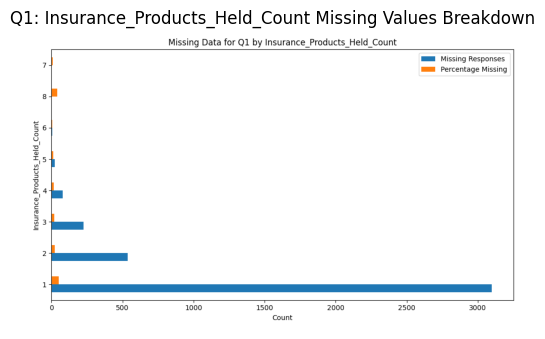


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        2780             7854               35.40
14.0                        293              470               62.34
4.0                         218              360               60.56
10.0                         72              141               51.06
15.0                         71              111               63.96
9.0                          69              151               45.70
13.0                         50               77               64.94
5.0                          42               62               67.74
6.0                          37               79               46.84
8.0                          37               58               63.79
97.0                         37               57               64.91
2.0                          31  

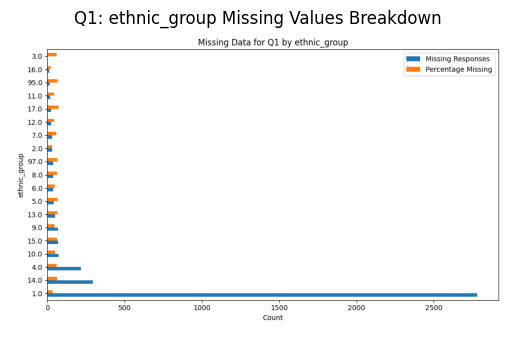


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

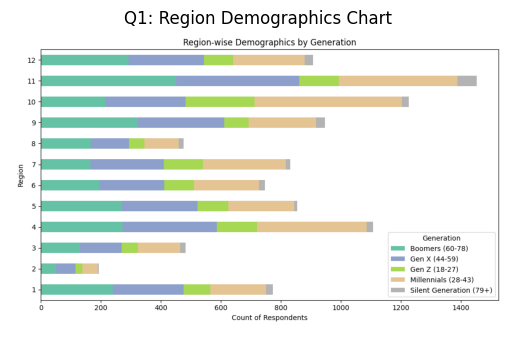


📄 Analyzing Sheet: Q2

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               7658            10000               76.58


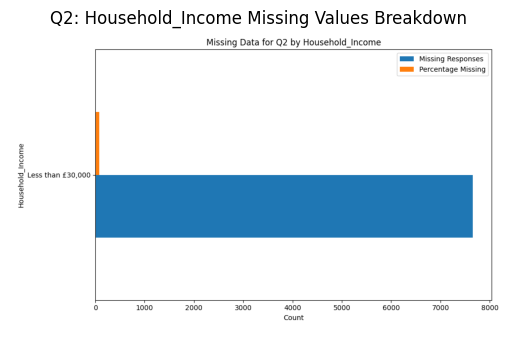


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       2510             2774   
Millennials (28-43)                   1949             2924   
Gen X (44-59)                         1925             2808   
Gen Z (18-27)                         1011             1226   
Silent Generation (79+)                263              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       90.48  
Millennials (28-43)                   66.66  
Gen X (44-59)                         68.55  
Gen Z (18-27)                         82.46  
Silent Generation (79+)               98.13  


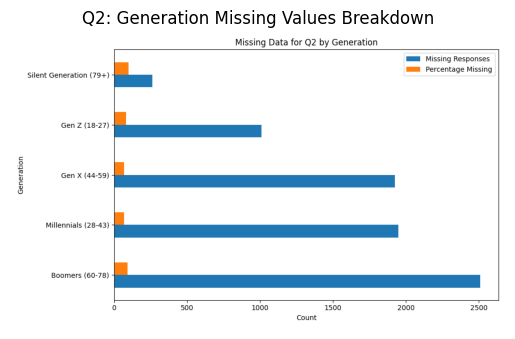


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3613             5467               66.09
2.0                         501              642               78.04
6.0                          80              102               78.43
9.0                          76               90               84.44
5.0                          63               78               80.77
8.0                          37               42               88.10
3.0                          24               33               72.73
7.0                          23               28               82.14
4.0                          17               18               94.44


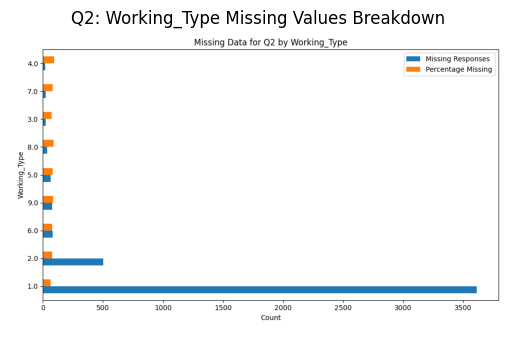


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4119             5073   
2                                           1703             2367   
3                                            946             1338   
4                                            440              618   
5                                            237              327   
6                                            123              161   
7                                             47               58   
9                                             22               26   
8                                             21               32   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           81.19

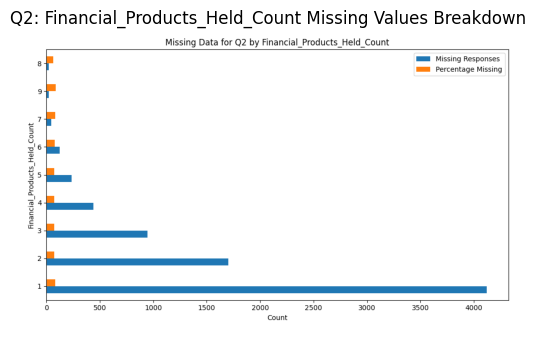


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 7658            10000               76.58


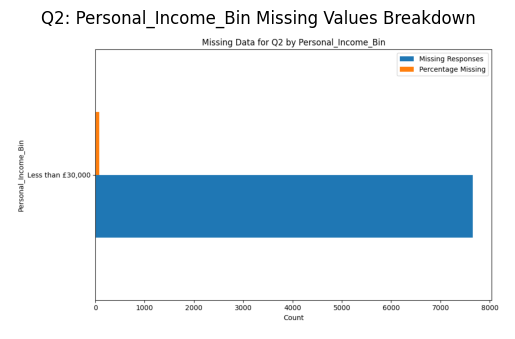


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5058             5942   
2                                           1504             2156   
3                                            671             1128   
4                                            262              494   
5                                            105              181   
6                                             34               65   
7                                             15               24   
8                                              9               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           85.12  
2                                           69.76  
3             

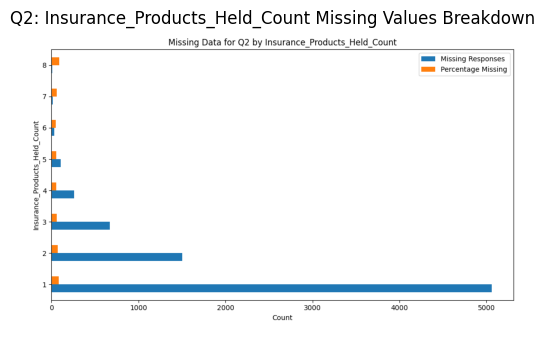


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        5988             7854               76.24
14.0                        381              470               81.06
4.0                         271              360               75.28
10.0                        108              141               76.60
9.0                         104              151               68.87
15.0                         94              111               84.68
2.0                          73              100               73.00
13.0                         60               77               77.92
5.0                          58               62               93.55
6.0                          58               79               73.42
97.0                         48               57               84.21
16.0                         46  

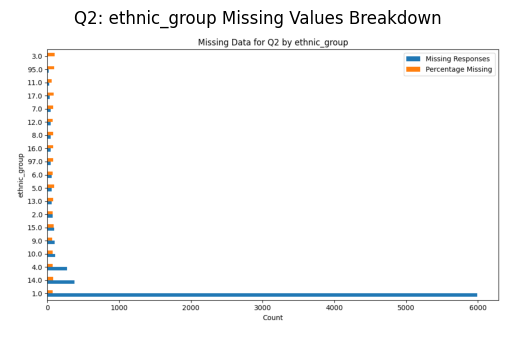


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

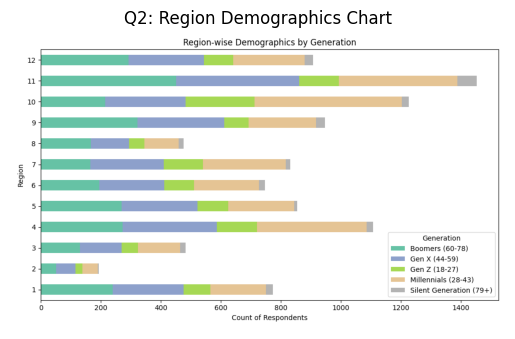


📄 Analyzing Sheet: Q3

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               7658            10000               76.58


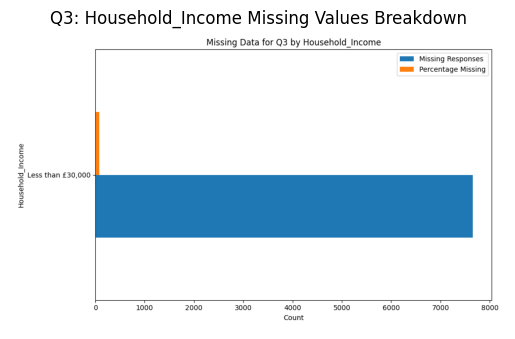


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       2510             2774   
Millennials (28-43)                   1949             2924   
Gen X (44-59)                         1925             2808   
Gen Z (18-27)                         1011             1226   
Silent Generation (79+)                263              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       90.48  
Millennials (28-43)                   66.66  
Gen X (44-59)                         68.55  
Gen Z (18-27)                         82.46  
Silent Generation (79+)               98.13  


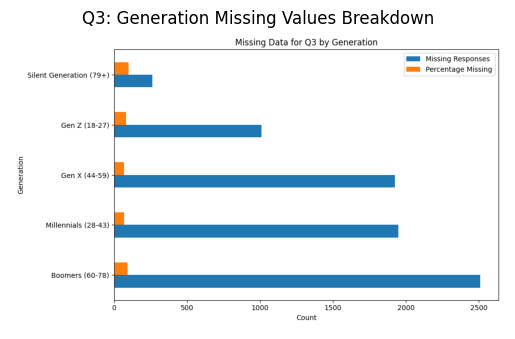


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3613             5467               66.09
2.0                         501              642               78.04
6.0                          80              102               78.43
9.0                          76               90               84.44
5.0                          63               78               80.77
8.0                          37               42               88.10
3.0                          24               33               72.73
7.0                          23               28               82.14
4.0                          17               18               94.44


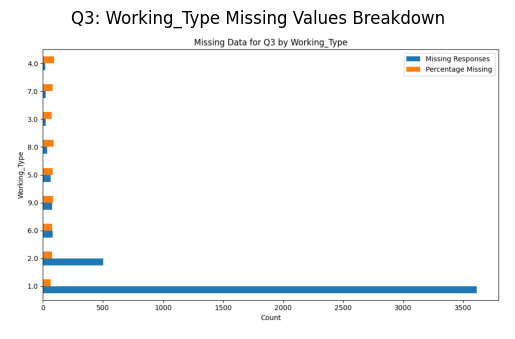


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4119             5073   
2                                           1703             2367   
3                                            946             1338   
4                                            440              618   
5                                            237              327   
6                                            123              161   
7                                             47               58   
9                                             22               26   
8                                             21               32   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           81.19

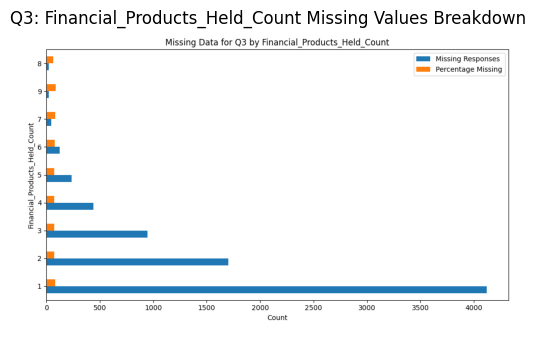


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 7658            10000               76.58


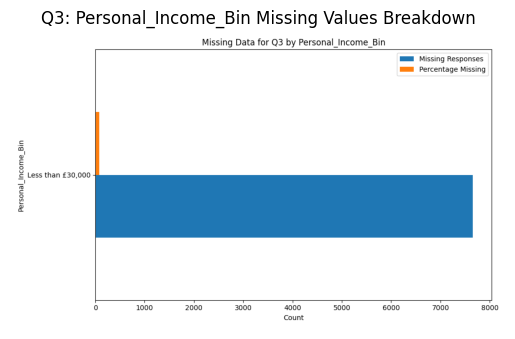


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5058             5942   
2                                           1504             2156   
3                                            671             1128   
4                                            262              494   
5                                            105              181   
6                                             34               65   
7                                             15               24   
8                                              9               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           85.12  
2                                           69.76  
3             

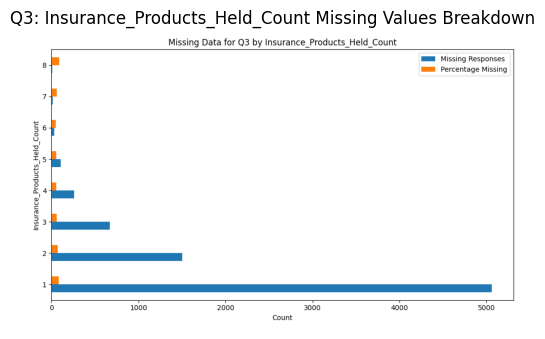


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        5988             7854               76.24
14.0                        381              470               81.06
4.0                         271              360               75.28
10.0                        108              141               76.60
9.0                         104              151               68.87
15.0                         94              111               84.68
2.0                          73              100               73.00
13.0                         60               77               77.92
5.0                          58               62               93.55
6.0                          58               79               73.42
97.0                         48               57               84.21
16.0                         46  

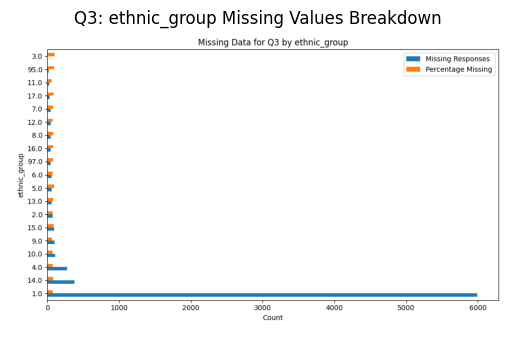


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

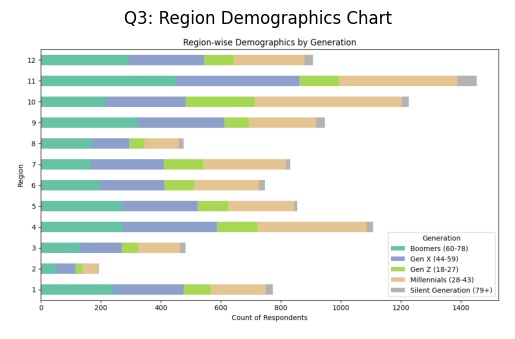


📄 Analyzing Sheet: Q4

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6656            10000               66.56


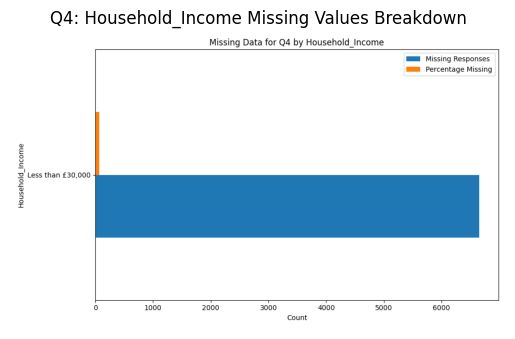


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       2175             2774   
Gen X (44-59)                         1800             2808   
Millennials (28-43)                   1776             2924   
Gen Z (18-27)                          681             1226   
Silent Generation (79+)                224              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       78.41  
Gen X (44-59)                         64.10  
Millennials (28-43)                   60.74  
Gen Z (18-27)                         55.55  
Silent Generation (79+)               83.58  


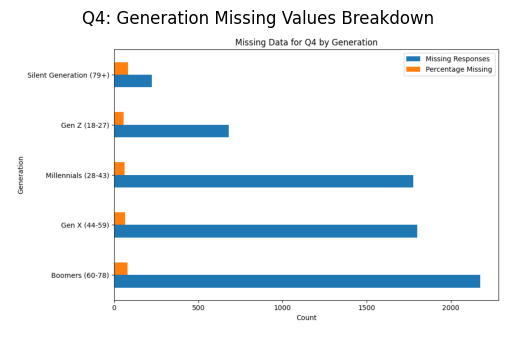


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3680             5467               67.31
2.0                         430              642               66.98
6.0                          58              102               56.86
9.0                          50               90               55.56
5.0                          47               78               60.26
3.0                          21               33               63.64
8.0                          14               42               33.33
7.0                          11               28               39.29
4.0                           8               18               44.44


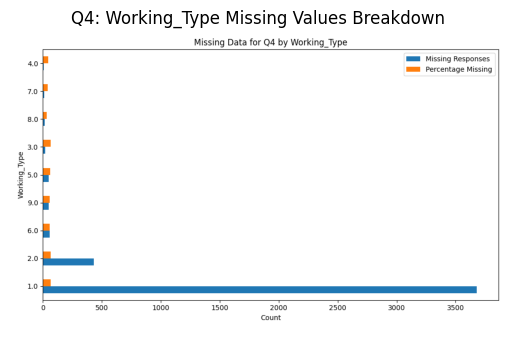


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           2779             5073   
2                                           1726             2367   
3                                           1083             1338   
4                                            517              618   
5                                            297              327   
6                                            150              161   
7                                             52               58   
8                                             29               32   
9                                             23               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           54.78

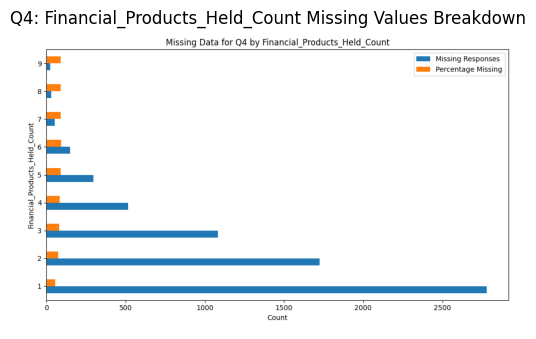


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6656            10000               66.56


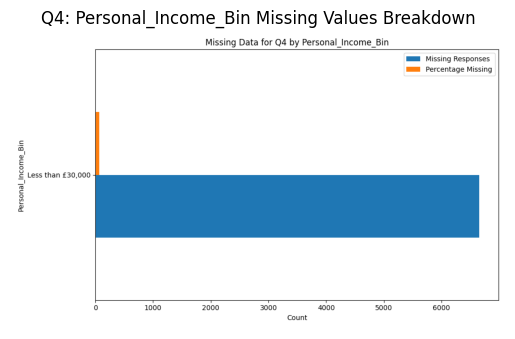


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           3416             5942   
2                                           1658             2156   
3                                            918             1128   
4                                            419              494   
5                                            157              181   
6                                             60               65   
7                                             22               24   
8                                              6               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           57.49  
2                                           76.90  
3             

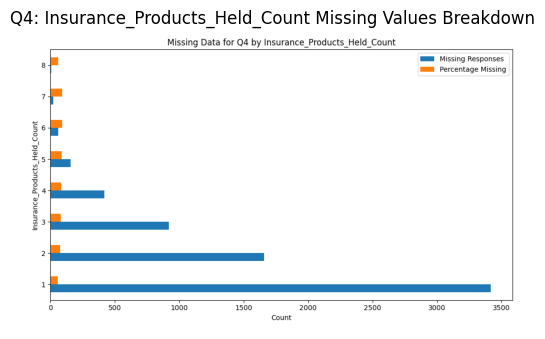


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        5502             7854               70.05
14.0                        204              470               43.40
4.0                         170              360               47.22
9.0                          92              151               60.93
10.0                         91              141               64.54
2.0                          74              100               74.00
15.0                         52              111               46.85
16.0                         47               57               82.46
6.0                          45               79               56.96
12.0                         37               59               62.71
13.0                         34               77               44.16
7.0                          31  

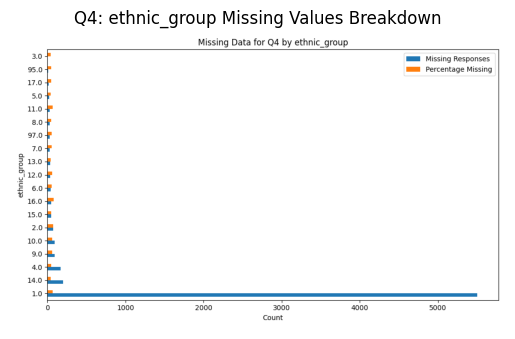


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

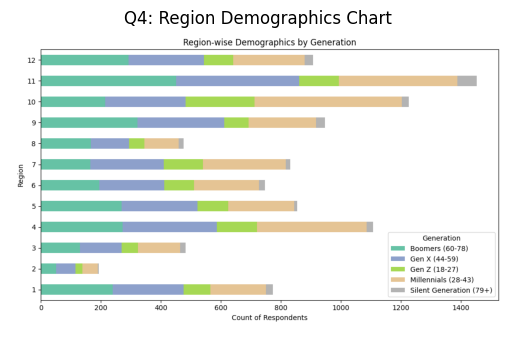


📄 Analyzing Sheet: Q5

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


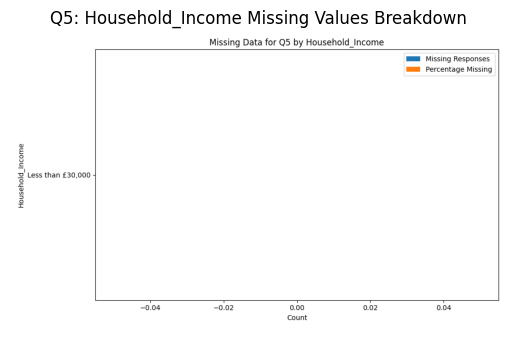


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


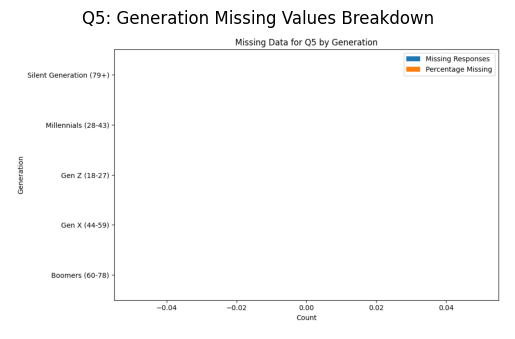


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


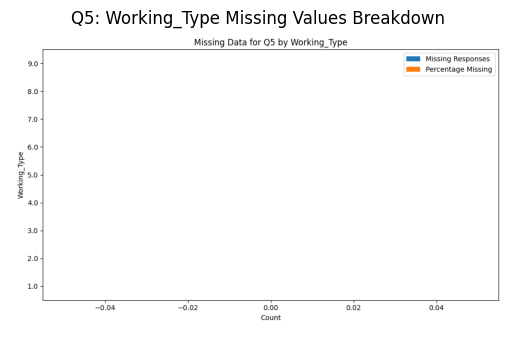


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

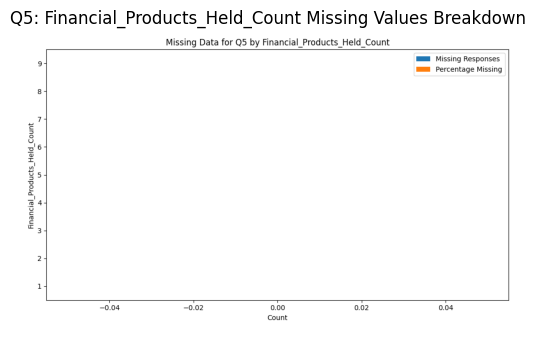


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


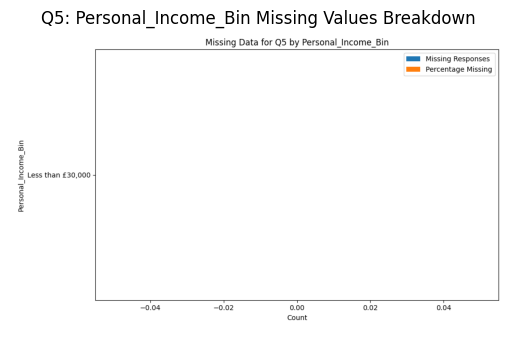


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

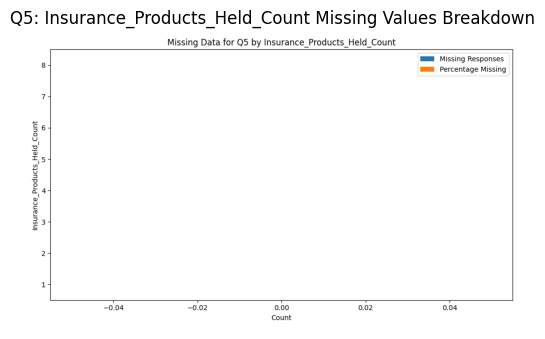


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

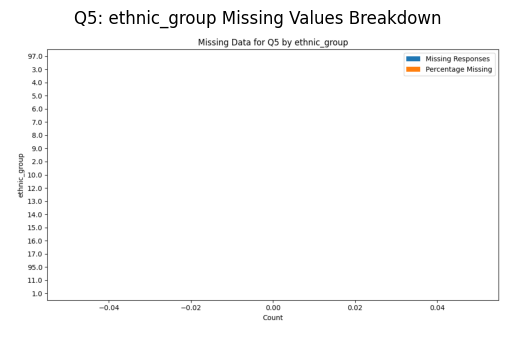


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

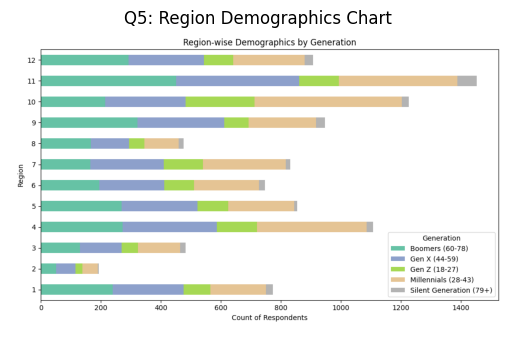


📄 Analyzing Sheet: Q6

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


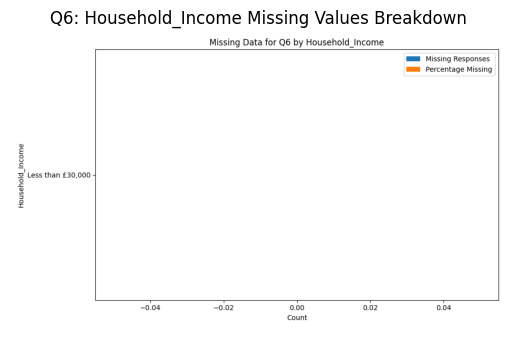


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


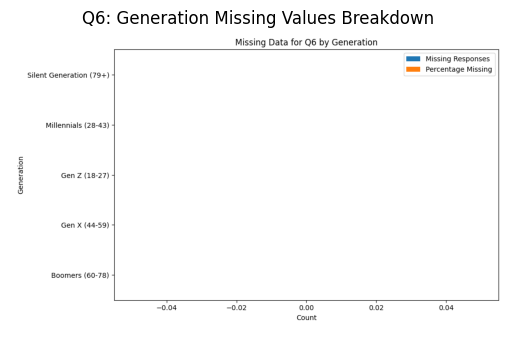


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


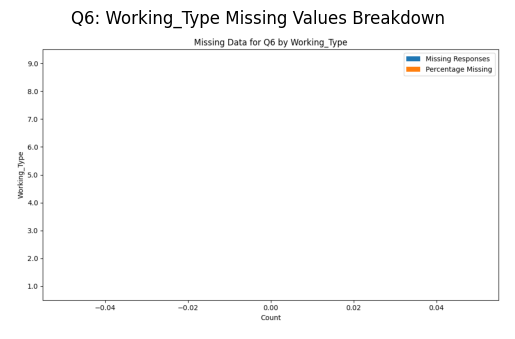


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

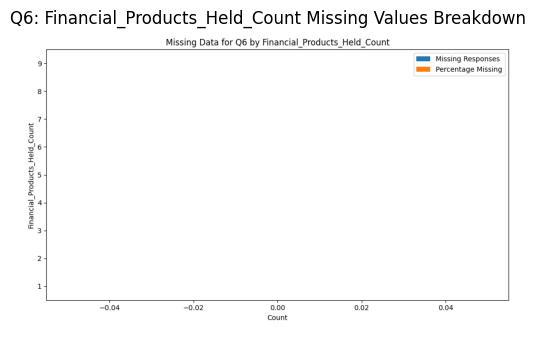


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


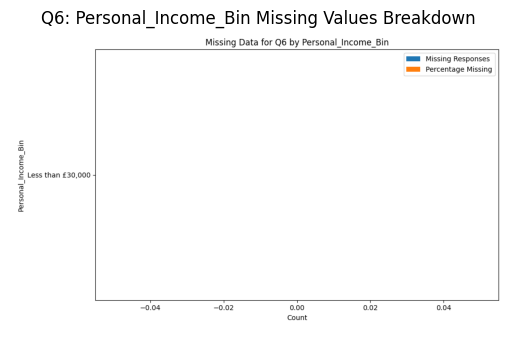


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

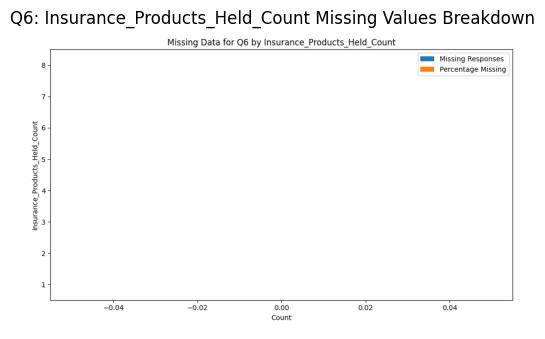


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

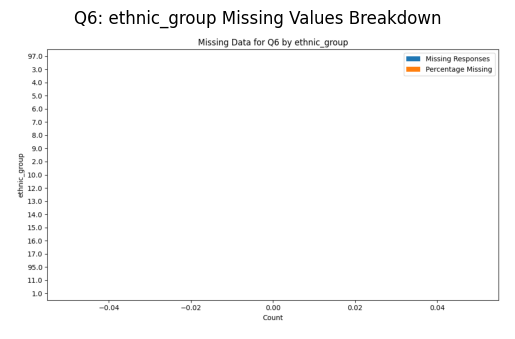


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

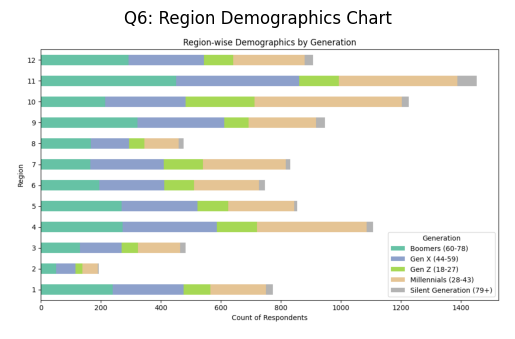


📄 Analyzing Sheet: Q7

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6028            10000               60.28


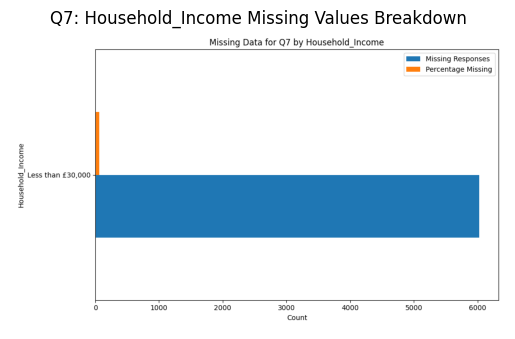


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       2027             2774   
Gen X (44-59)                         1610             2808   
Millennials (28-43)                   1426             2924   
Gen Z (18-27)                          743             1226   
Silent Generation (79+)                222              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       73.07  
Gen X (44-59)                         57.34  
Millennials (28-43)                   48.77  
Gen Z (18-27)                         60.60  
Silent Generation (79+)               82.84  


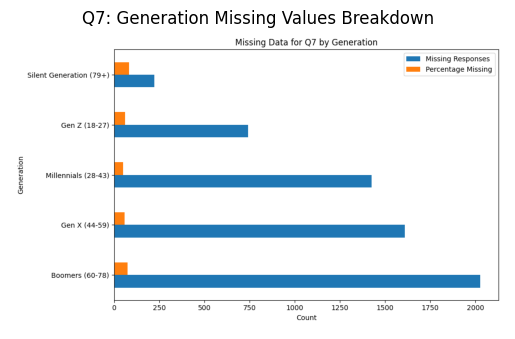


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        2862             5467               52.35
2.0                         394              642               61.37
9.0                          62               90               68.89
6.0                          53              102               51.96
5.0                          49               78               62.82
8.0                          21               42               50.00
7.0                          17               28               60.71
3.0                          13               33               39.39
4.0                          10               18               55.56


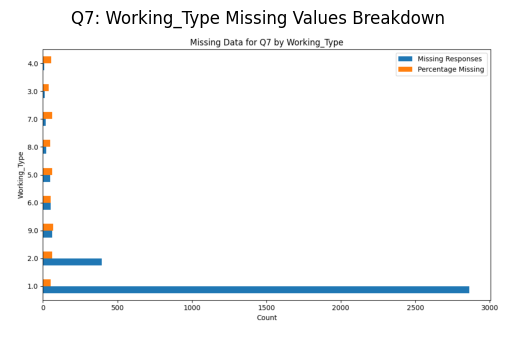


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           3067             5073   
2                                           1391             2367   
3                                            830             1338   
4                                            371              618   
5                                            204              327   
6                                             98              161   
7                                             34               58   
9                                             19               26   
8                                             14               32   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           60.46

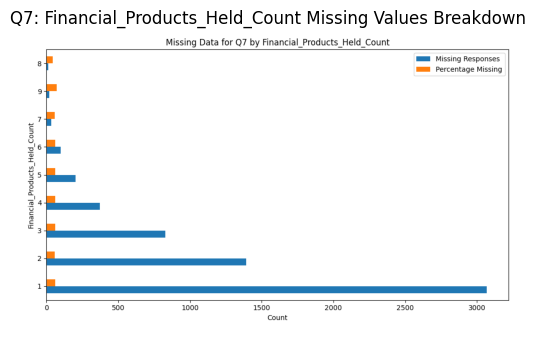


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6028            10000               60.28


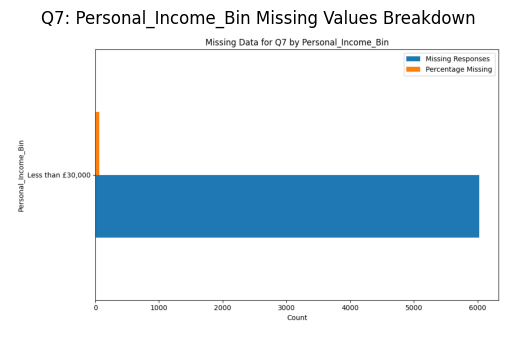


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           3801             5942   
2                                           1277             2156   
3                                            586             1128   
4                                            233              494   
5                                             82              181   
6                                             31               65   
7                                             13               24   
8                                              5               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           63.97  
2                                           59.23  
3             

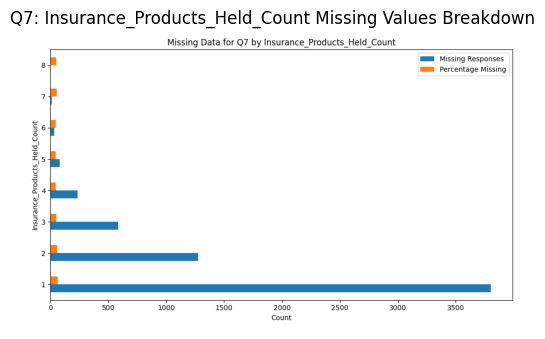


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        4798             7854               61.09
14.0                        242              470               51.49
4.0                         215              360               59.72
9.0                          92              151               60.93
10.0                         77              141               54.61
15.0                         59              111               53.15
2.0                          58              100               58.00
6.0                          45               79               56.96
13.0                         45               77               58.44
12.0                         43               59               72.88
97.0                         39               57               68.42
16.0                         34  

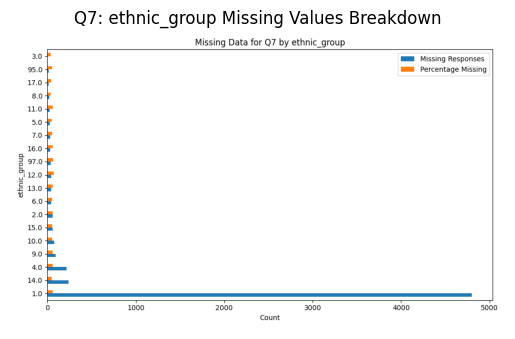


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

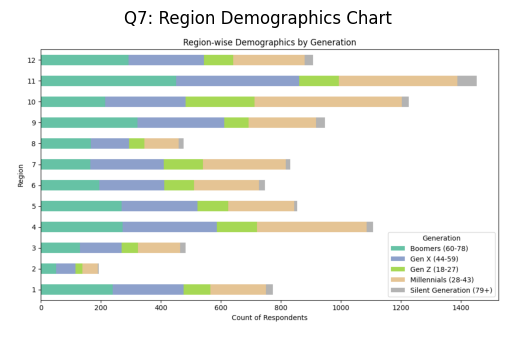


📄 Analyzing Sheet: Q8

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               3500            10000                35.0


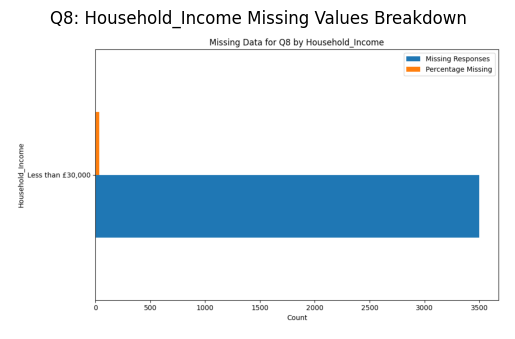


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       1829             2774   
Gen X (44-59)                          659             2808   
Millennials (28-43)                    382             2924   
Gen Z (18-27)                          381             1226   
Silent Generation (79+)                249              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       65.93  
Gen X (44-59)                         23.47  
Millennials (28-43)                   13.06  
Gen Z (18-27)                         31.08  
Silent Generation (79+)               92.91  


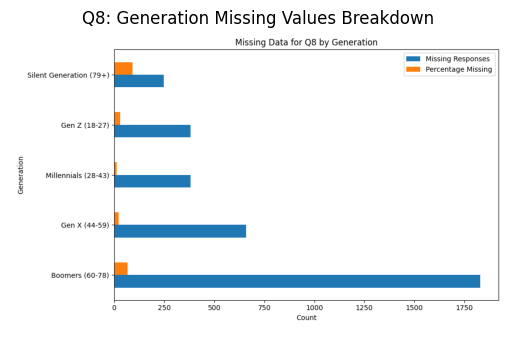


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


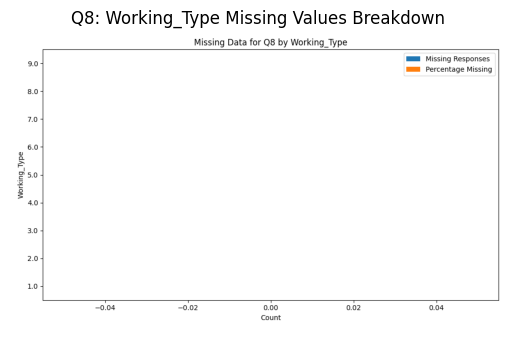


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           2255             5073   
2                                            677             2367   
3                                            301             1338   
4                                            141              618   
5                                             83              327   
6                                             29              161   
7                                              9               58   
8                                              3               32   
9                                              2               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           44.45

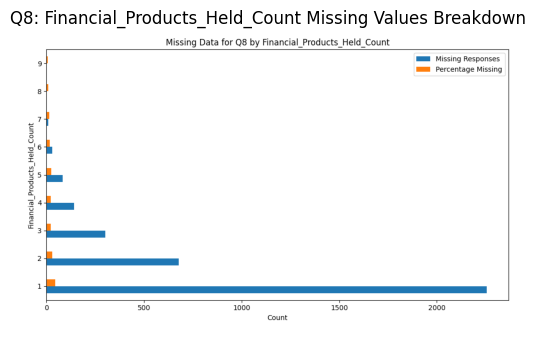


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 3500            10000                35.0


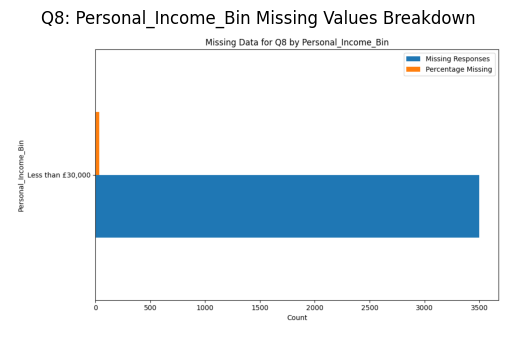


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         2447.0             5942   
2                                          724.0             2156   
3                                          238.0             1128   
4                                           68.0              494   
5                                           18.0              181   
6                                            3.0               65   
7                                            2.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           41.18  
2                                           33.58  
3             

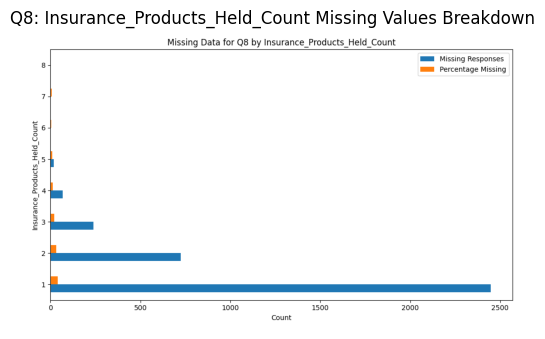


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      3008.0             7854               38.30
4.0                        74.0              360               20.56
9.0                        46.0              151               30.46
14.0                       44.0              470                9.36
10.0                       41.0              141               29.08
2.0                        30.0              100               30.00
15.0                       23.0              111               20.72
12.0                       22.0               59               37.29
7.0                        19.0               54               35.19
5.0                        19.0               62               30.65
13.0                       19.0               77               24.68
97.0                       15.0  

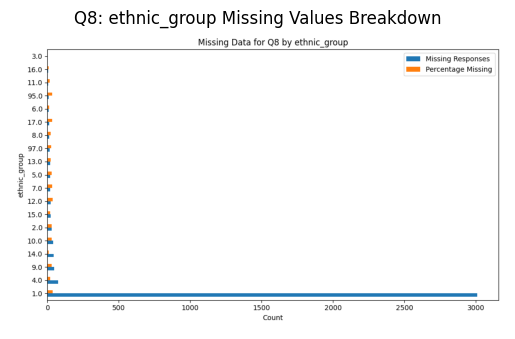


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

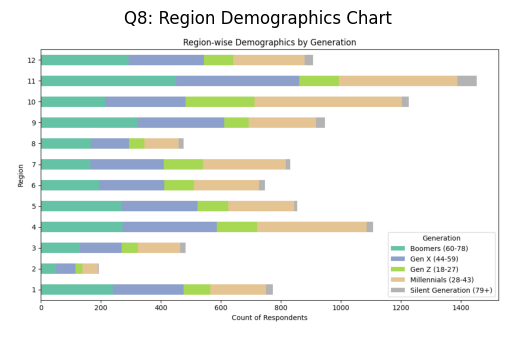


📄 Analyzing Sheet: Q9

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               3500            10000                35.0


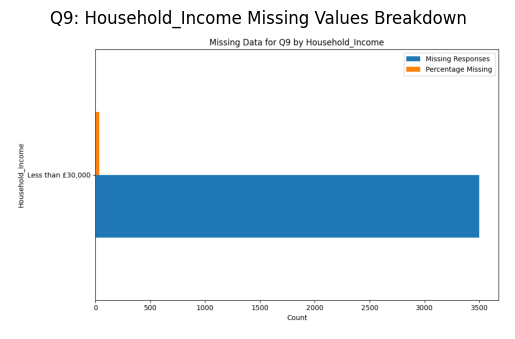


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       1829             2774   
Gen X (44-59)                          659             2808   
Millennials (28-43)                    382             2924   
Gen Z (18-27)                          381             1226   
Silent Generation (79+)                249              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       65.93  
Gen X (44-59)                         23.47  
Millennials (28-43)                   13.06  
Gen Z (18-27)                         31.08  
Silent Generation (79+)               92.91  


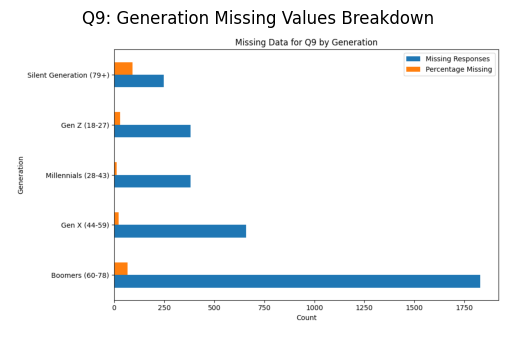


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


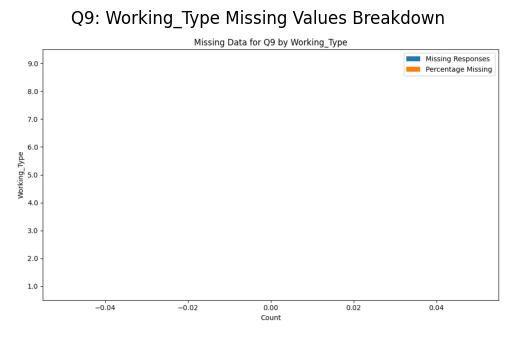


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           2255             5073   
2                                            677             2367   
3                                            301             1338   
4                                            141              618   
5                                             83              327   
6                                             29              161   
7                                              9               58   
8                                              3               32   
9                                              2               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           44.45

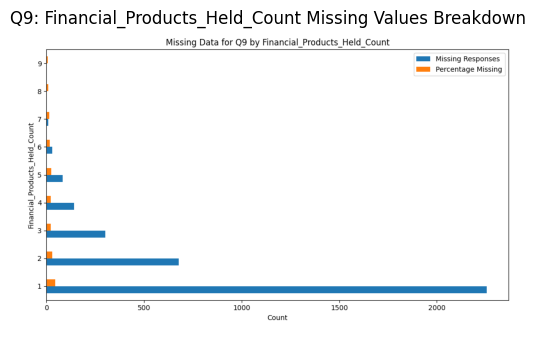


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 3500            10000                35.0


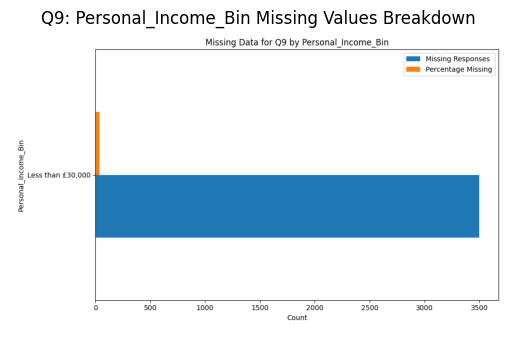


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         2447.0             5942   
2                                          724.0             2156   
3                                          238.0             1128   
4                                           68.0              494   
5                                           18.0              181   
6                                            3.0               65   
7                                            2.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           41.18  
2                                           33.58  
3             

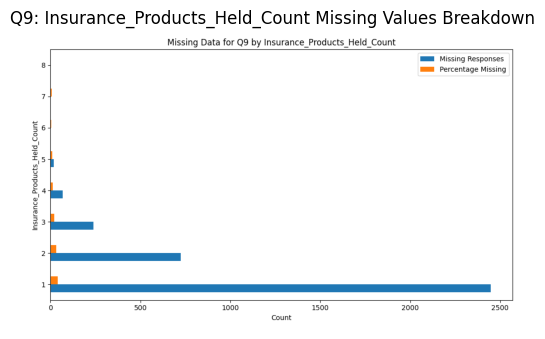


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      3008.0             7854               38.30
4.0                        74.0              360               20.56
9.0                        46.0              151               30.46
14.0                       44.0              470                9.36
10.0                       41.0              141               29.08
2.0                        30.0              100               30.00
15.0                       23.0              111               20.72
12.0                       22.0               59               37.29
7.0                        19.0               54               35.19
5.0                        19.0               62               30.65
13.0                       19.0               77               24.68
97.0                       15.0  

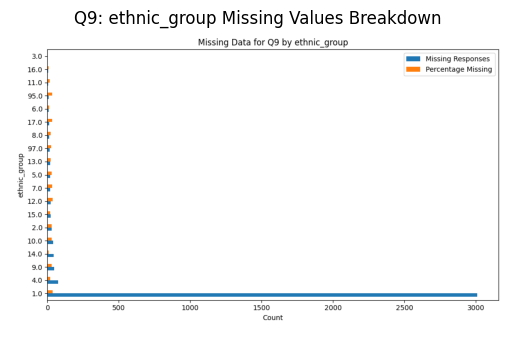


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

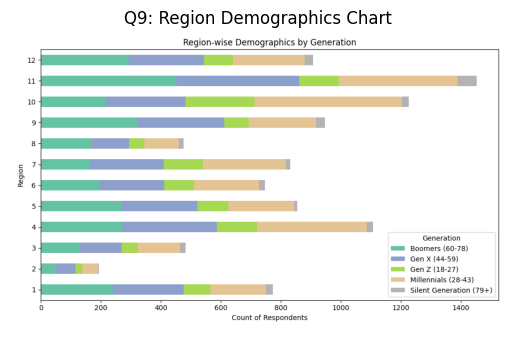


📄 Analyzing Sheet: Q10

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               2558            10000               25.58


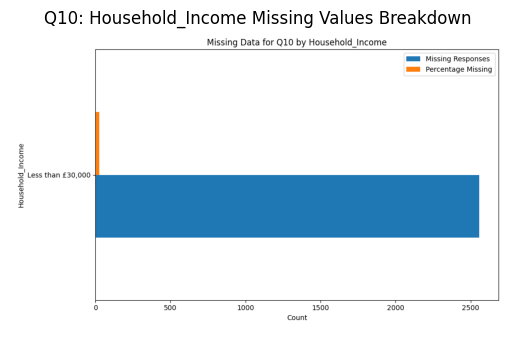


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                    793             2924   
Gen X (44-59)                          776             2808   
Boomers (60-78)                        561             2774   
Gen Z (18-27)                          378             1226   
Silent Generation (79+)                 50              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   27.12  
Gen X (44-59)                         27.64  
Boomers (60-78)                       20.22  
Gen Z (18-27)                         30.83  
Silent Generation (79+)               18.66  


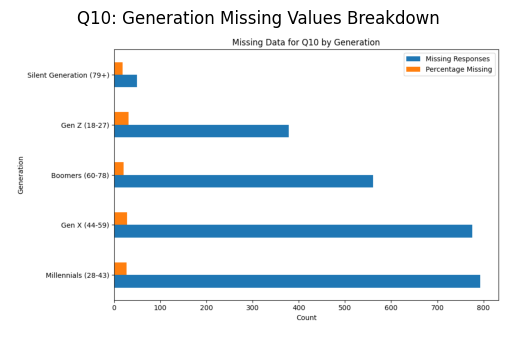


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        1195             5467               21.86
2.0                         176              642               27.41
9.0                          38               90               42.22
6.0                          33              102               32.35
5.0                          24               78               30.77
8.0                          17               42               40.48
3.0                          10               33               30.30
7.0                           6               28               21.43
4.0                           2               18               11.11


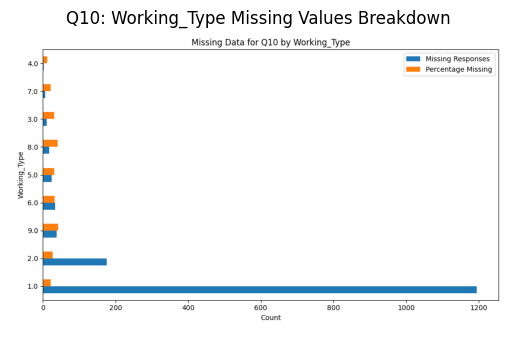


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         2243.0             5073   
2                                          195.0             2367   
3                                           76.0             1338   
4                                           32.0              618   
5                                            8.0              327   
6                                            2.0              161   
7                                            1.0               58   
8                                            1.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           44.21

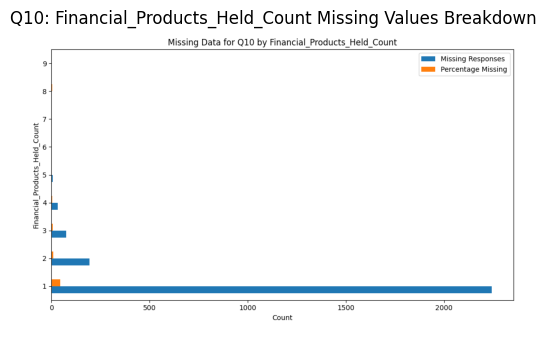


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 2558            10000               25.58


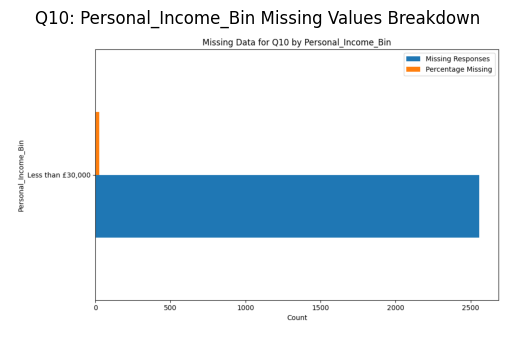


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         1884.0             5942   
2                                          397.0             2156   
3                                          190.0             1128   
4                                           53.0              494   
5                                           26.0              181   
6                                            6.0               65   
7                                            2.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           31.71  
2                                           18.41  
3             

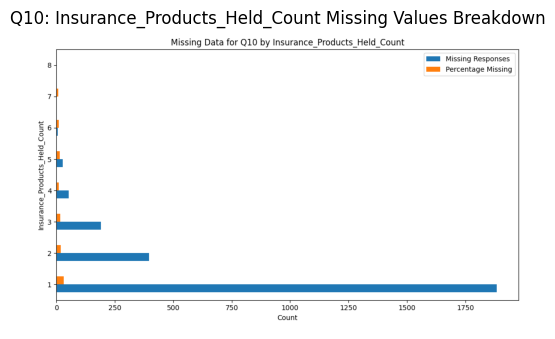


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        1896             7854               24.14
4.0                         112              360               31.11
14.0                        107              470               22.77
10.0                         54              141               38.30
9.0                          41              151               27.15
15.0                         34              111               30.63
13.0                         28               77               36.36
8.0                          25               58               43.10
5.0                          23               62               37.10
2.0                          22              100               22.00
6.0                          21               79               26.58
97.0                         20  

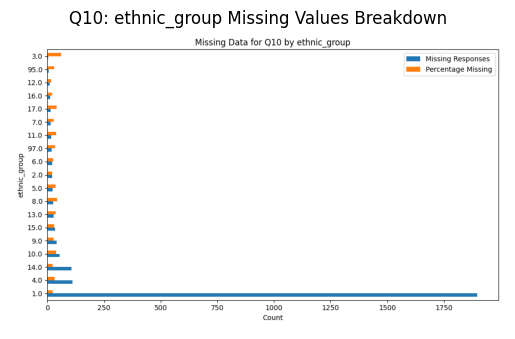


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

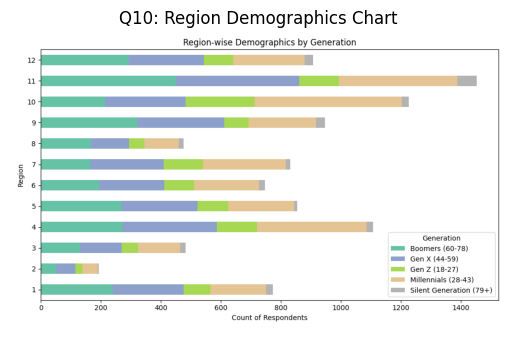


📄 Analyzing Sheet: Q11

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               8961            10000               89.61


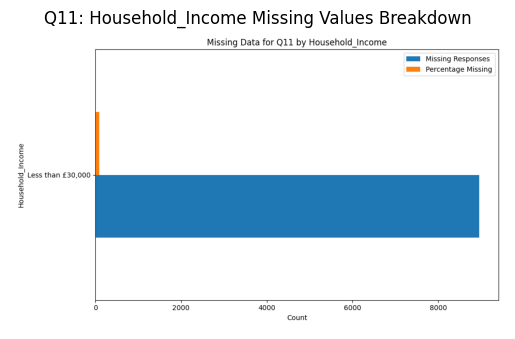


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2689             2924   
Gen X (44-59)                         2497             2808   
Boomers (60-78)                       2453             2774   
Gen Z (18-27)                         1089             1226   
Silent Generation (79+)                233              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   91.96  
Gen X (44-59)                         88.92  
Boomers (60-78)                       88.43  
Gen Z (18-27)                         88.83  
Silent Generation (79+)               86.94  


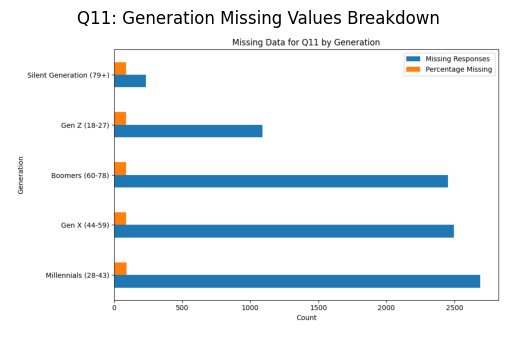


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        4986             5467               91.20
2.0                         586              642               91.28
6.0                          96              102               94.12
9.0                          79               90               87.78
5.0                          73               78               93.59
8.0                          35               42               83.33
3.0                          32               33               96.97
7.0                          28               28              100.00
4.0                          16               18               88.89


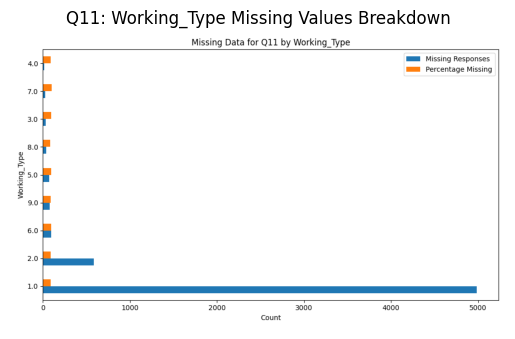


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4342             5073   
2                                           2181             2367   
3                                           1270             1338   
4                                            582              618   
5                                            315              327   
6                                            158              161   
7                                             56               58   
8                                             31               32   
9                                             26               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           85.59

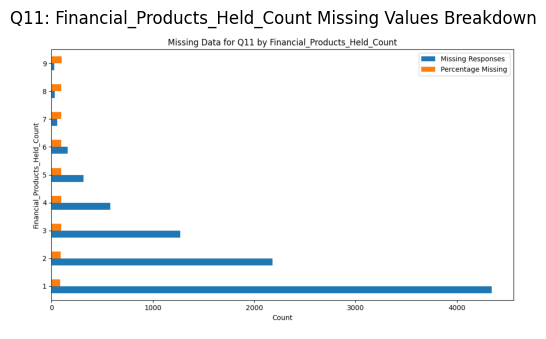


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 8961            10000               89.61


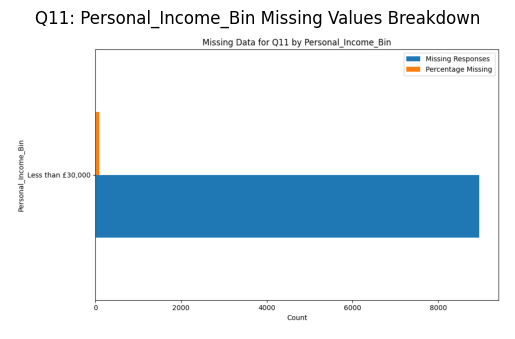


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5186             5942   
2                                           1982             2156   
3                                           1052             1128   
4                                            471              494   
5                                            172              181   
6                                             65               65   
7                                             24               24   
8                                              9               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           87.28  
2                                           91.93  
3             

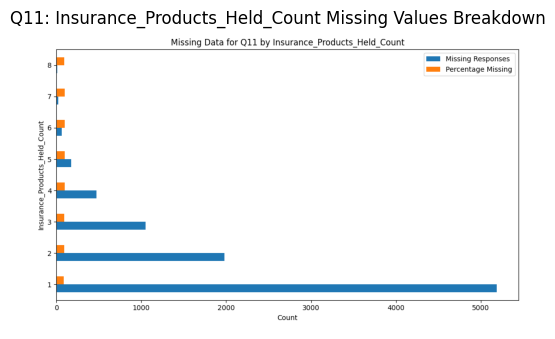


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        7052             7854               89.79
14.0                        442              470               94.04
4.0                         328              360               91.11
9.0                         131              151               86.75
10.0                        129              141               91.49
15.0                        103              111               92.79
2.0                          86              100               86.00
6.0                          77               79               97.47
13.0                         73               77               94.81
5.0                          58               62               93.55
16.0                         55               57               96.49
8.0                          54  

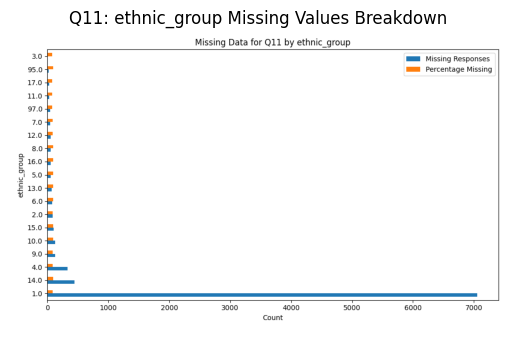


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

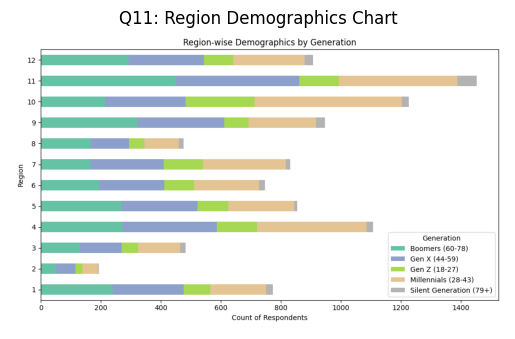


📄 Analyzing Sheet: Q12

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               9122            10000               91.22


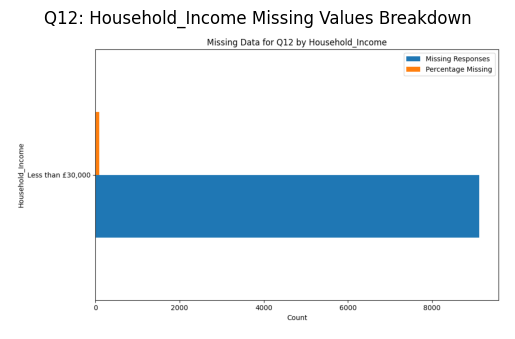


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2716             2924   
Gen X (44-59)                         2589             2808   
Boomers (60-78)                       2474             2774   
Gen Z (18-27)                         1119             1226   
Silent Generation (79+)                224              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   92.89  
Gen X (44-59)                         92.20  
Boomers (60-78)                       89.19  
Gen Z (18-27)                         91.27  
Silent Generation (79+)               83.58  


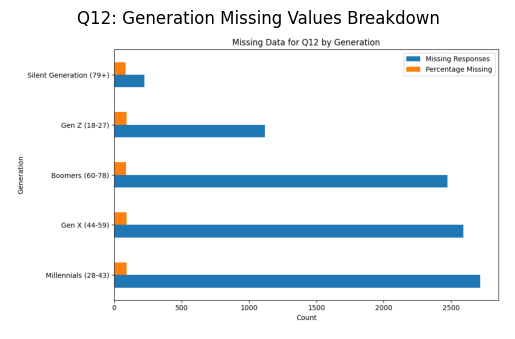


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        5102             5467               93.32
2.0                         591              642               92.06
6.0                          98              102               96.08
9.0                          76               90               84.44
5.0                          70               78               89.74
8.0                          33               42               78.57
3.0                          29               33               87.88
7.0                          27               28               96.43
4.0                          16               18               88.89


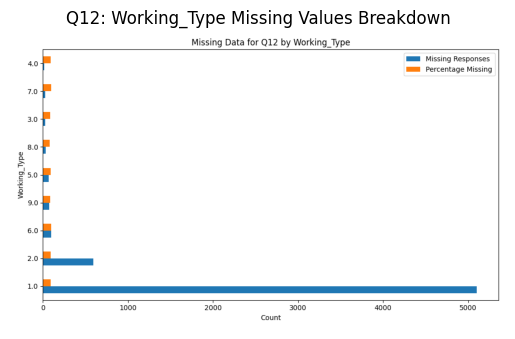


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4563             5073   
2                                           2225             2367   
3                                           1234             1338   
4                                            567              618   
5                                            295              327   
6                                            145              161   
7                                             51               58   
8                                             29               32   
9                                             13               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           89.95

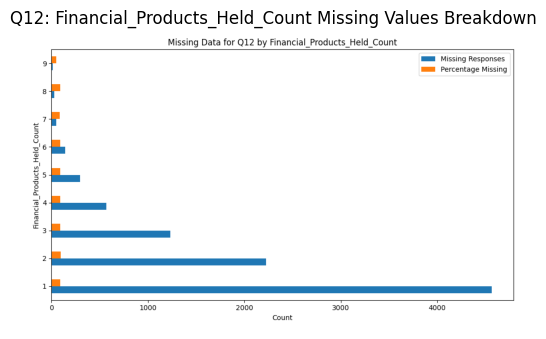


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 9122            10000               91.22


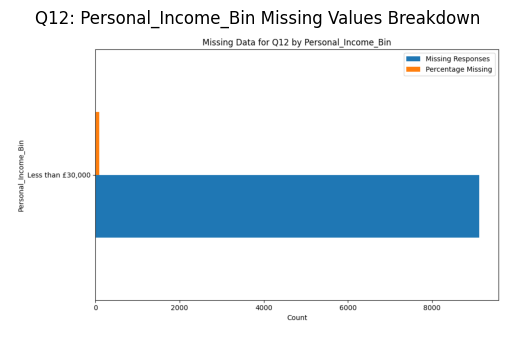


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5309             5942   
2                                           2013             2156   
3                                           1057             1128   
4                                            475              494   
5                                            174              181   
6                                             61               65   
7                                             23               24   
8                                             10               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           89.35  
2                                           93.37  
3             

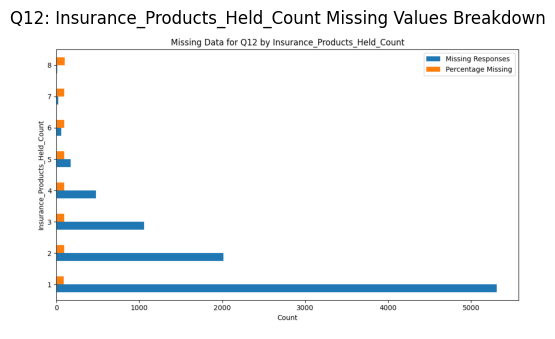


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        7165             7854               91.23
14.0                        448              470               95.32
4.0                         334              360               92.78
9.0                         141              151               93.38
10.0                        130              141               92.20
15.0                        103              111               92.79
2.0                          93              100               93.00
6.0                          74               79               93.67
13.0                         74               77               96.10
5.0                          57               62               91.94
8.0                          54               58               93.10
12.0                         53  

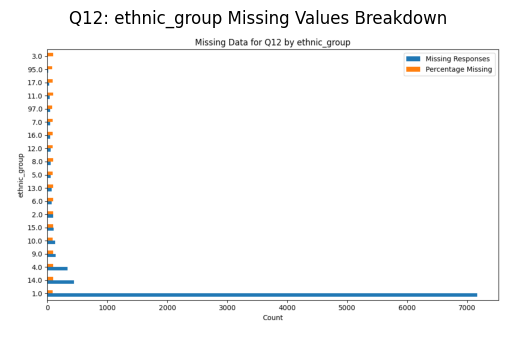


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

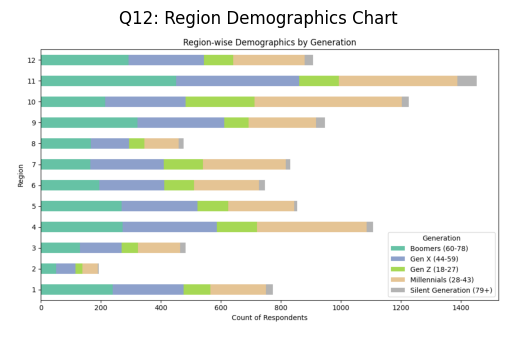


📄 Analyzing Sheet: Q13

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               9757            10000               97.57


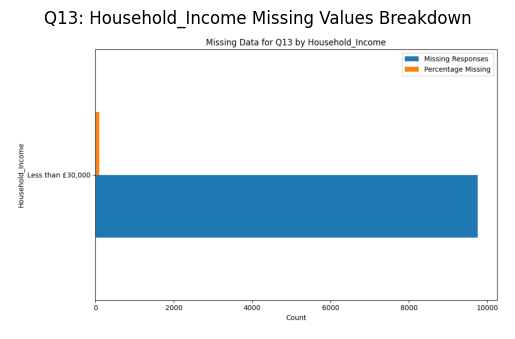


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2835             2924   
Boomers (60-78)                       2744             2774   
Gen X (44-59)                         2743             2808   
Gen Z (18-27)                         1168             1226   
Silent Generation (79+)                267              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   96.96  
Boomers (60-78)                       98.92  
Gen X (44-59)                         97.69  
Gen Z (18-27)                         95.27  
Silent Generation (79+)               99.63  


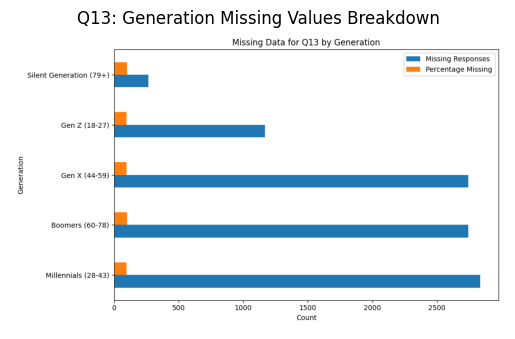


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        5349             5467               97.84
2.0                         621              642               96.73
6.0                         100              102               98.04
9.0                          87               90               96.67
5.0                          78               78              100.00
8.0                          39               42               92.86
3.0                          31               33               93.94
7.0                          28               28              100.00
4.0                          17               18               94.44


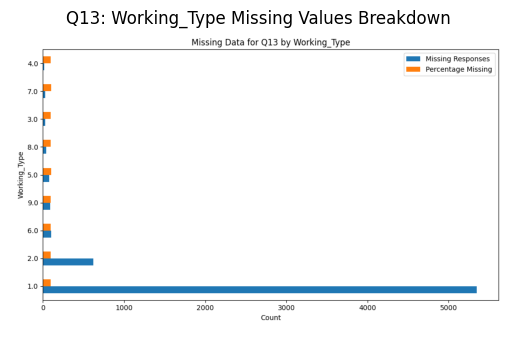


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4884             5073   
2                                           2339             2367   
3                                           1325             1338   
4                                            608              618   
5                                            324              327   
6                                            161              161   
7                                             58               58   
8                                             32               32   
9                                             26               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           96.27

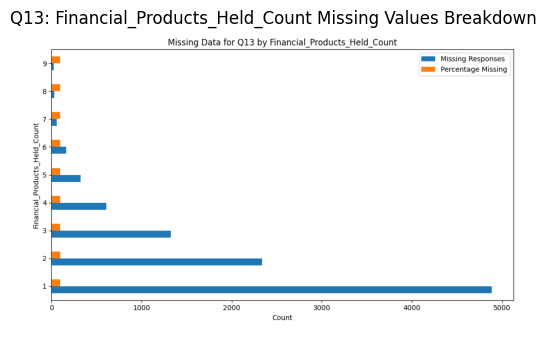


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 9757            10000               97.57


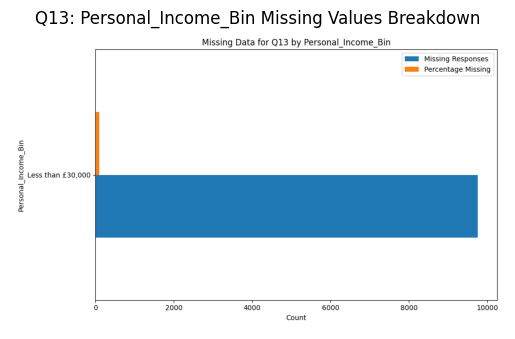


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5751             5942   
2                                           2134             2156   
3                                           1107             1128   
4                                            487              494   
5                                            179              181   
6                                             65               65   
7                                             24               24   
8                                             10               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           96.79  
2                                           98.98  
3             

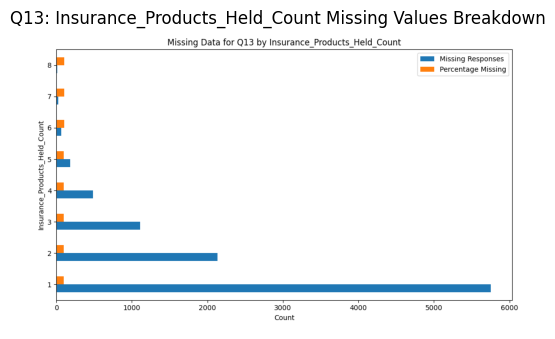


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        7718             7854               98.27
14.0                        455              470               96.81
4.0                         348              360               96.67
9.0                         148              151               98.01
10.0                        134              141               95.04
15.0                        107              111               96.40
2.0                          98              100               98.00
6.0                          77               79               97.47
13.0                         77               77              100.00
5.0                          60               62               96.77
12.0                         58               59               98.31
16.0                         56  

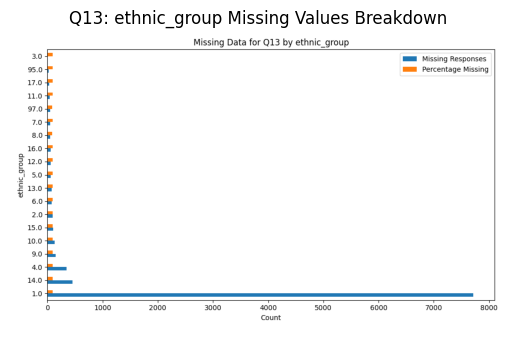


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

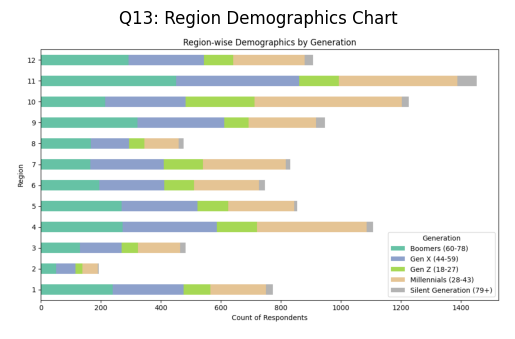


📄 Analyzing Sheet: Q14

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


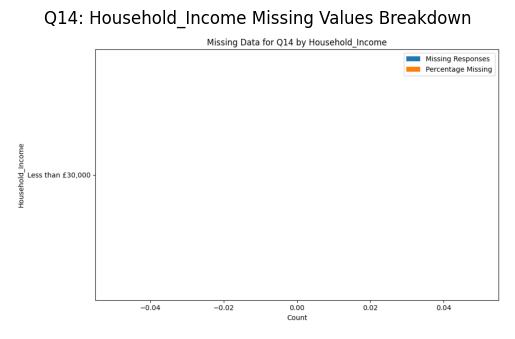


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


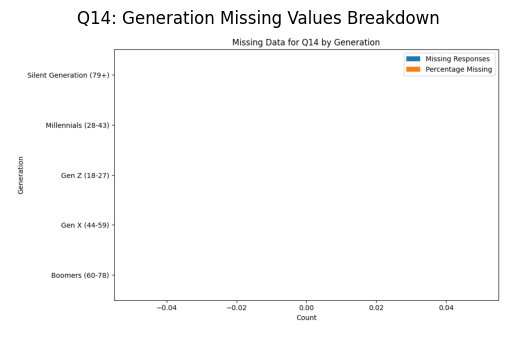


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


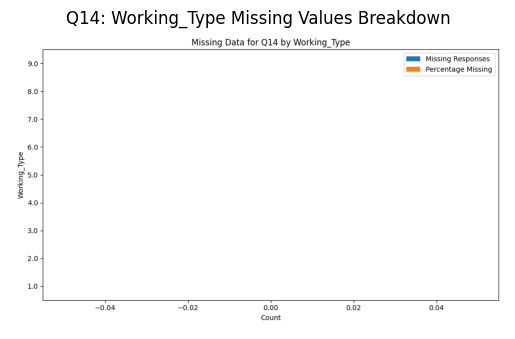


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

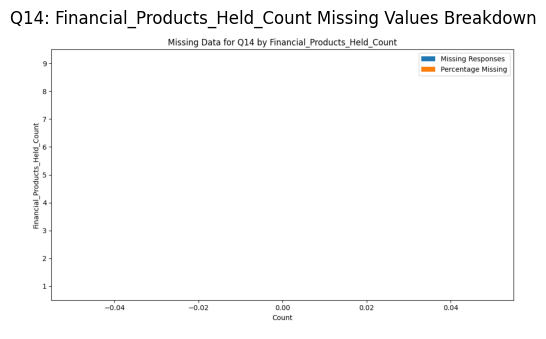


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


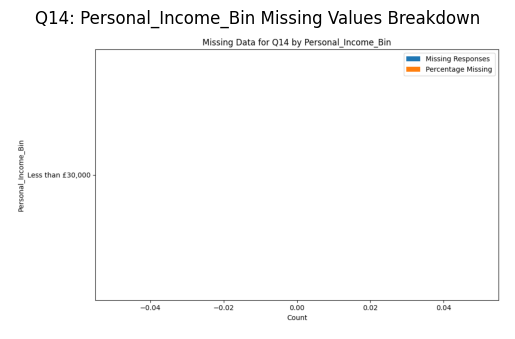


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

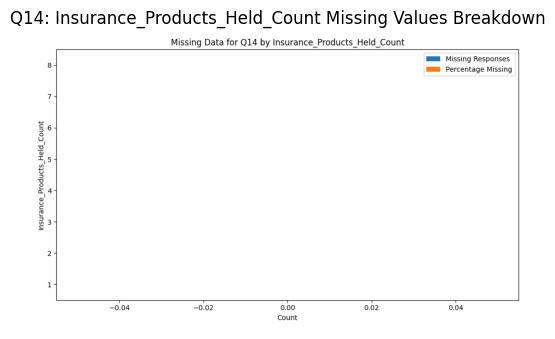


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

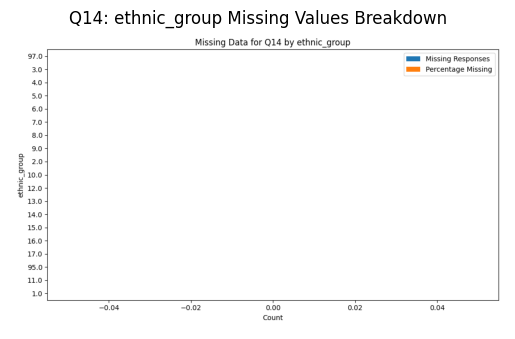


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

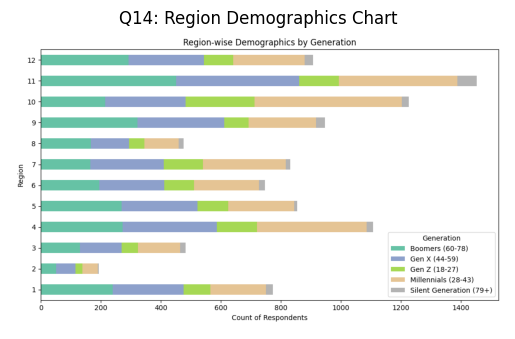


📄 Analyzing Sheet: Q15

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


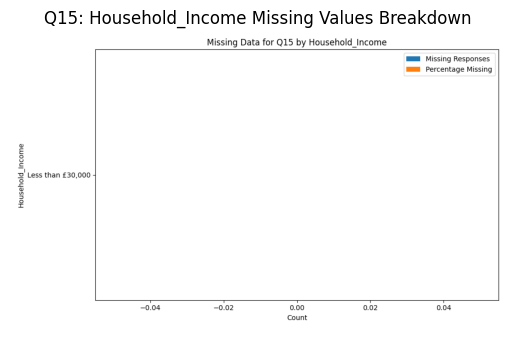


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


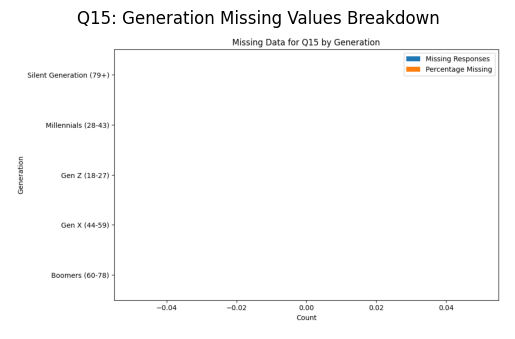


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


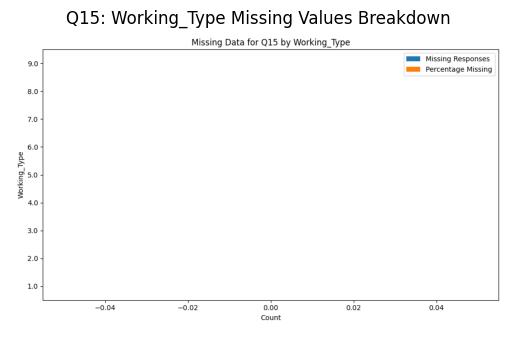


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

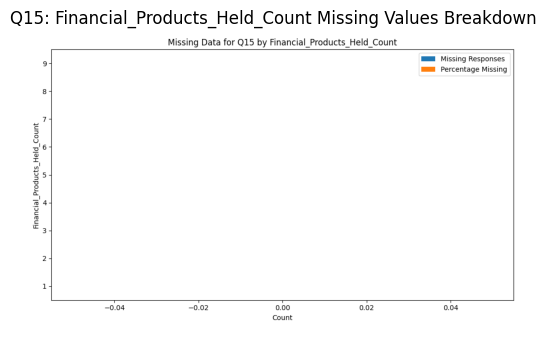


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


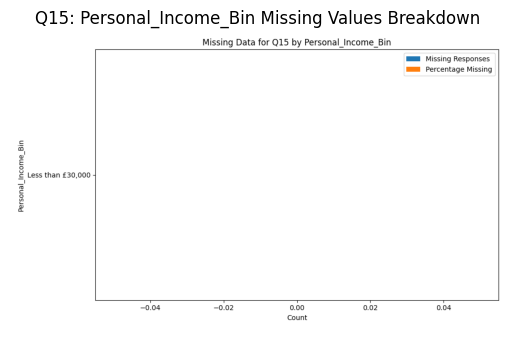


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

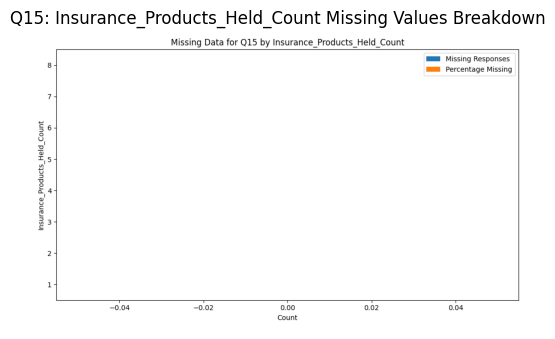


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

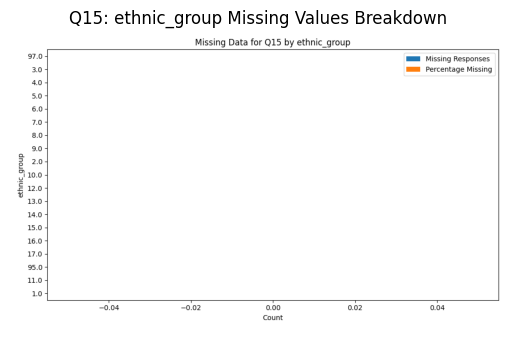


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

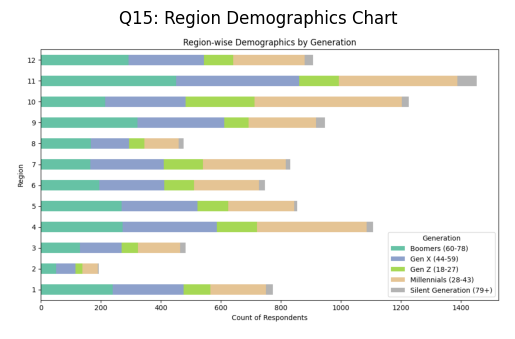


📄 Analyzing Sheet: Q16

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


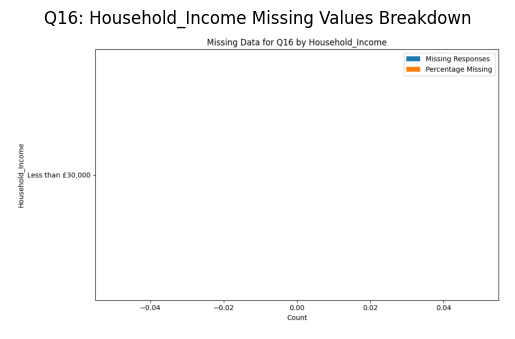


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


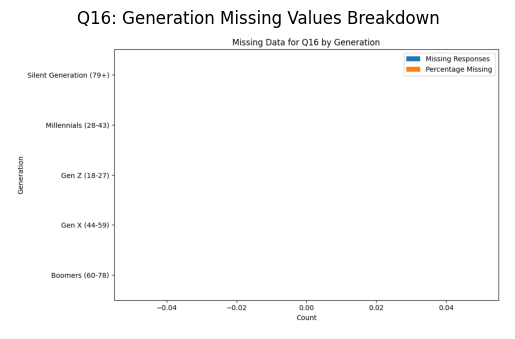


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


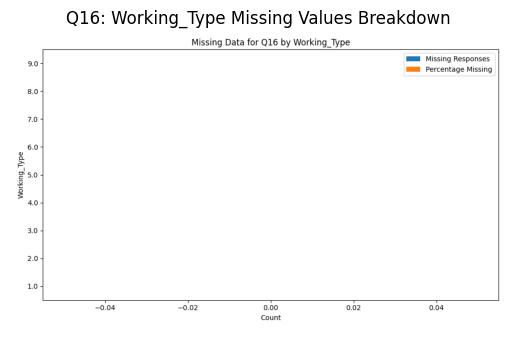


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

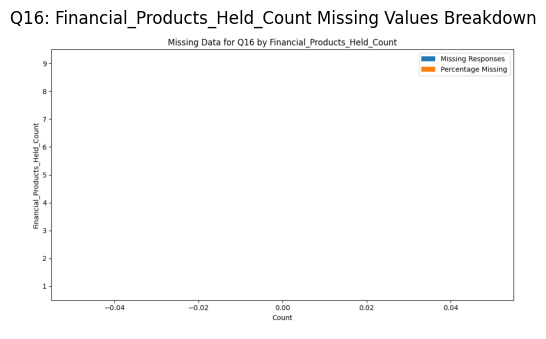


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


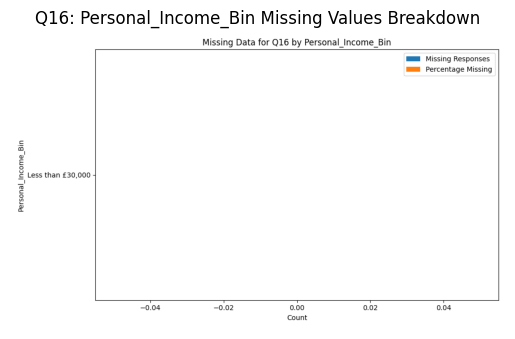


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

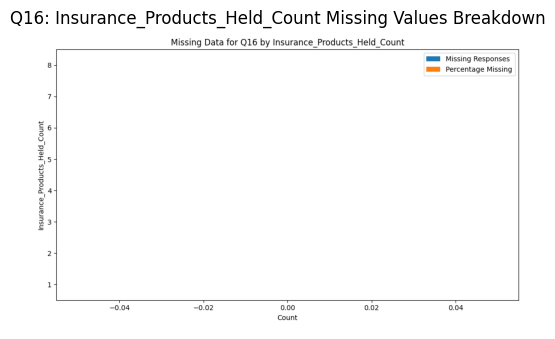


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

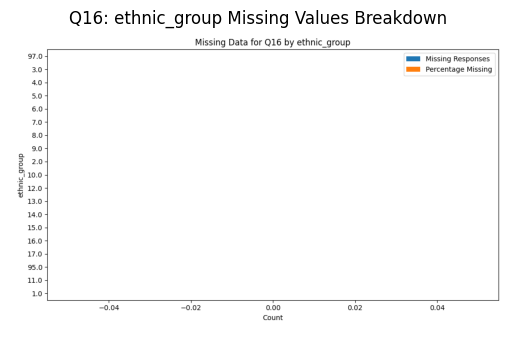


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

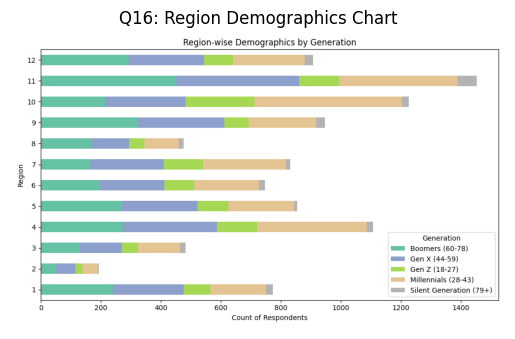


📄 Analyzing Sheet: Q27

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               2001            10000               20.01


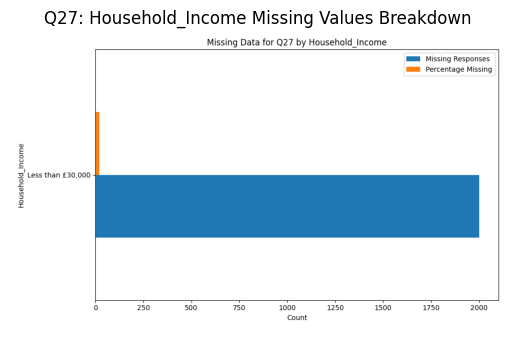


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                     1652.0             2774   
Silent Generation (79+)              249.0              268   
Gen X (44-59)                        100.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       59.55  
Silent Generation (79+)               92.91  
Gen X (44-59)                          3.56  
Gen Z (18-27)                          0.00  
Millennials (28-43)                    0.00  


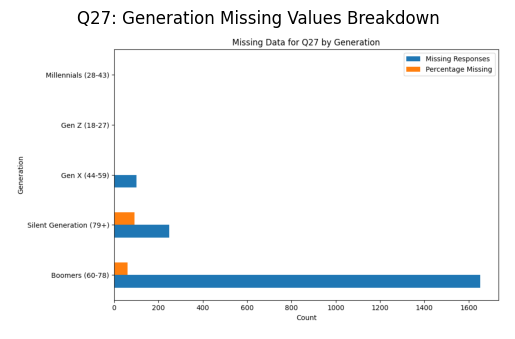


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


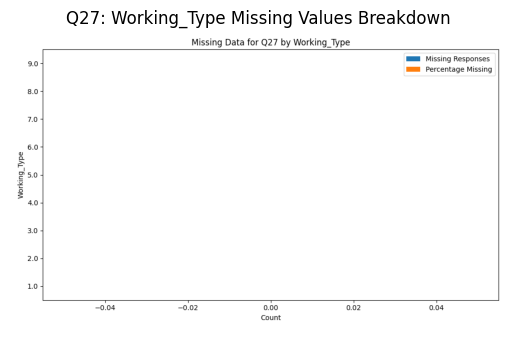


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            962             5073   
2                                            537             2367   
3                                            259             1338   
4                                            126              618   
5                                             79              327   
6                                             25              161   
7                                              9               58   
8                                              3               32   
9                                              1               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           18.96

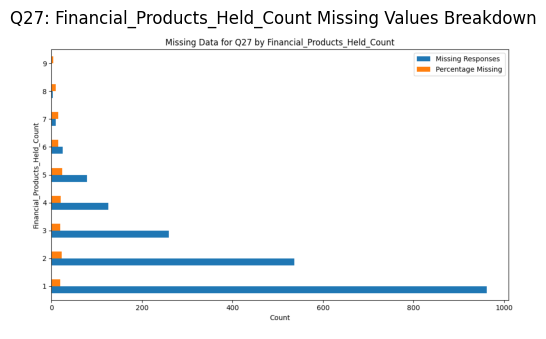


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 2001            10000               20.01


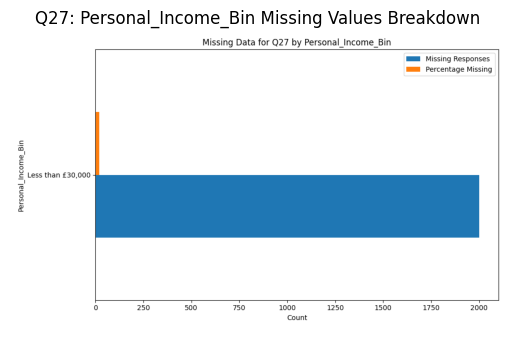


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         1168.0             5942   
2                                          575.0             2156   
3                                          192.0             1128   
4                                           49.0              494   
5                                           14.0              181   
7                                            2.0               24   
6                                            1.0               65   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           19.66  
2                                           26.67  
3             

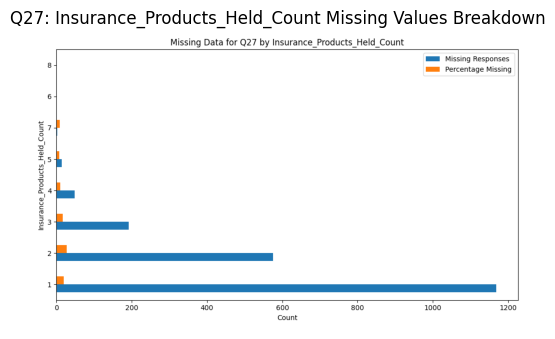


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      1903.0             7854               24.23
4.0                        21.0              360                5.83
2.0                        14.0              100               14.00
9.0                        11.0              151                7.28
12.0                        6.0               59               10.17
14.0                        4.0              470                0.85
97.0                        4.0               57                7.02
7.0                         4.0               54                7.41
8.0                         3.0               58                5.17
6.0                         2.0               79                2.53
5.0                         2.0               62                3.23
13.0                        2.0  

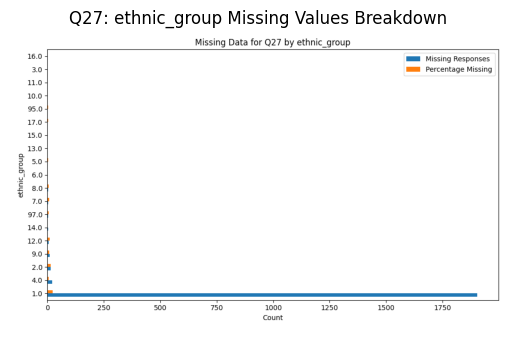


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

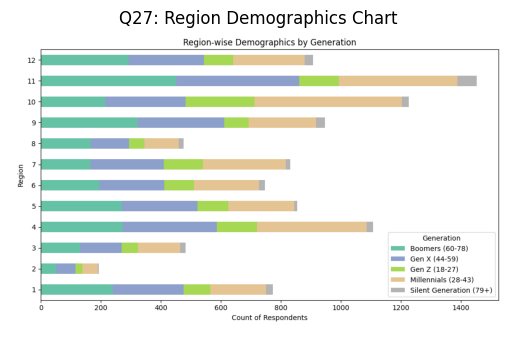


📄 Analyzing Sheet: Q28

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               2001            10000               20.01


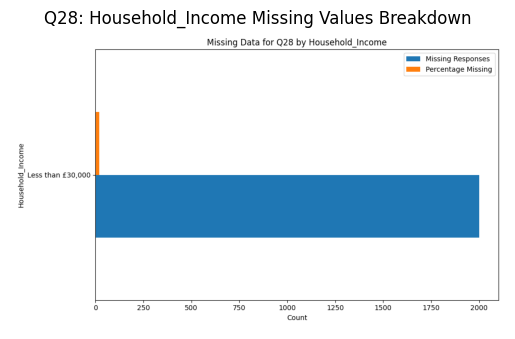


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                     1652.0             2774   
Silent Generation (79+)              249.0              268   
Gen X (44-59)                        100.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       59.55  
Silent Generation (79+)               92.91  
Gen X (44-59)                          3.56  
Gen Z (18-27)                          0.00  
Millennials (28-43)                    0.00  


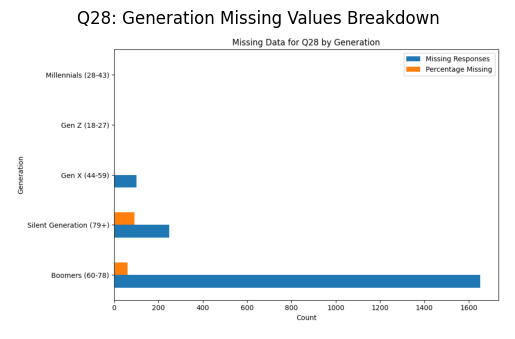


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


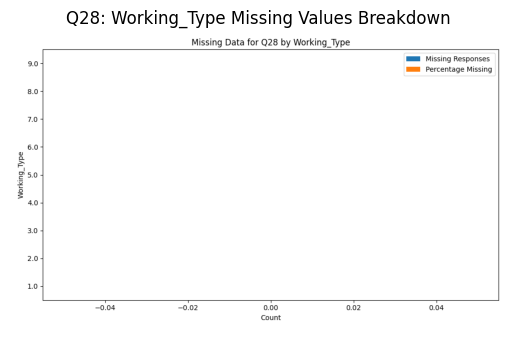


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            962             5073   
2                                            537             2367   
3                                            259             1338   
4                                            126              618   
5                                             79              327   
6                                             25              161   
7                                              9               58   
8                                              3               32   
9                                              1               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           18.96

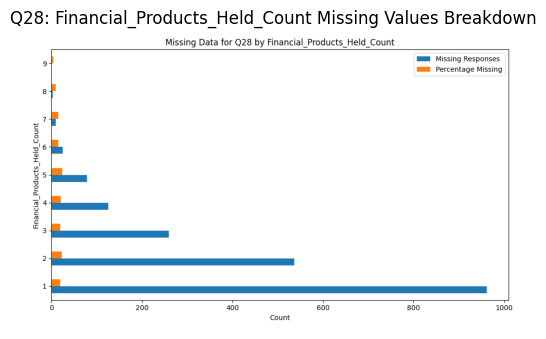


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 2001            10000               20.01


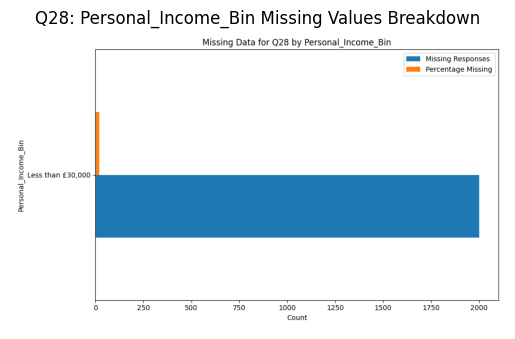


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         1168.0             5942   
2                                          575.0             2156   
3                                          192.0             1128   
4                                           49.0              494   
5                                           14.0              181   
7                                            2.0               24   
6                                            1.0               65   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           19.66  
2                                           26.67  
3             

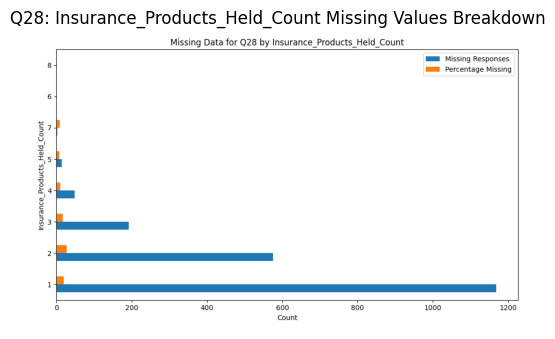


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      1903.0             7854               24.23
4.0                        21.0              360                5.83
2.0                        14.0              100               14.00
9.0                        11.0              151                7.28
12.0                        6.0               59               10.17
14.0                        4.0              470                0.85
97.0                        4.0               57                7.02
7.0                         4.0               54                7.41
8.0                         3.0               58                5.17
6.0                         2.0               79                2.53
5.0                         2.0               62                3.23
13.0                        2.0  

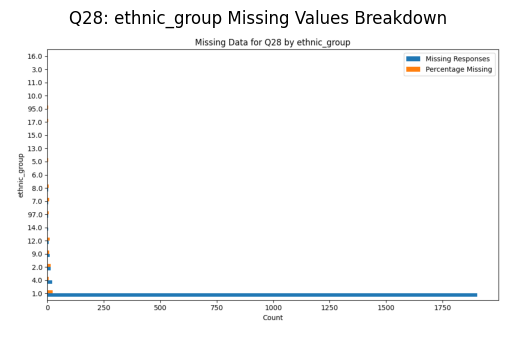


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

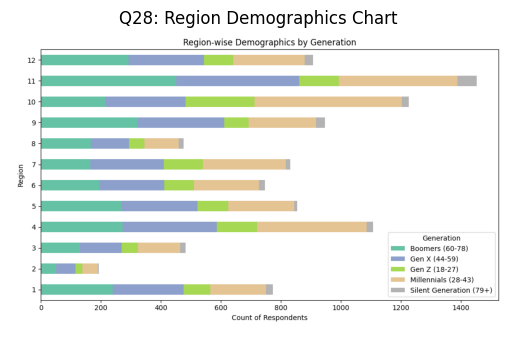


📄 Analyzing Sheet: Q29

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


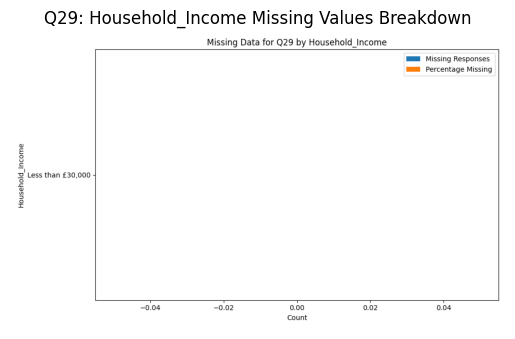


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


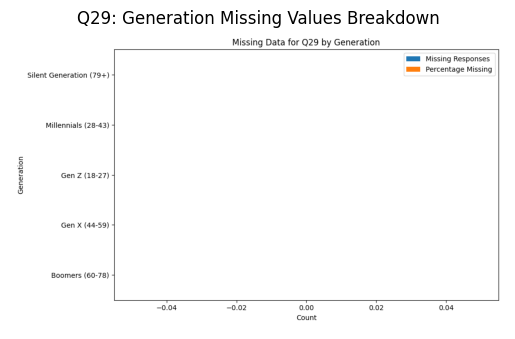


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


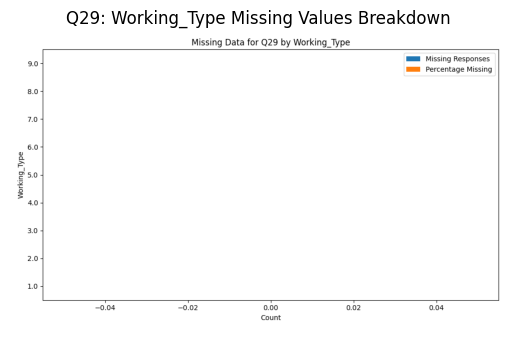


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

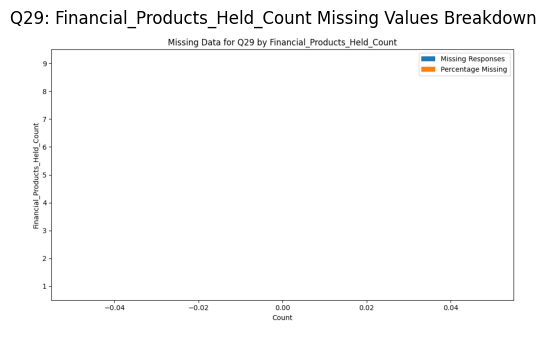


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


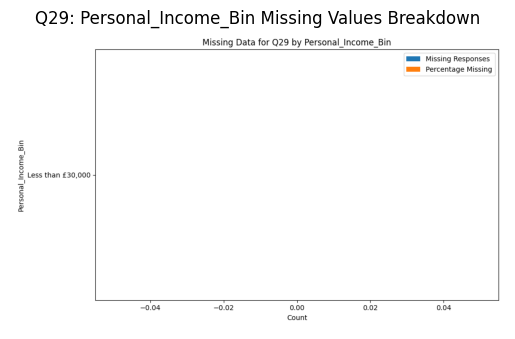


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

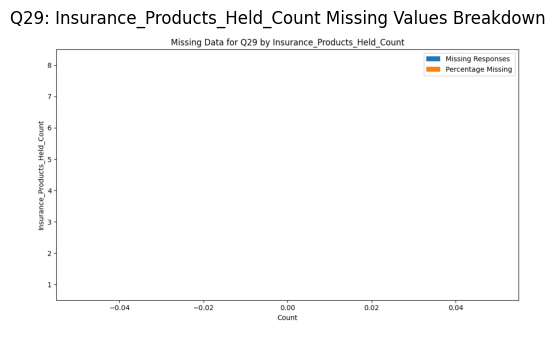


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

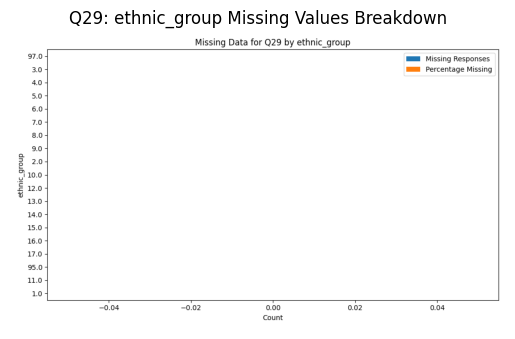


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

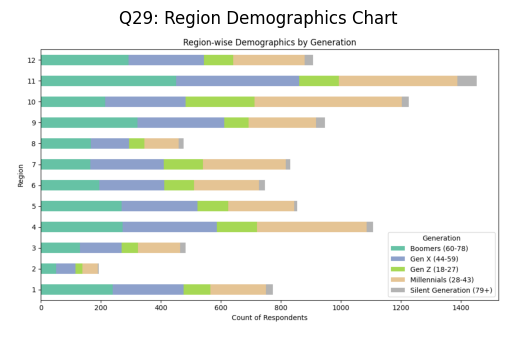


📄 Analyzing Sheet: Q30

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               2703            10000               27.03


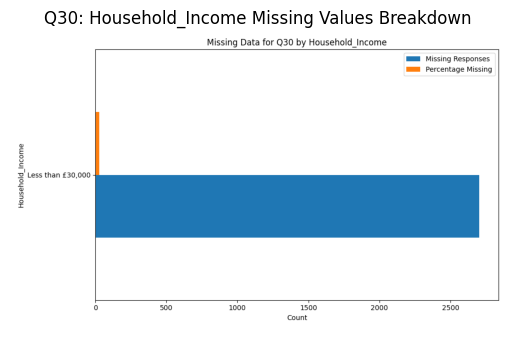


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       1113             2774   
Gen X (44-59)                          728             2808   
Millennials (28-43)                    415             2924   
Gen Z (18-27)                          319             1226   
Silent Generation (79+)                128              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       40.12  
Gen X (44-59)                         25.93  
Millennials (28-43)                   14.19  
Gen Z (18-27)                         26.02  
Silent Generation (79+)               47.76  


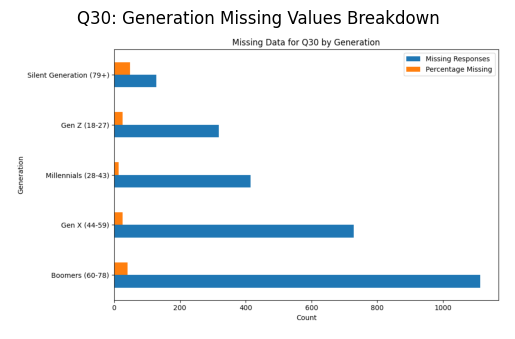


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         997             5467               18.24
2.0                         165              642               25.70
6.0                          33              102               32.35
9.0                          31               90               34.44
5.0                          24               78               30.77
8.0                          12               42               28.57
4.0                           5               18               27.78
3.0                           4               33               12.12
7.0                           3               28               10.71


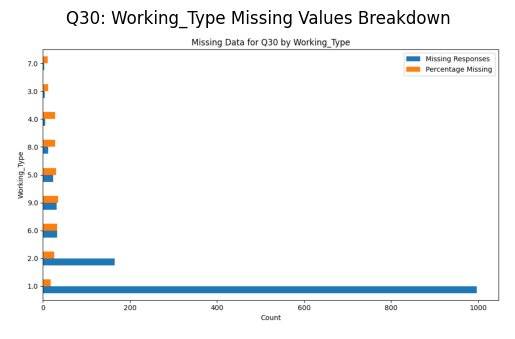


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           1629             5073   
2                                            561             2367   
3                                            306             1338   
4                                            119              618   
5                                             54              327   
6                                             24              161   
7                                              6               58   
8                                              3               32   
9                                              1               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           32.11

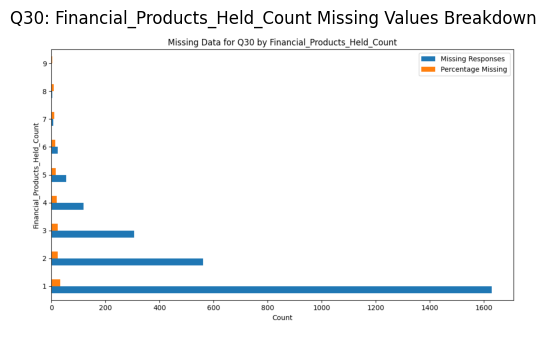


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 2703            10000               27.03


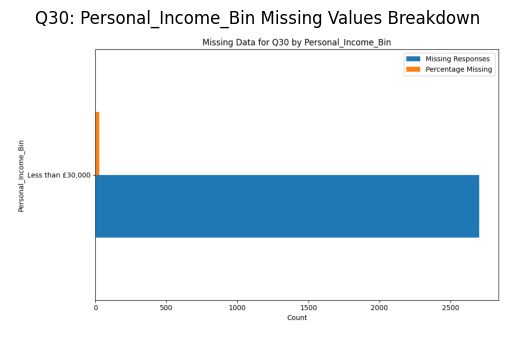


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         1926.0             5942   
2                                          521.0             2156   
3                                          181.0             1128   
4                                           58.0              494   
5                                           13.0              181   
7                                            3.0               24   
6                                            1.0               65   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           32.41  
2                                           24.17  
3             

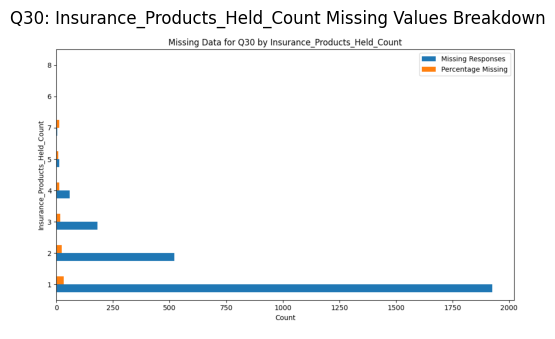


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        2257             7854               28.74
4.0                          76              360               21.11
14.0                         50              470               10.64
9.0                          36              151               23.84
10.0                         32              141               22.70
2.0                          22              100               22.00
12.0                         22               59               37.29
13.0                         21               77               27.27
97.0                         17               57               29.82
7.0                          16               54               29.63
15.0                         14              111               12.61
5.0                          12  

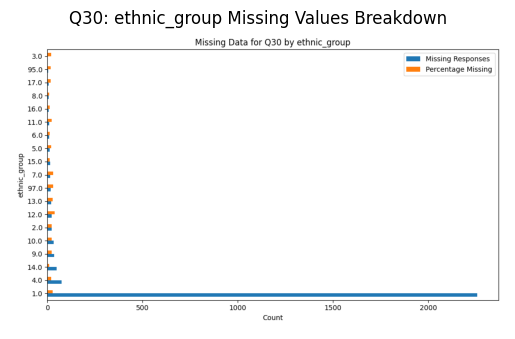


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

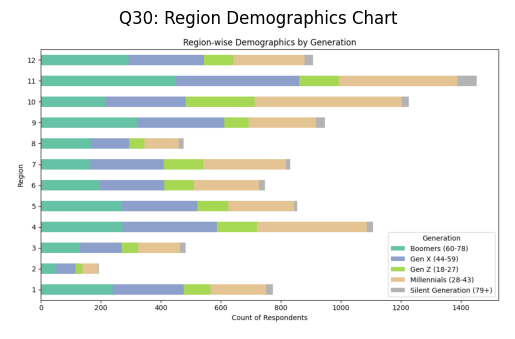


📄 Analyzing Sheet: Q31

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6158            10000               61.58


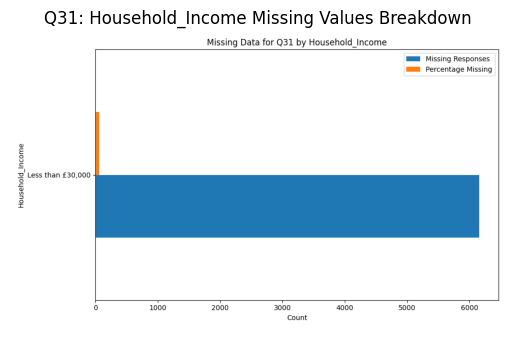


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Gen X (44-59)                         1820             2808   
Boomers (60-78)                       1733             2774   
Millennials (28-43)                   1671             2924   
Gen Z (18-27)                          769             1226   
Silent Generation (79+)                165              268   

                         Percentage Missing  
Generation                                   
Gen X (44-59)                         64.81  
Boomers (60-78)                       62.47  
Millennials (28-43)                   57.15  
Gen Z (18-27)                         62.72  
Silent Generation (79+)               61.57  


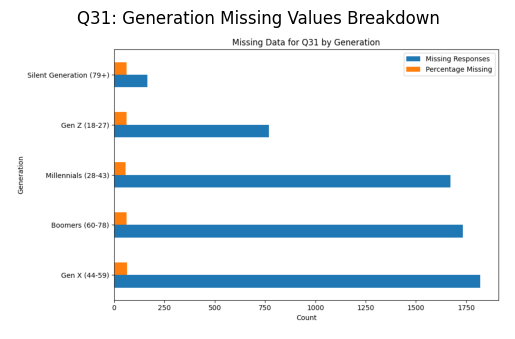


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3034             5467               55.50
2.0                         309              642               48.13
6.0                          66              102               64.71
9.0                          61               90               67.78
5.0                          35               78               44.87
8.0                          29               42               69.05
7.0                          13               28               46.43
3.0                          10               33               30.30
4.0                           8               18               44.44


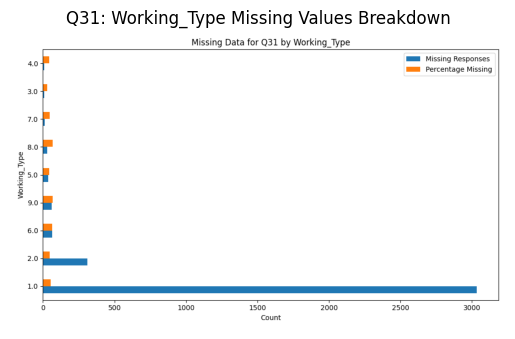


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         4741.0             5073   
2                                         1299.0             2367   
3                                          118.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           93.46

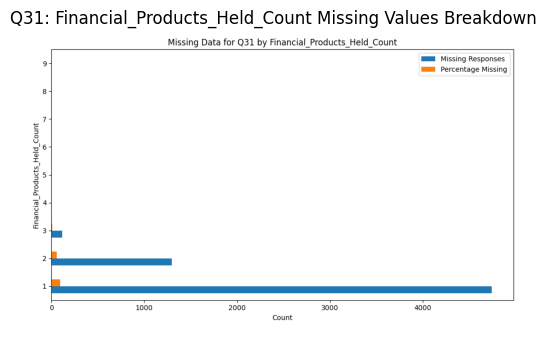


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6158            10000               61.58


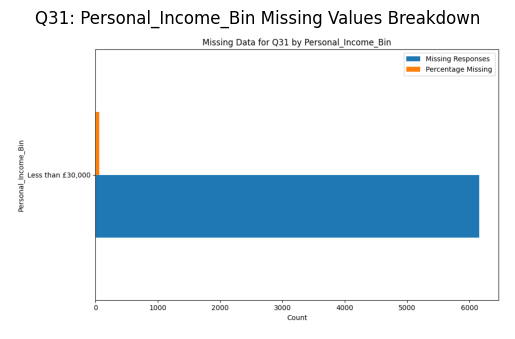


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           4289             5942   
2                                           1184             2156   
3                                            459             1128   
4                                            167              494   
5                                             45              181   
6                                              7               65   
8                                              4               10   
7                                              3               24   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           72.18  
2                                           54.92  
3             

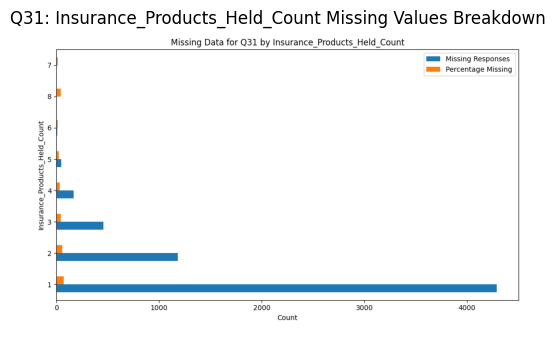


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      4917.0             7854               62.61
4.0                       234.0              360               65.00
14.0                      224.0              470               47.66
10.0                       96.0              141               68.09
9.0                        80.0              151               52.98
15.0                       72.0              111               64.86
2.0                        54.0              100               54.00
13.0                       54.0               77               70.13
6.0                        44.0               79               55.70
5.0                        39.0               62               62.90
97.0                       38.0               57               66.67
7.0                        32.0  

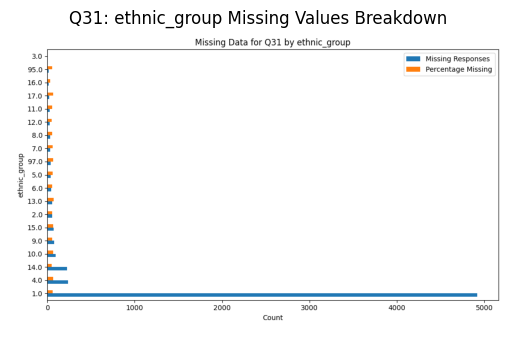


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

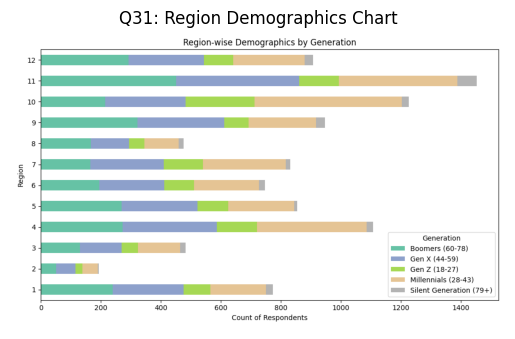


📄 Analyzing Sheet: Q32

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6158            10000               61.58


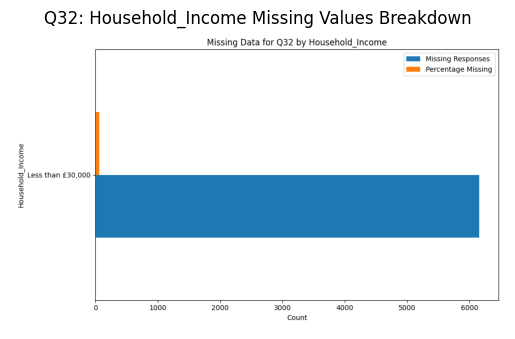


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Gen X (44-59)                         1820             2808   
Boomers (60-78)                       1733             2774   
Millennials (28-43)                   1671             2924   
Gen Z (18-27)                          769             1226   
Silent Generation (79+)                165              268   

                         Percentage Missing  
Generation                                   
Gen X (44-59)                         64.81  
Boomers (60-78)                       62.47  
Millennials (28-43)                   57.15  
Gen Z (18-27)                         62.72  
Silent Generation (79+)               61.57  


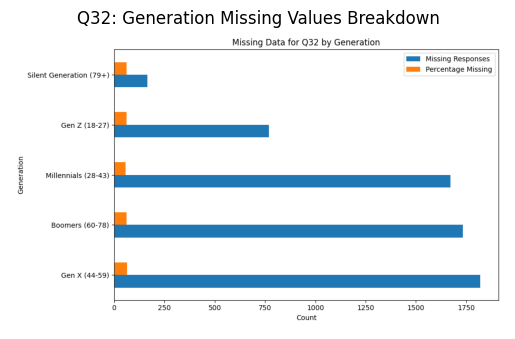


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3034             5467               55.50
2.0                         309              642               48.13
6.0                          66              102               64.71
9.0                          61               90               67.78
5.0                          35               78               44.87
8.0                          29               42               69.05
7.0                          13               28               46.43
3.0                          10               33               30.30
4.0                           8               18               44.44


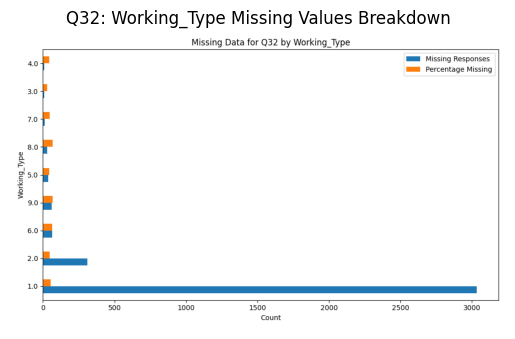


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         4741.0             5073   
2                                         1299.0             2367   
3                                          118.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           93.46

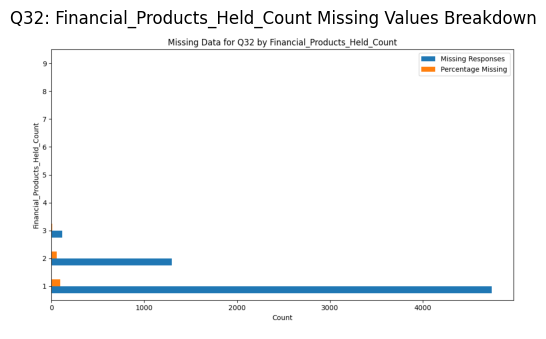


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6158            10000               61.58


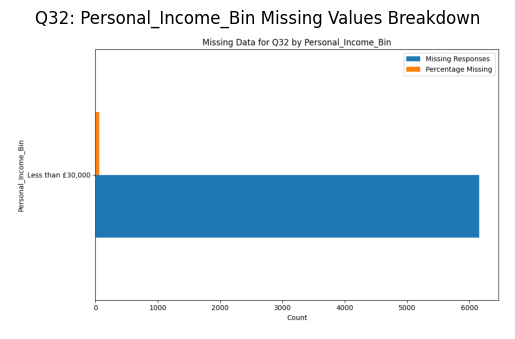


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           4289             5942   
2                                           1184             2156   
3                                            459             1128   
4                                            167              494   
5                                             45              181   
6                                              7               65   
8                                              4               10   
7                                              3               24   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           72.18  
2                                           54.92  
3             

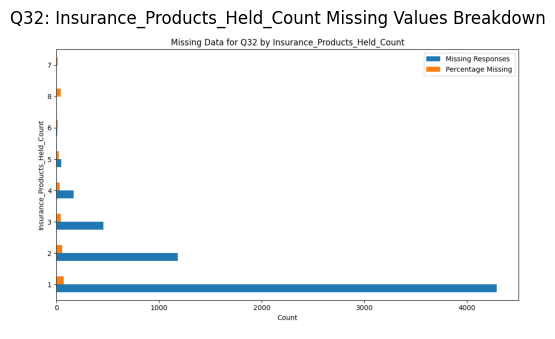


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      4917.0             7854               62.61
4.0                       234.0              360               65.00
14.0                      224.0              470               47.66
10.0                       96.0              141               68.09
9.0                        80.0              151               52.98
15.0                       72.0              111               64.86
2.0                        54.0              100               54.00
13.0                       54.0               77               70.13
6.0                        44.0               79               55.70
5.0                        39.0               62               62.90
97.0                       38.0               57               66.67
7.0                        32.0  

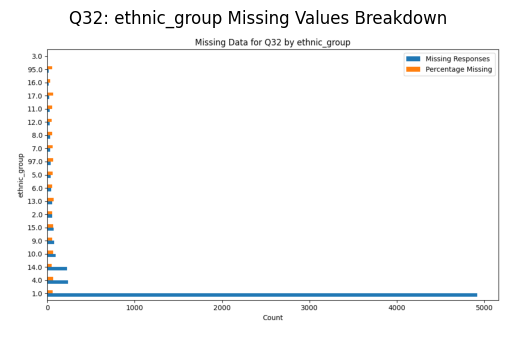


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

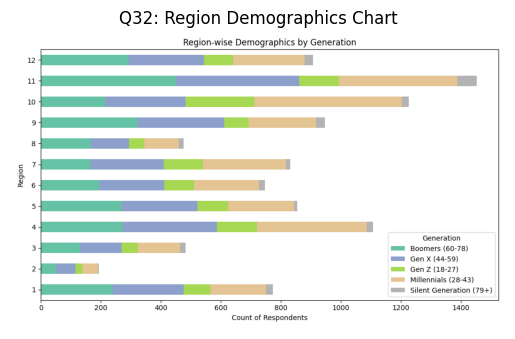


📄 Analyzing Sheet: Q33

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6158            10000               61.58


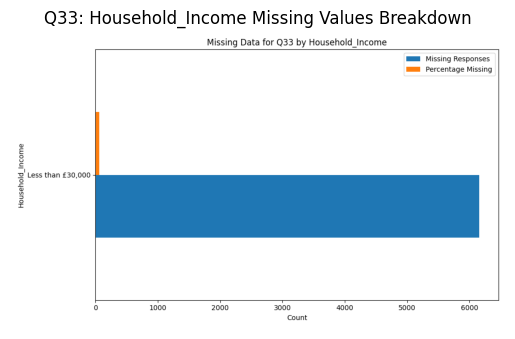


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Gen X (44-59)                         1820             2808   
Boomers (60-78)                       1733             2774   
Millennials (28-43)                   1671             2924   
Gen Z (18-27)                          769             1226   
Silent Generation (79+)                165              268   

                         Percentage Missing  
Generation                                   
Gen X (44-59)                         64.81  
Boomers (60-78)                       62.47  
Millennials (28-43)                   57.15  
Gen Z (18-27)                         62.72  
Silent Generation (79+)               61.57  


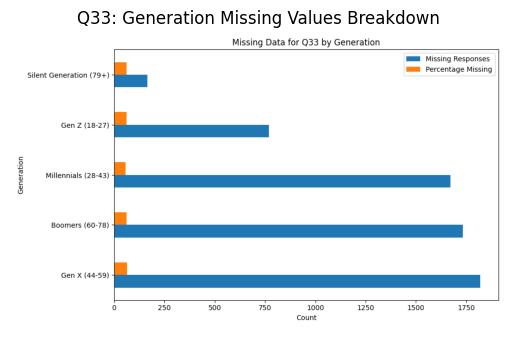


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3034             5467               55.50
2.0                         309              642               48.13
6.0                          66              102               64.71
9.0                          61               90               67.78
5.0                          35               78               44.87
8.0                          29               42               69.05
7.0                          13               28               46.43
3.0                          10               33               30.30
4.0                           8               18               44.44


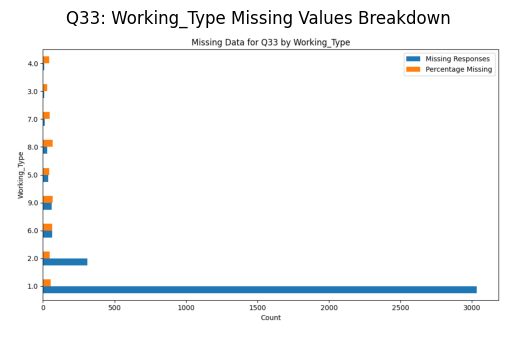


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         4741.0             5073   
2                                         1299.0             2367   
3                                          118.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           93.46

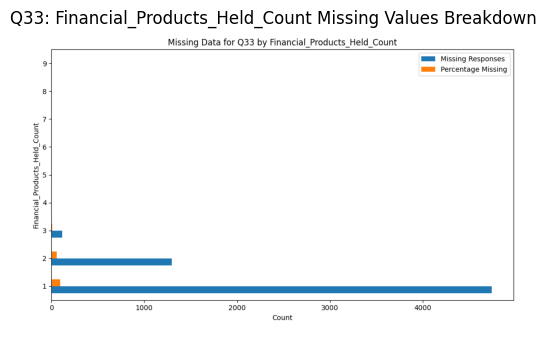


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6158            10000               61.58


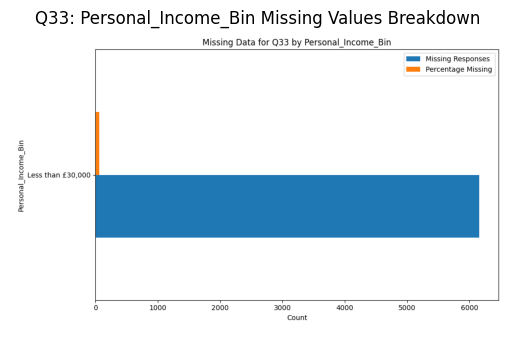


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           4289             5942   
2                                           1184             2156   
3                                            459             1128   
4                                            167              494   
5                                             45              181   
6                                              7               65   
8                                              4               10   
7                                              3               24   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           72.18  
2                                           54.92  
3             

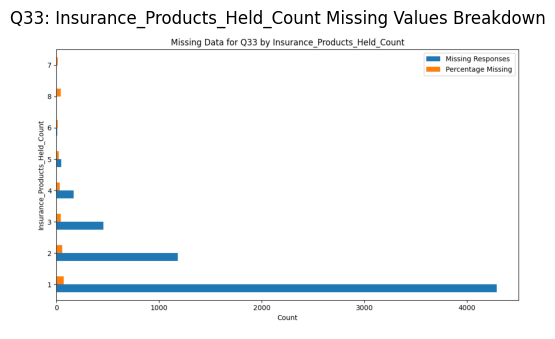


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      4917.0             7854               62.61
4.0                       234.0              360               65.00
14.0                      224.0              470               47.66
10.0                       96.0              141               68.09
9.0                        80.0              151               52.98
15.0                       72.0              111               64.86
2.0                        54.0              100               54.00
13.0                       54.0               77               70.13
6.0                        44.0               79               55.70
5.0                        39.0               62               62.90
97.0                       38.0               57               66.67
7.0                        32.0  

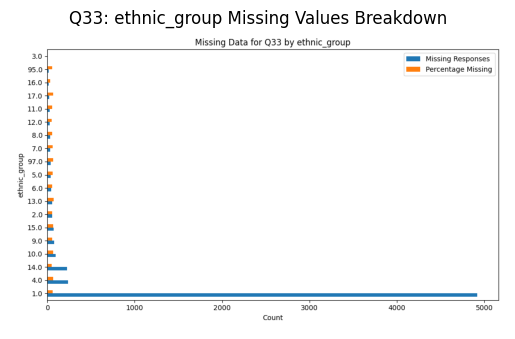


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

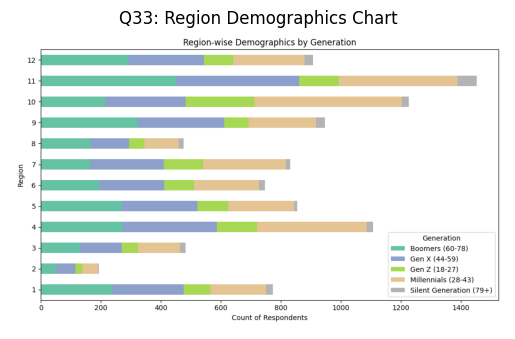


📄 Analyzing Sheet: Q34

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               7095            10000               70.95


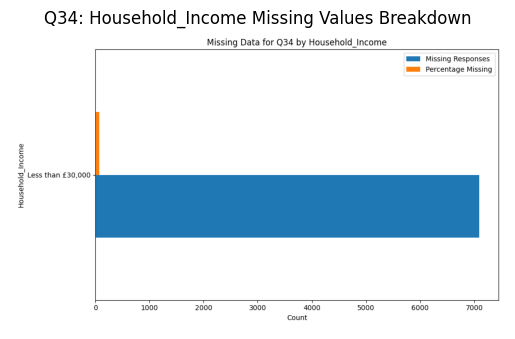


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2329             2924   
Gen X (44-59)                         1884             2808   
Boomers (60-78)                       1766             2774   
Gen Z (18-27)                          963             1226   
Silent Generation (79+)                153              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   79.65  
Gen X (44-59)                         67.09  
Boomers (60-78)                       63.66  
Gen Z (18-27)                         78.55  
Silent Generation (79+)               57.09  


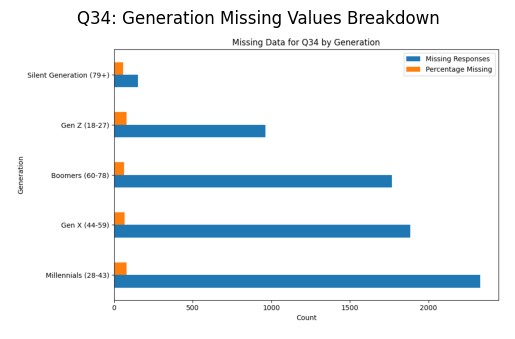


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3953             5467               72.31
2.0                         463              642               72.12
6.0                          80              102               78.43
5.0                          59               78               75.64
9.0                          54               90               60.00
8.0                          32               42               76.19
3.0                          26               33               78.79
7.0                          21               28               75.00
4.0                          15               18               83.33


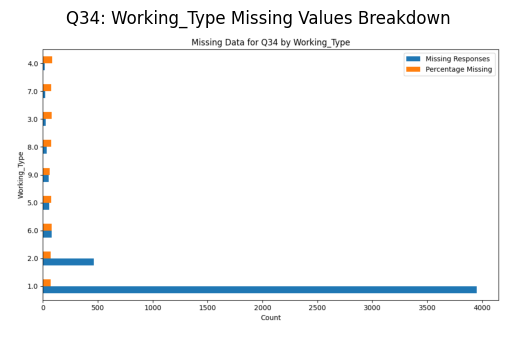


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           3633             5073   
2                                           1669             2367   
3                                            939             1338   
4                                            452              618   
5                                            231              327   
6                                            104              161   
7                                             33               58   
8                                             23               32   
9                                             11               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           71.61

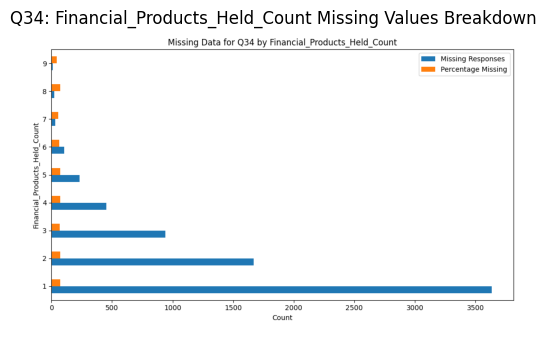


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 7095            10000               70.95


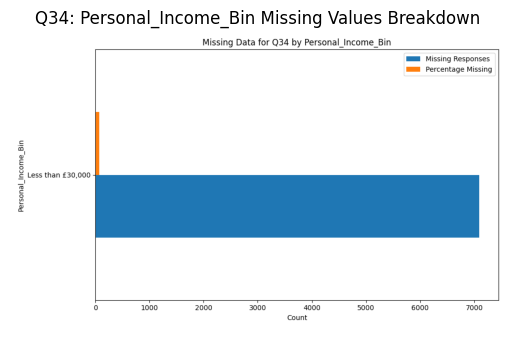


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           4085             5942   
2                                           1534             2156   
3                                            876             1128   
4                                            389              494   
5                                            135              181   
6                                             49               65   
7                                             19               24   
8                                              8               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           68.75  
2                                           71.15  
3             

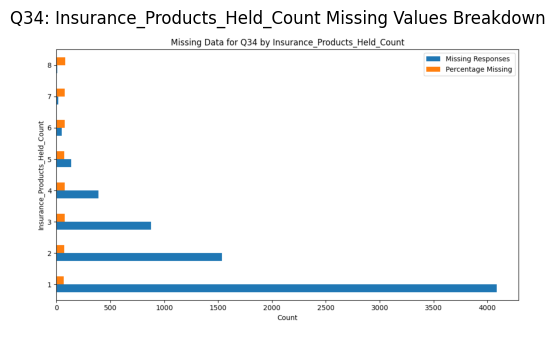


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        5474             7854               69.70
14.0                        397              470               84.47
4.0                         266              360               73.89
10.0                        114              141               80.85
9.0                         104              151               68.87
15.0                         87              111               78.38
2.0                          72              100               72.00
6.0                          66               79               83.54
13.0                         56               77               72.73
16.0                         53               57               92.98
8.0                          52               58               89.66
5.0                          46  

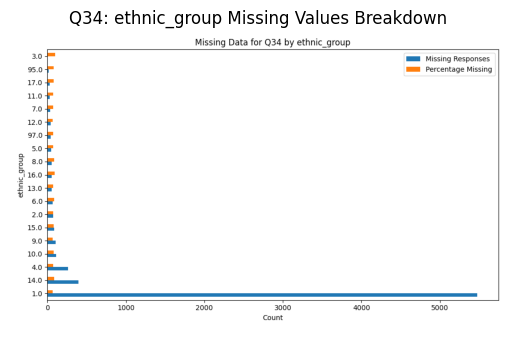


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

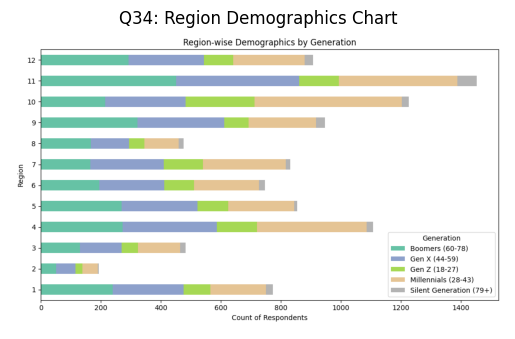


📄 Analyzing Sheet: Q35

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               8740            10000                87.4


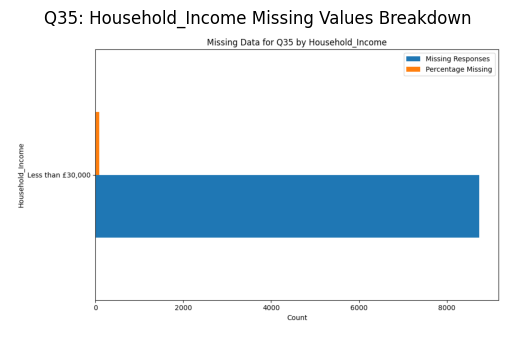


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                       2618             2774   
Gen X (44-59)                         2416             2808   
Millennials (28-43)                   2401             2924   
Gen Z (18-27)                         1043             1226   
Silent Generation (79+)                262              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       94.38  
Gen X (44-59)                         86.04  
Millennials (28-43)                   82.11  
Gen Z (18-27)                         85.07  
Silent Generation (79+)               97.76  


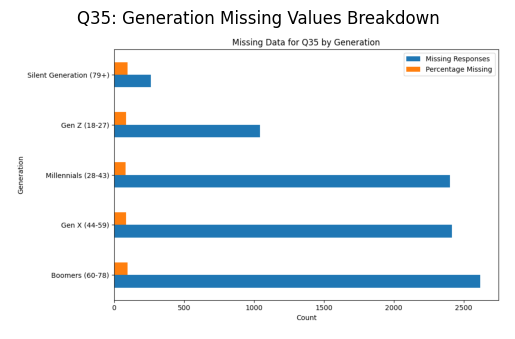


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        4673             5467               85.48
2.0                         554              642               86.29
6.0                          92              102               90.20
9.0                          81               90               90.00
5.0                          68               78               87.18
8.0                          36               42               85.71
3.0                          29               33               87.88
7.0                          24               28               85.71
4.0                          15               18               83.33


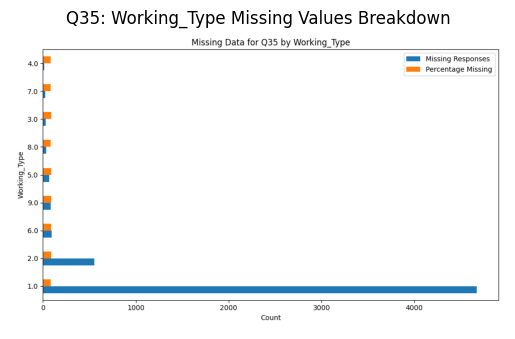


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4289             5073   
2                                           2088             2367   
3                                           1217             1338   
4                                            570              618   
5                                            309              327   
6                                            153              161   
7                                             58               58   
8                                             31               32   
9                                             25               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           84.55

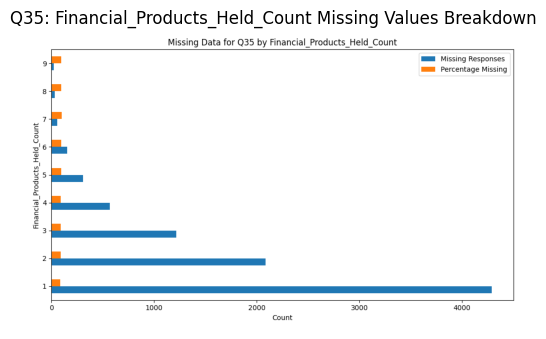


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 8740            10000                87.4


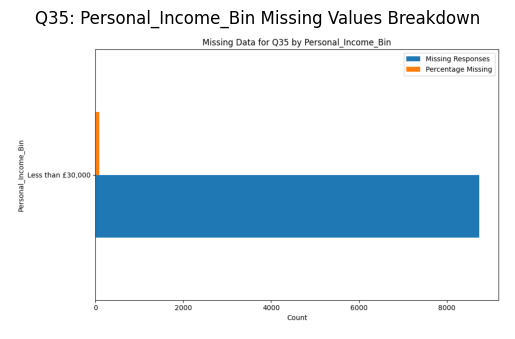


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5118             5942   
2                                           1933             2156   
3                                            999             1128   
4                                            438              494   
5                                            163              181   
6                                             59               65   
7                                             20               24   
8                                             10               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           86.13  
2                                           89.66  
3             

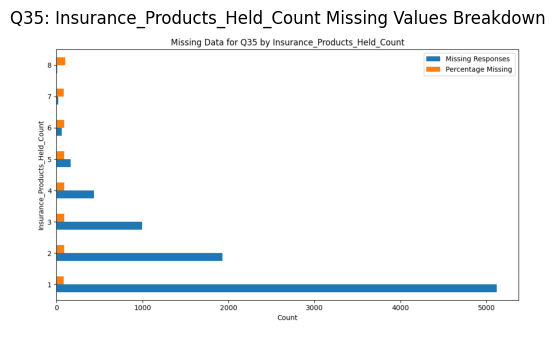


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        6878             7854               87.57
14.0                        414              470               88.09
4.0                         297              360               82.50
9.0                         138              151               91.39
10.0                        116              141               82.27
2.0                          87              100               87.00
15.0                         87              111               78.38
6.0                          71               79               89.87
13.0                         69               77               89.61
12.0                         55               59               93.22
5.0                          54               62               87.10
16.0                         50  

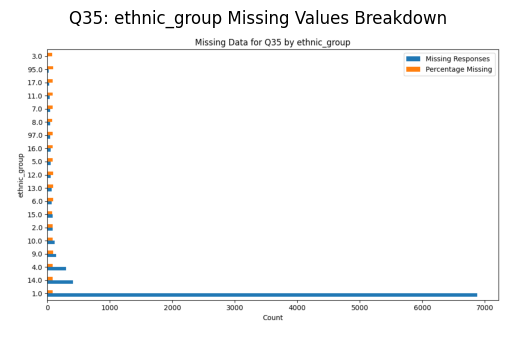


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

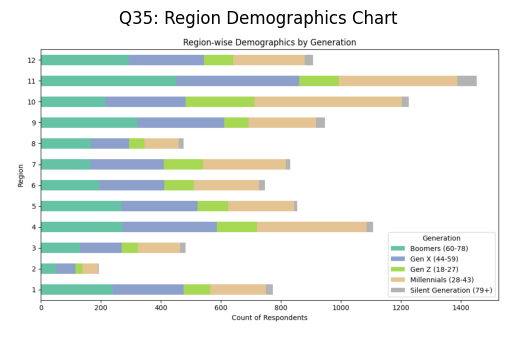


📄 Analyzing Sheet: Q36

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               9073            10000               90.73


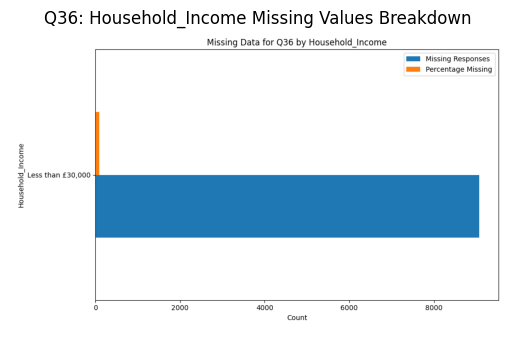


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2783             2924   
Gen X (44-59)                         2549             2808   
Boomers (60-78)                       2372             2774   
Gen Z (18-27)                         1175             1226   
Silent Generation (79+)                194              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   95.18  
Gen X (44-59)                         90.78  
Boomers (60-78)                       85.51  
Gen Z (18-27)                         95.84  
Silent Generation (79+)               72.39  


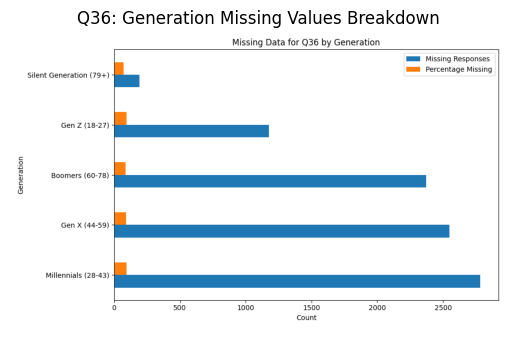


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        5189             5467               94.91
2.0                         602              642               93.77
6.0                          94              102               92.16
9.0                          74               90               82.22
5.0                          73               78               93.59
8.0                          39               42               92.86
3.0                          31               33               93.94
7.0                          28               28              100.00
4.0                          16               18               88.89


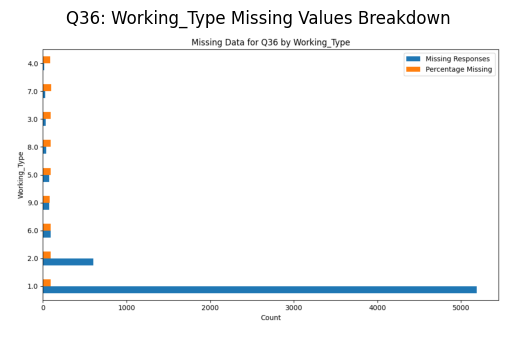


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4445             5073   
2                                           2205             2367   
3                                           1266             1338   
4                                            585              618   
5                                            317              327   
6                                            156              161   
7                                             55               58   
8                                             30               32   
9                                             14               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           87.62

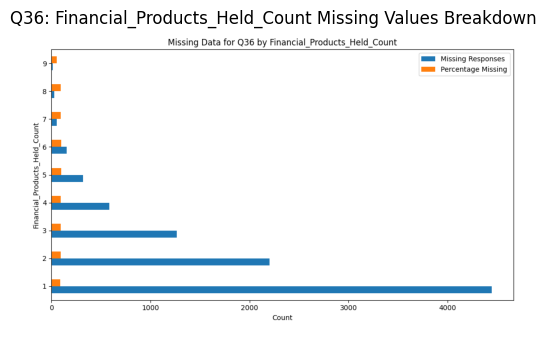


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 9073            10000               90.73


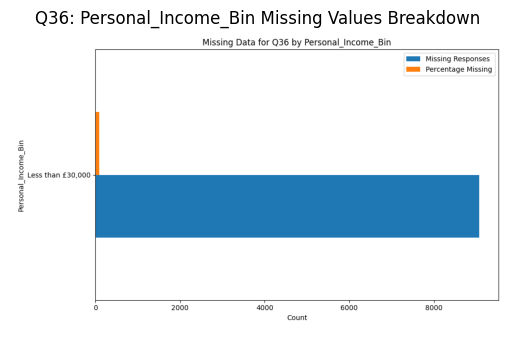


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5263             5942   
2                                           1983             2156   
3                                           1073             1128   
4                                            480              494   
5                                            177              181   
6                                             63               65   
7                                             24               24   
8                                             10               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           88.57  
2                                           91.98  
3             

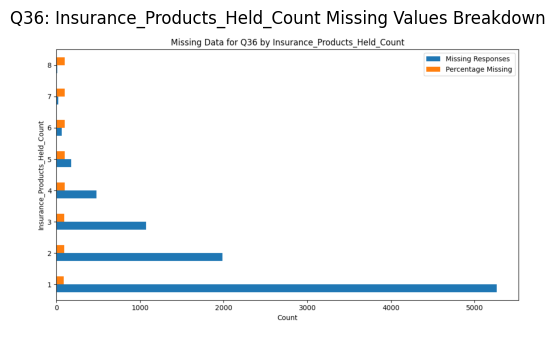


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        7056             7854               89.84
14.0                        463              470               98.51
4.0                         342              360               95.00
9.0                         141              151               93.38
10.0                        135              141               95.74
15.0                        104              111               93.69
2.0                          91              100               91.00
6.0                          78               79               98.73
13.0                         77               77              100.00
5.0                          59               62               95.16
8.0                          57               58               98.28
16.0                         55  

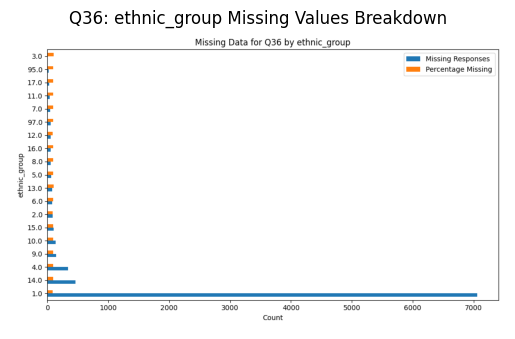


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

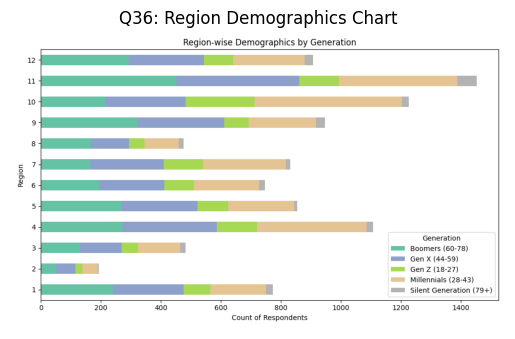


📄 Analyzing Sheet: Q17

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


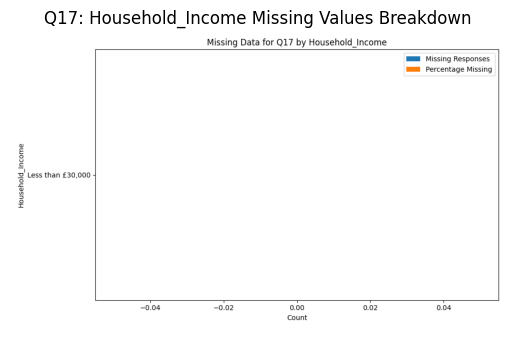


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


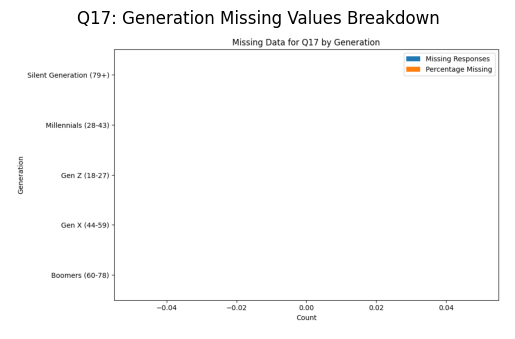


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


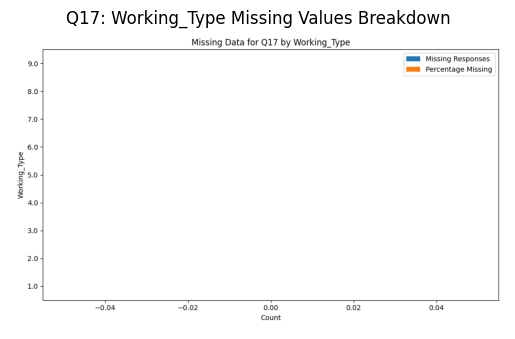


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

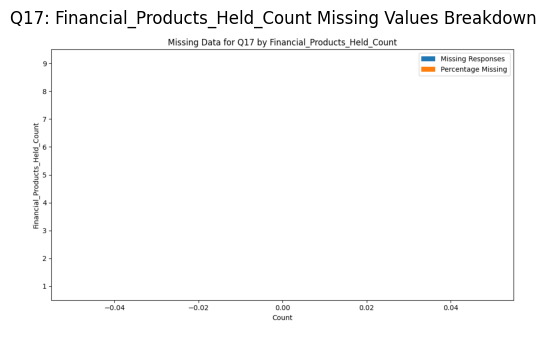


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


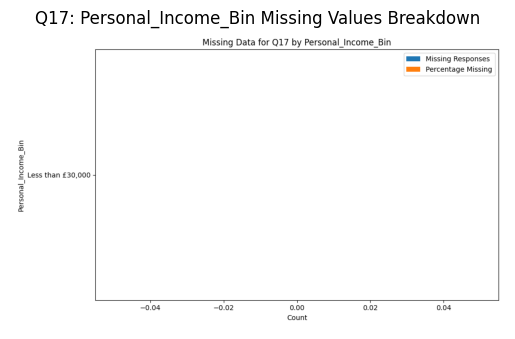


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

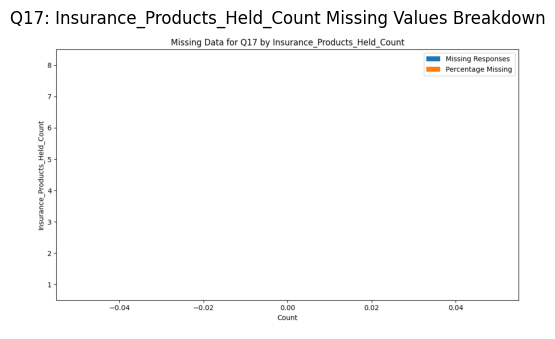


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

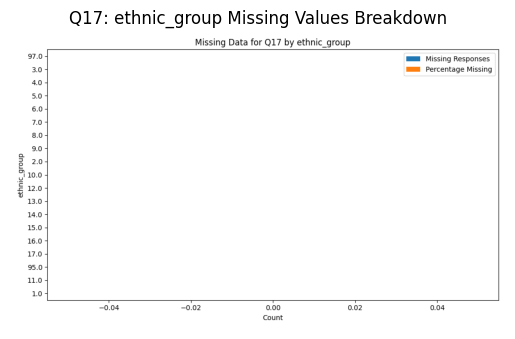


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

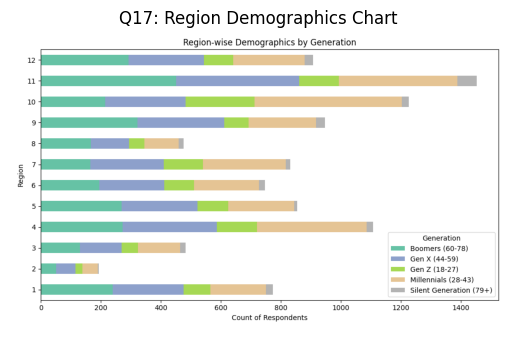


📄 Analyzing Sheet: Q18

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


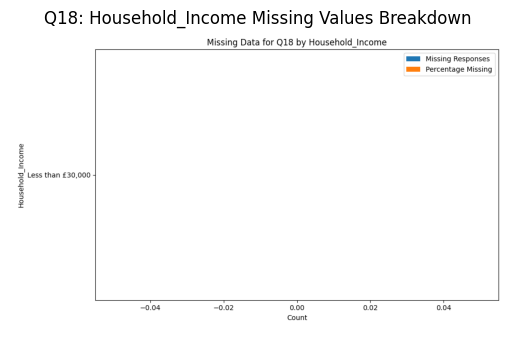


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


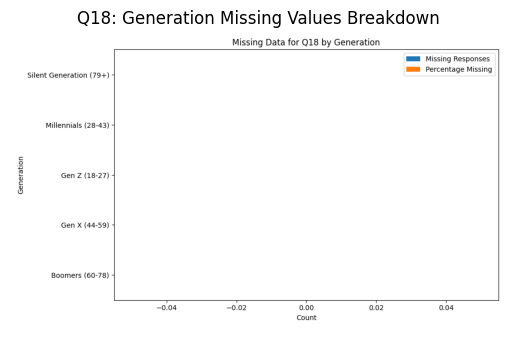


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


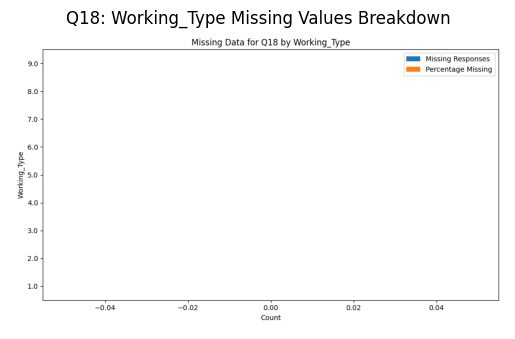


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

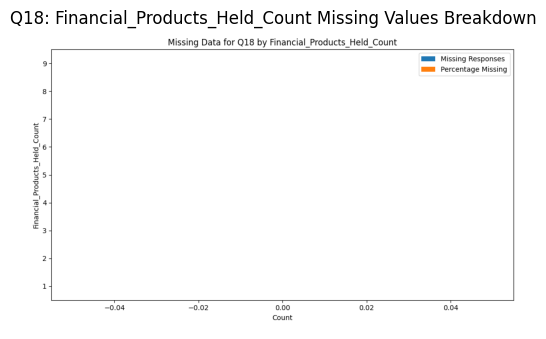


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


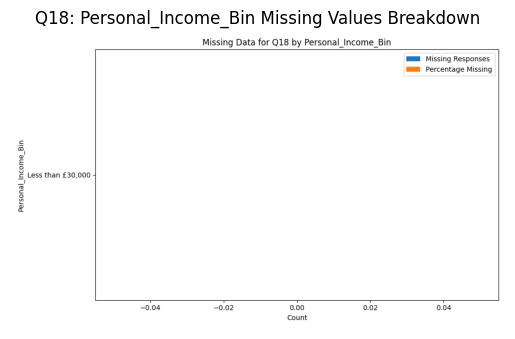


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

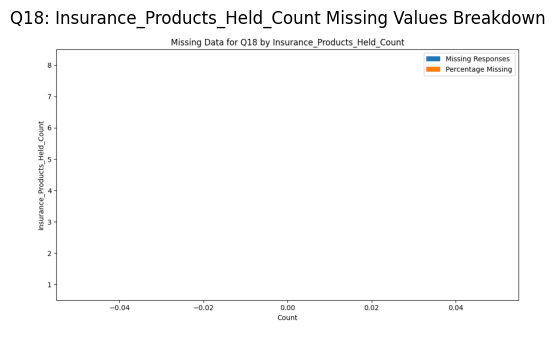


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

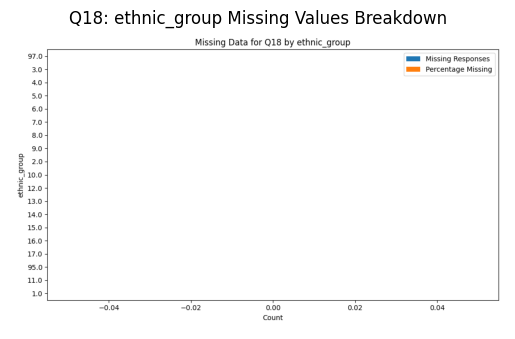


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

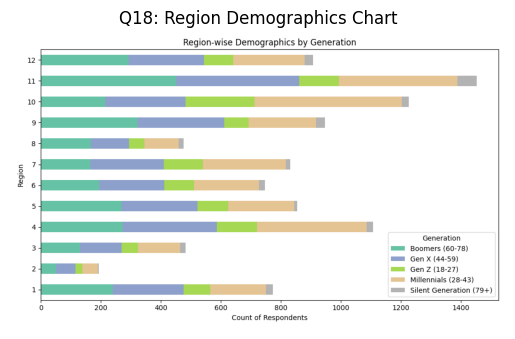


📄 Analyzing Sheet: Q19

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


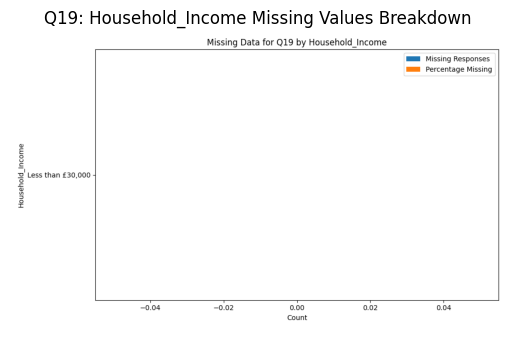


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


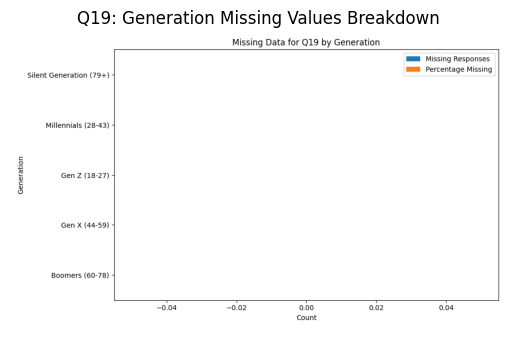


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


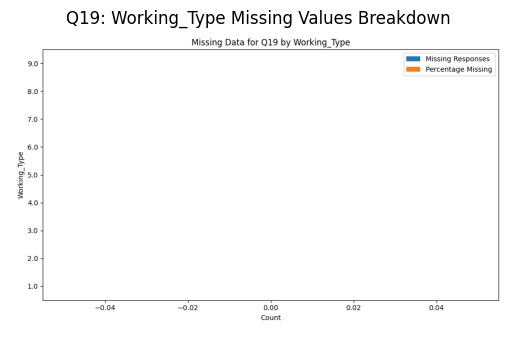


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

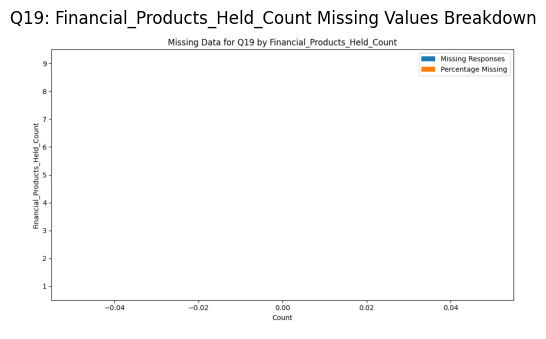


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


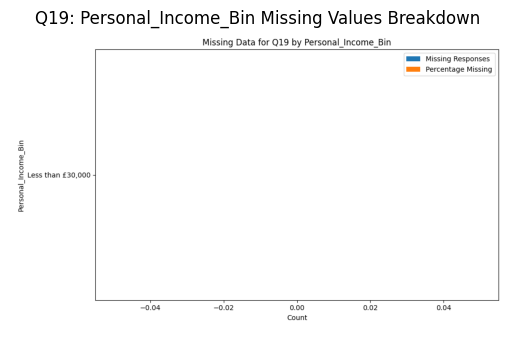


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

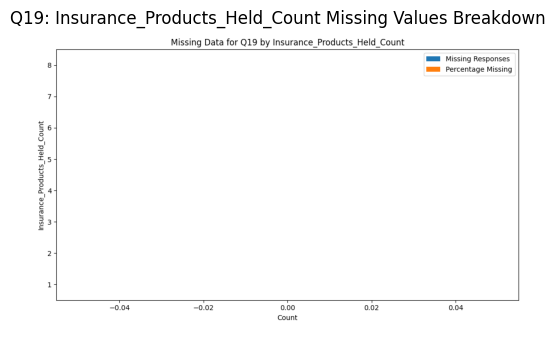


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

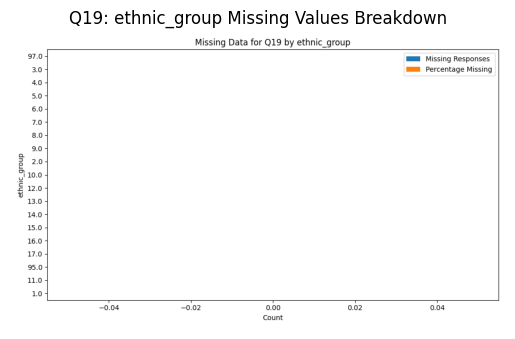


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

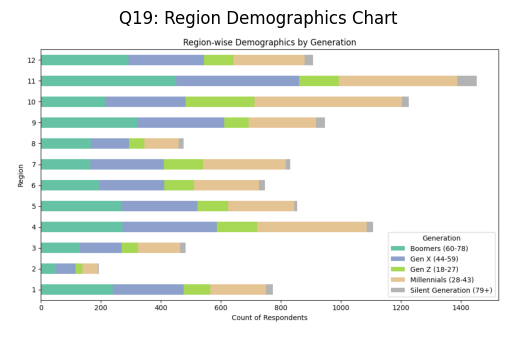


📄 Analyzing Sheet: Q20

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


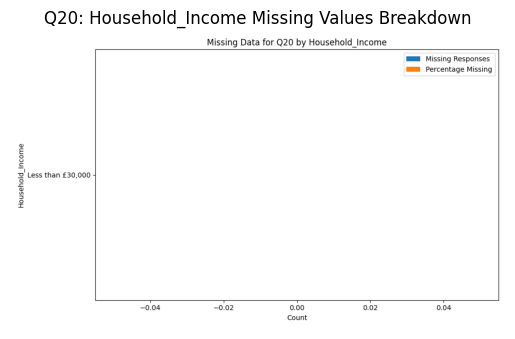


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


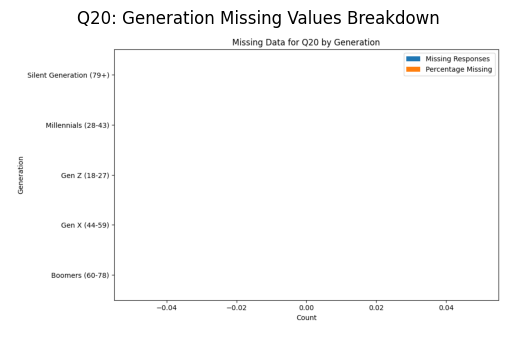


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


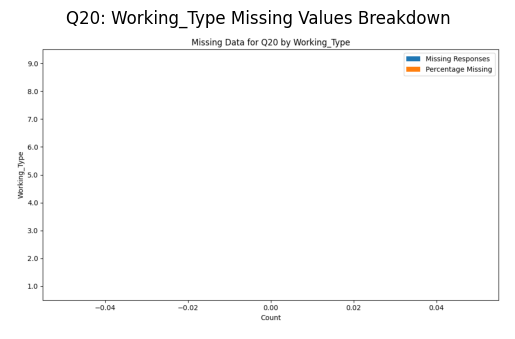


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

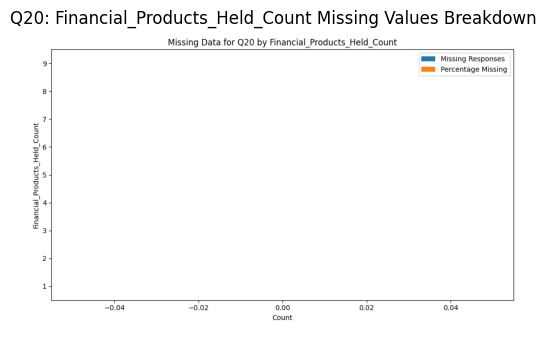


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


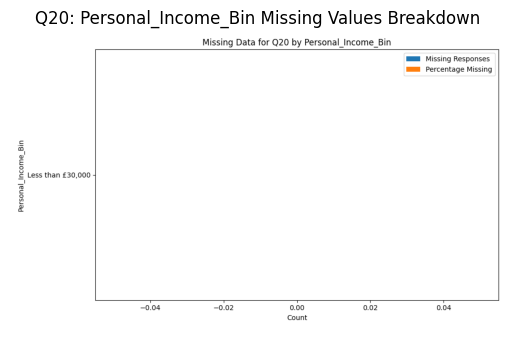


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

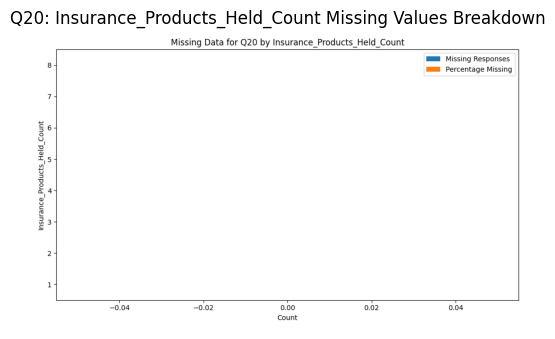


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

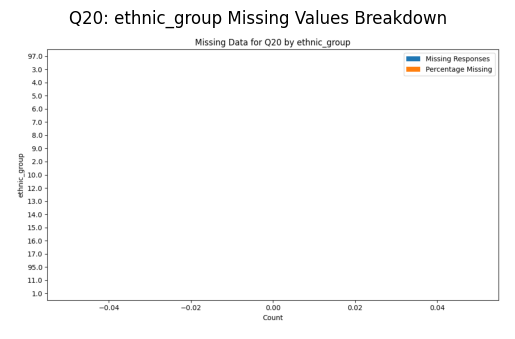


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

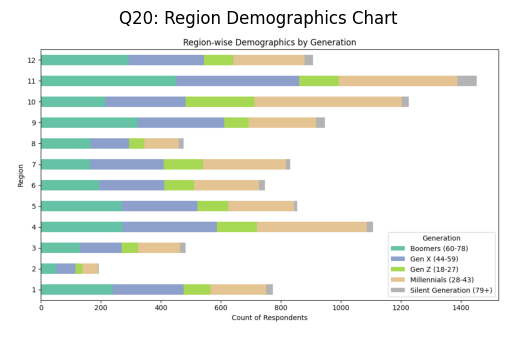


📄 Analyzing Sheet: Q21

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


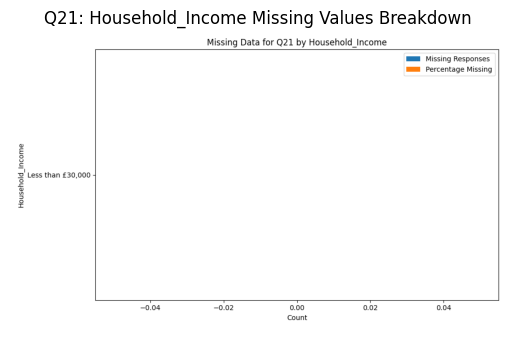


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


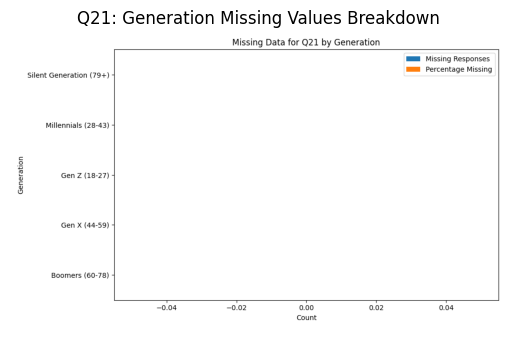


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


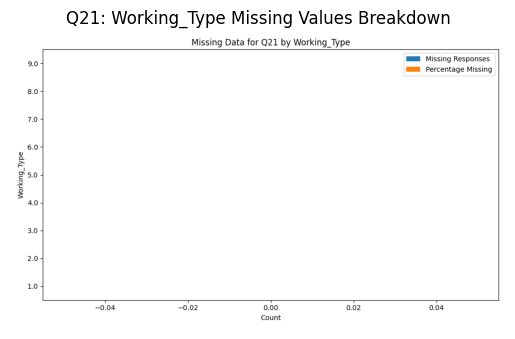


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

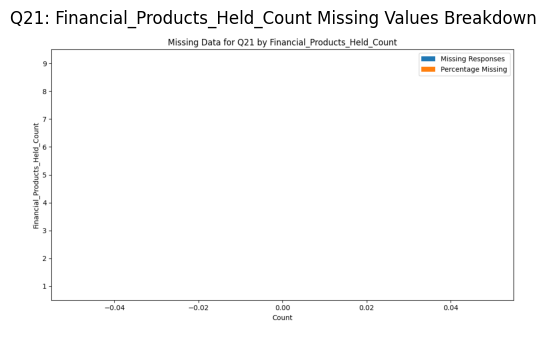


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


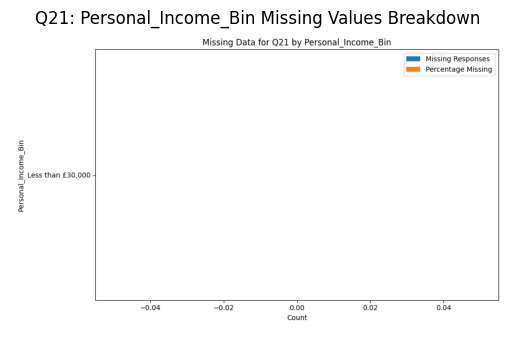


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

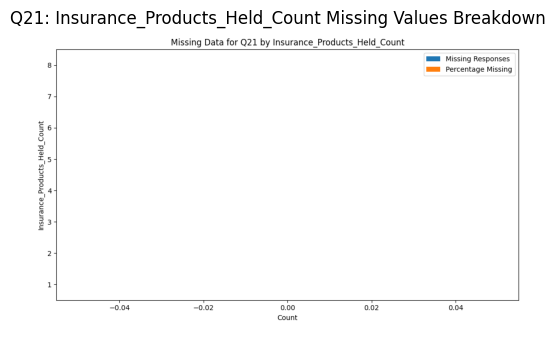


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

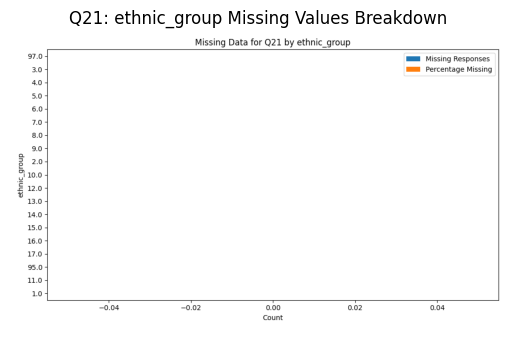


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

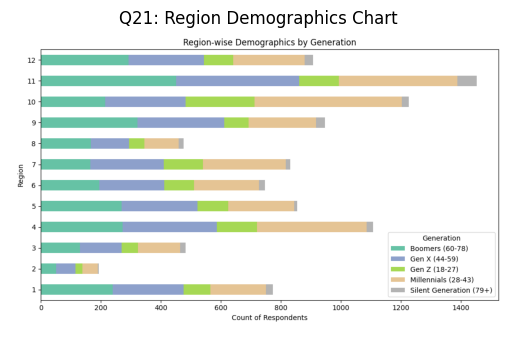


📄 Analyzing Sheet: Q22

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


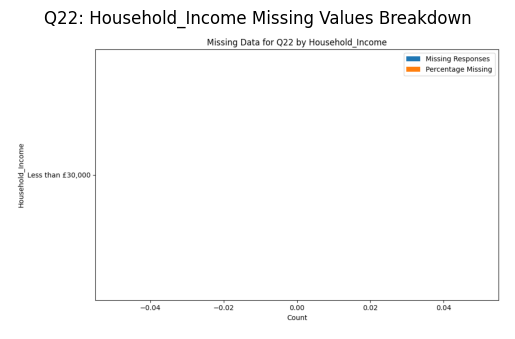


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


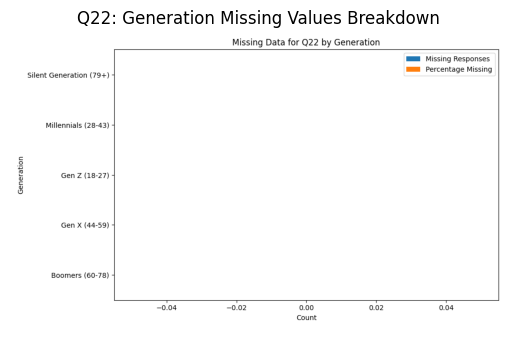


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


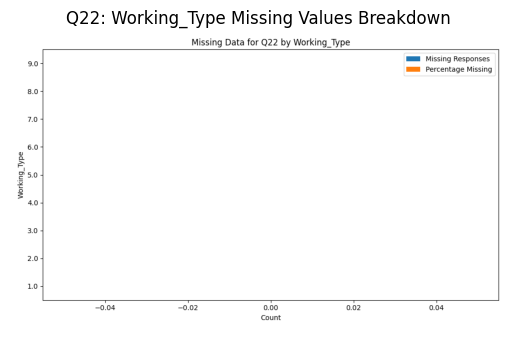


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

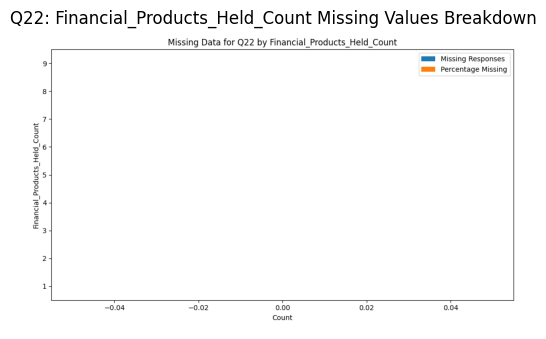


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


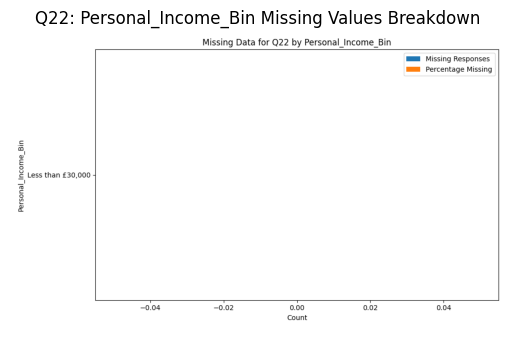


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

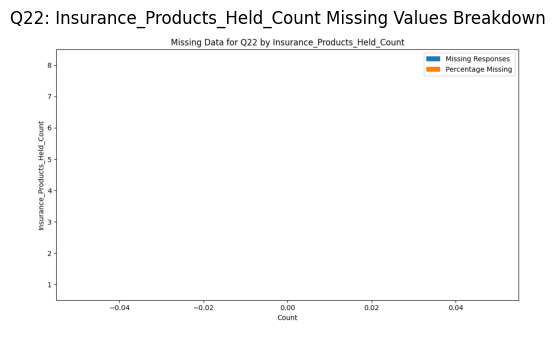


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

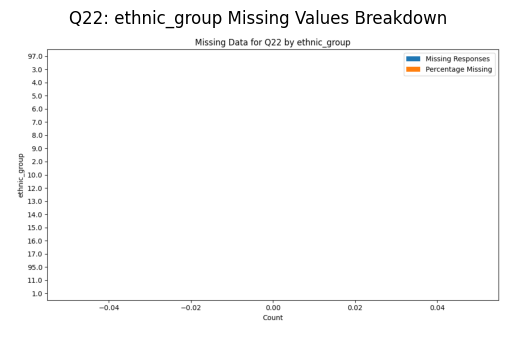


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

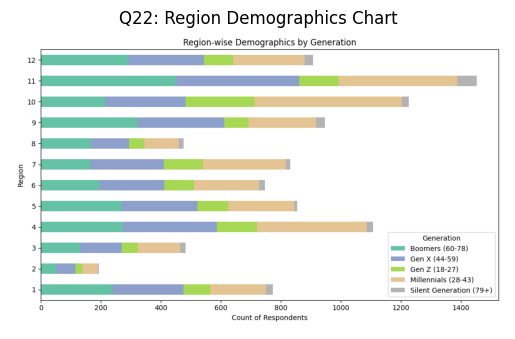


📄 Analyzing Sheet: Q23

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


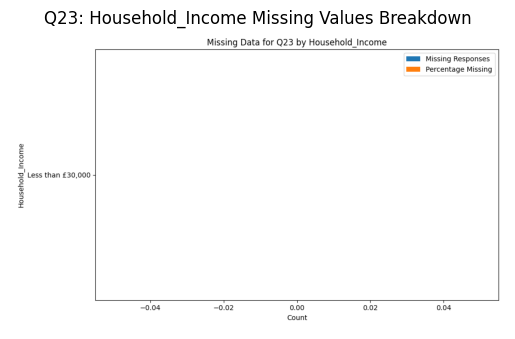


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


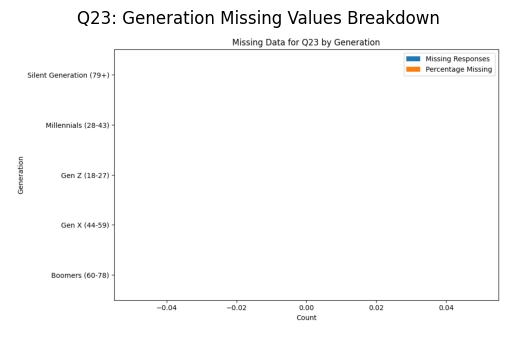


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


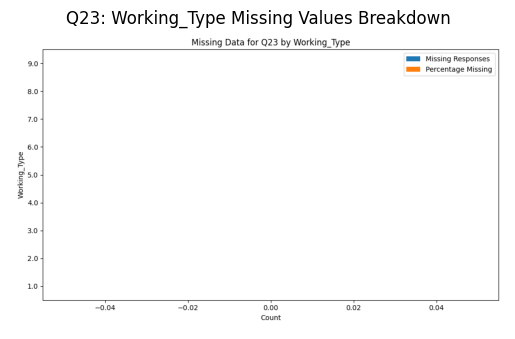


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

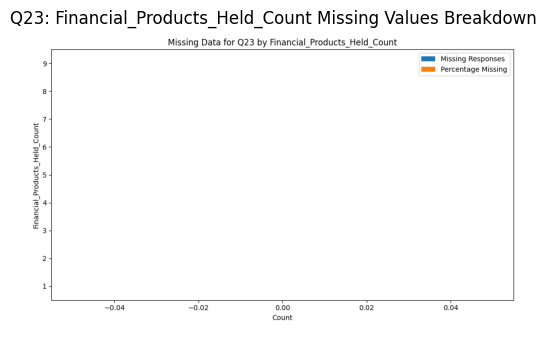


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


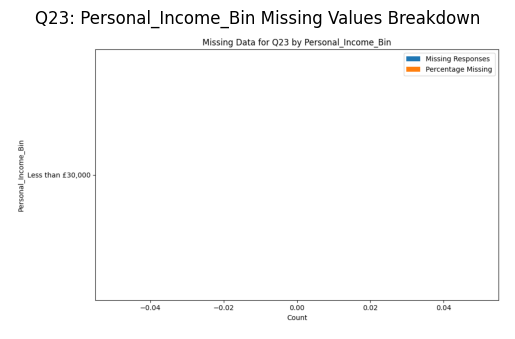


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

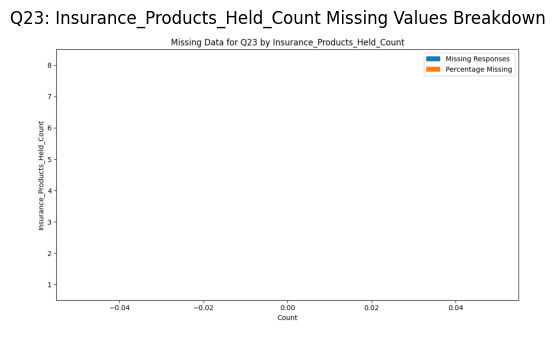


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

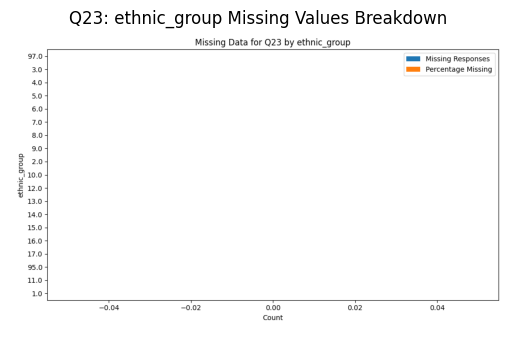


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

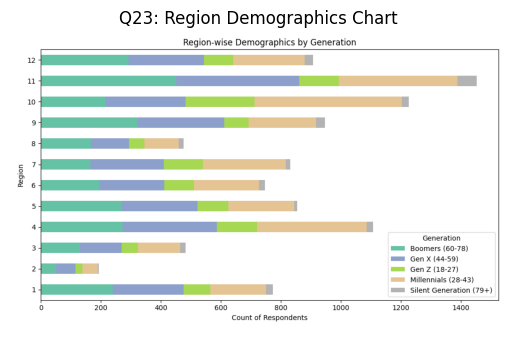


📄 Analyzing Sheet: Q24

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6655            10000               66.55


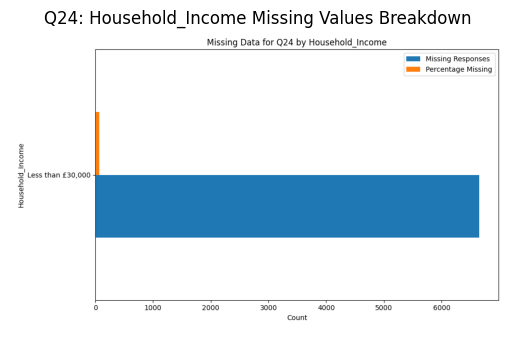


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   1966             2924   
Boomers (60-78)                       1803             2774   
Gen X (44-59)                         1667             2808   
Gen Z (18-27)                         1015             1226   
Silent Generation (79+)                204              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   67.24  
Boomers (60-78)                       65.00  
Gen X (44-59)                         59.37  
Gen Z (18-27)                         82.79  
Silent Generation (79+)               76.12  


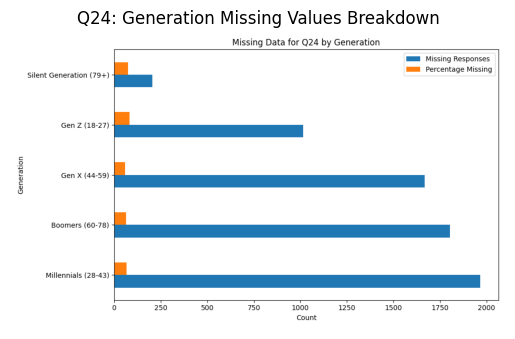


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        3174             5467               58.06
2.0                         412              642               64.17
9.0                          77               90               85.56
6.0                          67              102               65.69
5.0                          48               78               61.54
8.0                          34               42               80.95
3.0                          16               33               48.48
7.0                          16               28               57.14
4.0                          15               18               83.33


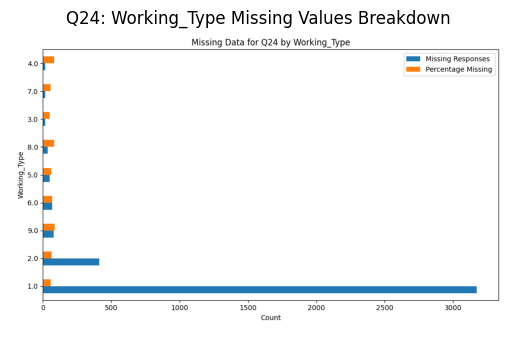


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         4777.0             5073   
2                                         1223.0             2367   
3                                          433.0             1338   
4                                          146.0              618   
5                                           59.0              327   
6                                           16.0              161   
7                                            1.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           94.17

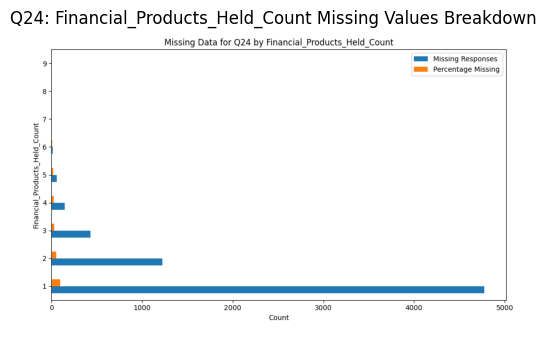


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6655            10000               66.55


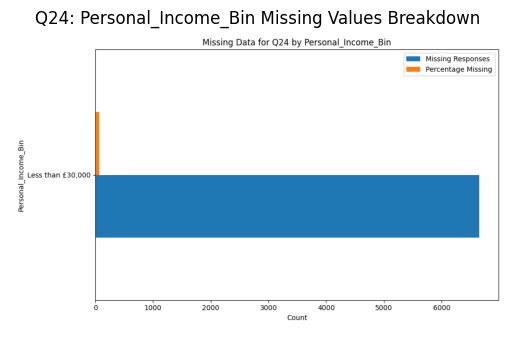


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           4424             5942   
2                                           1336             2156   
3                                            591             1128   
4                                            221              494   
5                                             58              181   
6                                             14               65   
7                                              6               24   
8                                              5               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           74.45  
2                                           61.97  
3             

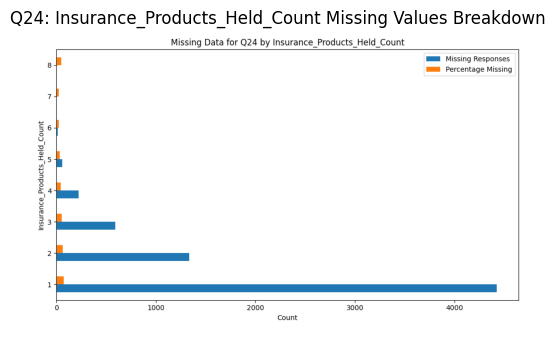


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        5106             7854               65.01
14.0                        314              470               66.81
4.0                         256              360               71.11
10.0                        118              141               83.69
9.0                         106              151               70.20
15.0                         83              111               74.77
2.0                          66              100               66.00
13.0                         63               77               81.82
6.0                          51               79               64.56
97.0                         48               57               84.21
5.0                          45               62               72.58
12.0                         43  

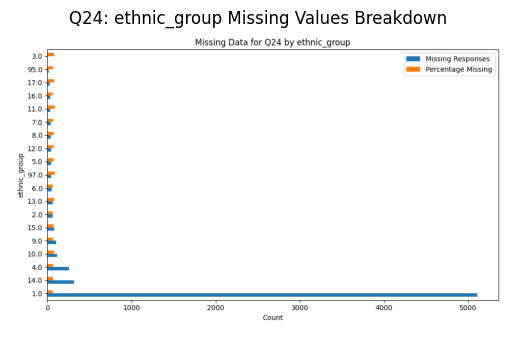


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

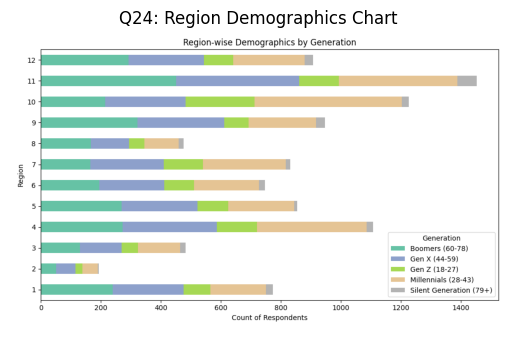


📄 Analyzing Sheet: Q25

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               5632            10000               56.32


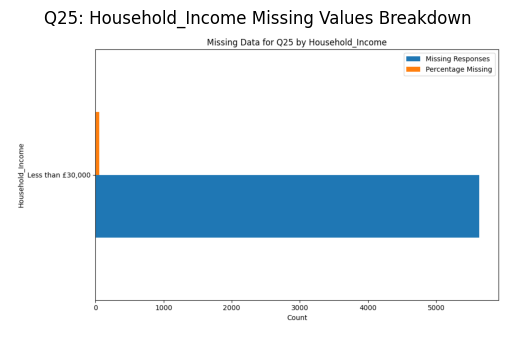


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   1723             2924   
Boomers (60-78)                       1408             2774   
Gen X (44-59)                         1367             2808   
Gen Z (18-27)                          966             1226   
Silent Generation (79+)                168              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   58.93  
Boomers (60-78)                       50.76  
Gen X (44-59)                         48.68  
Gen Z (18-27)                         78.79  
Silent Generation (79+)               62.69  


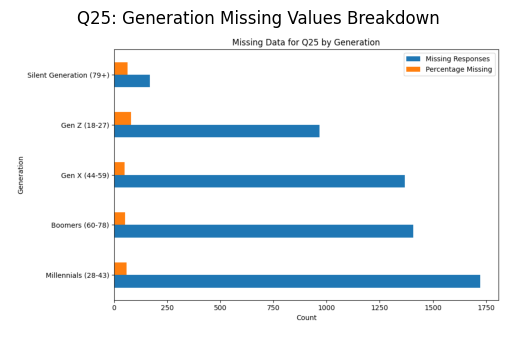


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        2543             5467               46.52
2.0                         387              642               60.28
9.0                          73               90               81.11
6.0                          57              102               55.88
5.0                          44               78               56.41
8.0                          33               42               78.57
7.0                          16               28               57.14
3.0                          13               33               39.39
4.0                          12               18               66.67


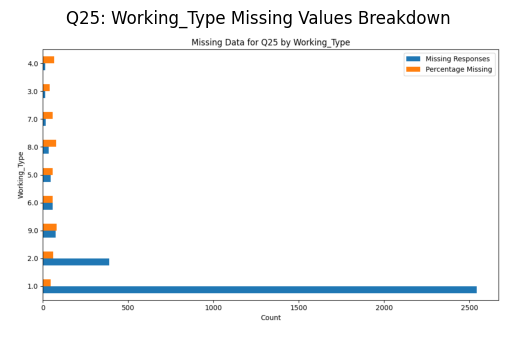


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         4660.0             5073   
2                                          676.0             2367   
3                                          229.0             1338   
4                                           54.0              618   
5                                           13.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           91.86

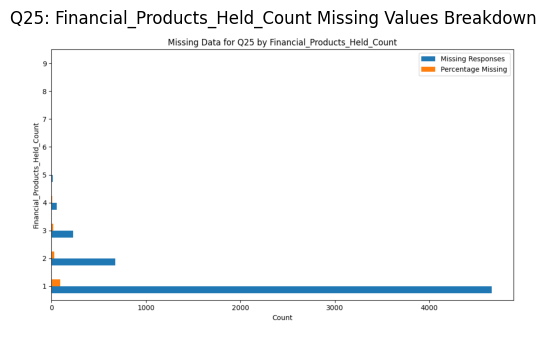


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 5632            10000               56.32


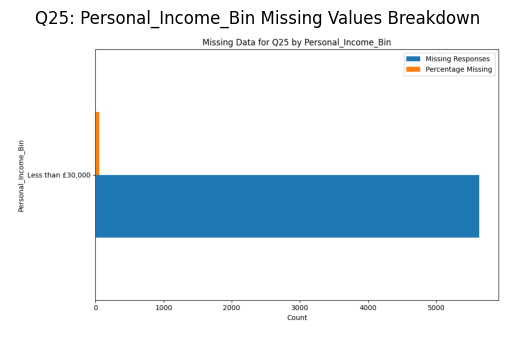


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           3926             5942   
2                                           1049             2156   
3                                            445             1128   
4                                            161              494   
5                                             38              181   
6                                              7               65   
7                                              3               24   
8                                              3               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           66.07  
2                                           48.65  
3             

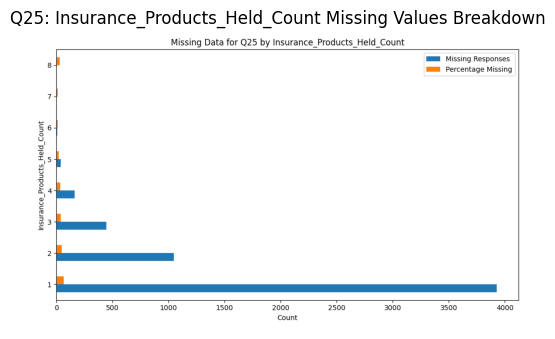


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        4244             7854               54.04
14.0                        279              470               59.36
4.0                         224              360               62.22
10.0                        109              141               77.30
9.0                          91              151               60.26
15.0                         75              111               67.57
13.0                         57               77               74.03
2.0                          51              100               51.00
6.0                          48               79               60.76
97.0                         43               57               75.44
12.0                         41               59               69.49
5.0                          40  

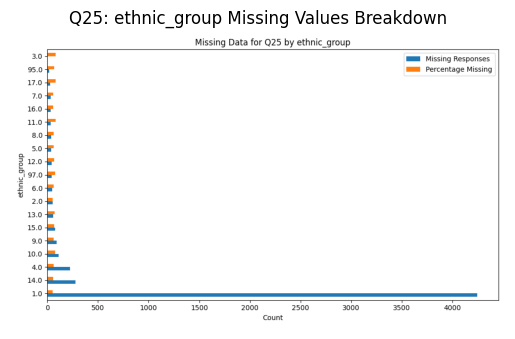


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

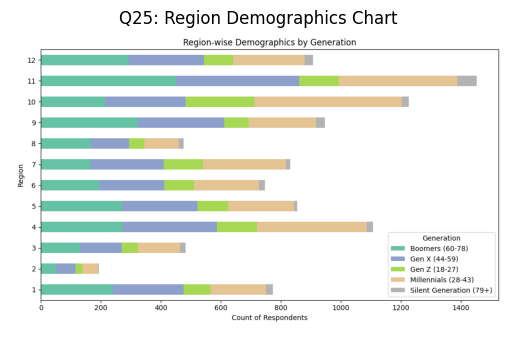


📄 Analyzing Sheet: Q26

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               2001            10000               20.01


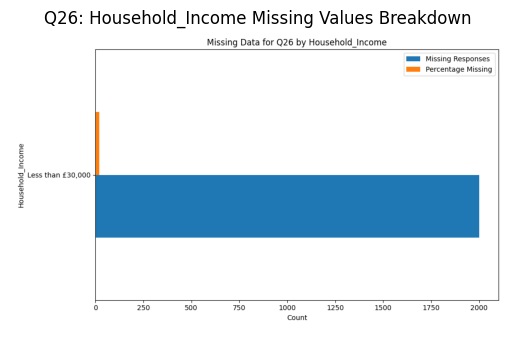


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                     1652.0             2774   
Silent Generation (79+)              249.0              268   
Gen X (44-59)                        100.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       59.55  
Silent Generation (79+)               92.91  
Gen X (44-59)                          3.56  
Gen Z (18-27)                          0.00  
Millennials (28-43)                    0.00  


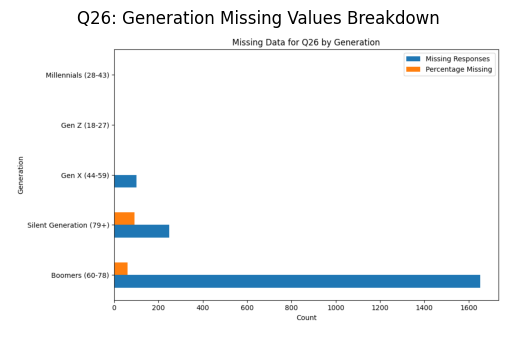


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


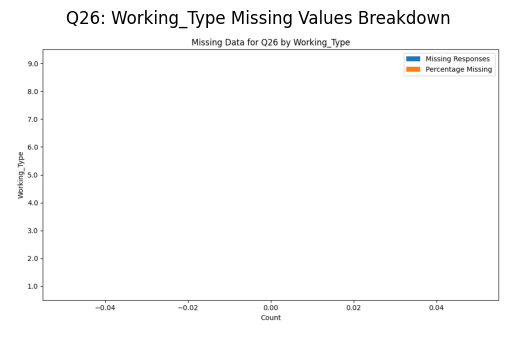


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            962             5073   
2                                            537             2367   
3                                            259             1338   
4                                            126              618   
5                                             79              327   
6                                             25              161   
7                                              9               58   
8                                              3               32   
9                                              1               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           18.96

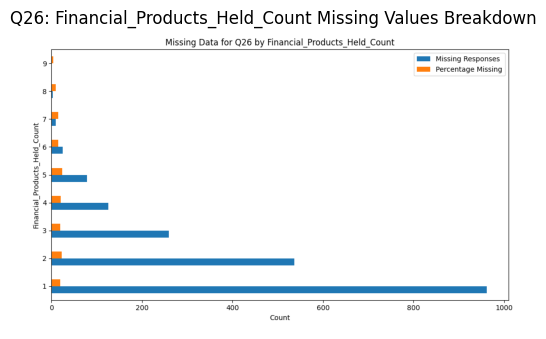


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 2001            10000               20.01


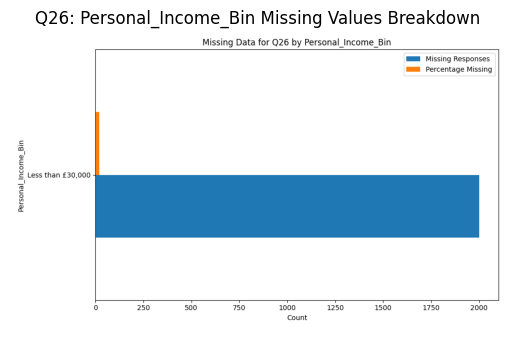


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                         1168.0             5942   
2                                          575.0             2156   
3                                          192.0             1128   
4                                           49.0              494   
5                                           14.0              181   
7                                            2.0               24   
6                                            1.0               65   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           19.66  
2                                           26.67  
3             

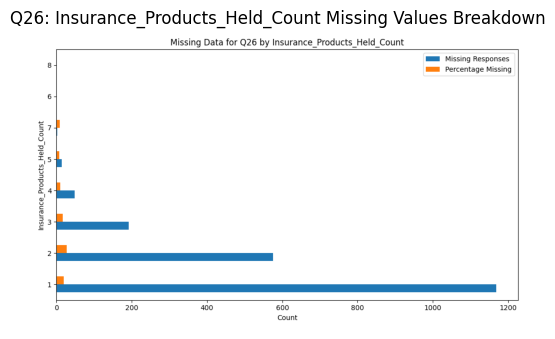


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                      1903.0             7854               24.23
4.0                        21.0              360                5.83
2.0                        14.0              100               14.00
9.0                        11.0              151                7.28
12.0                        6.0               59               10.17
14.0                        4.0              470                0.85
97.0                        4.0               57                7.02
7.0                         4.0               54                7.41
8.0                         3.0               58                5.17
6.0                         2.0               79                2.53
5.0                         2.0               62                3.23
13.0                        2.0  

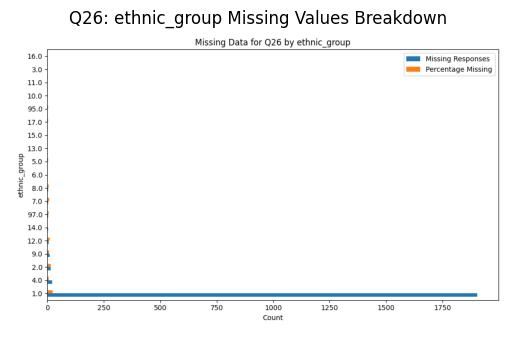


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

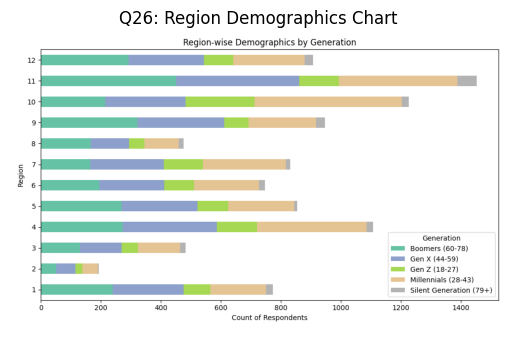


📄 Analyzing Sheet: Q37

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               9097            10000               90.97


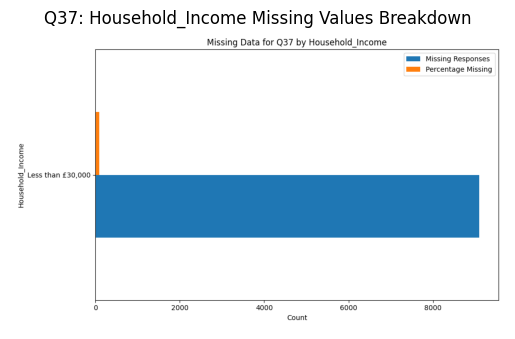


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2757             2924   
Gen X (44-59)                         2648             2808   
Boomers (60-78)                       2319             2774   
Gen Z (18-27)                         1171             1226   
Silent Generation (79+)                202              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   94.29  
Gen X (44-59)                         94.30  
Boomers (60-78)                       83.60  
Gen Z (18-27)                         95.51  
Silent Generation (79+)               75.37  


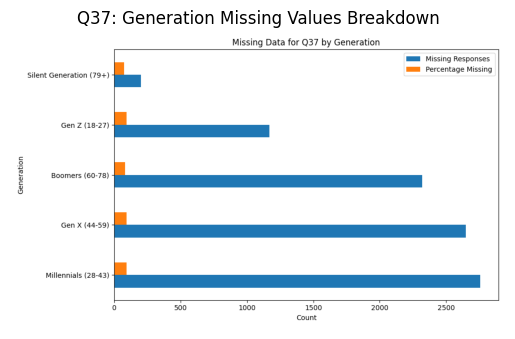


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        5104             5467               93.36
2.0                         593              642               92.37
6.0                          99              102               97.06
9.0                          89               90               98.89
5.0                          72               78               92.31
8.0                          40               42               95.24
3.0                          28               33               84.85
7.0                          25               28               89.29
4.0                          15               18               83.33


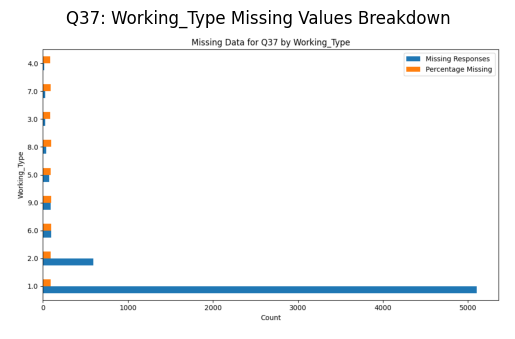


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           4757             5073   
2                                           2113             2367   
3                                           1197             1338   
4                                            535              618   
5                                            262              327   
6                                            135              161   
7                                             47               58   
8                                             26               32   
9                                             25               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           93.77

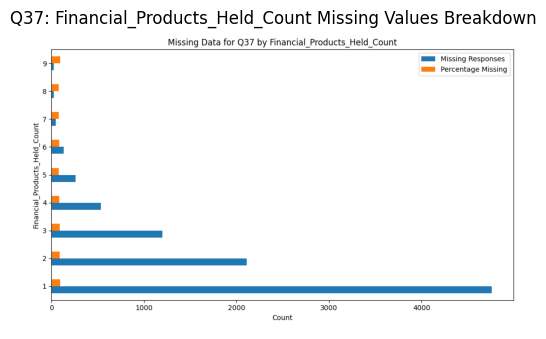


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 9097            10000               90.97


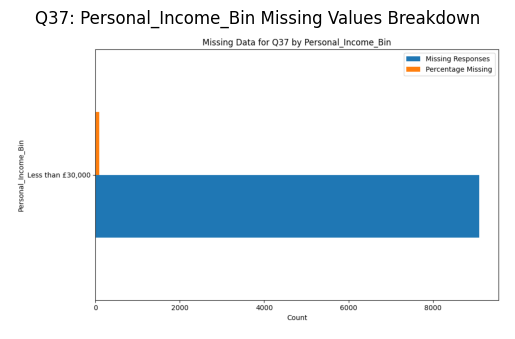


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           5513             5942   
2                                           1908             2156   
3                                           1003             1128   
4                                            436              494   
5                                            152              181   
6                                             54               65   
7                                             21               24   
8                                             10               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           92.78  
2                                           88.50  
3             

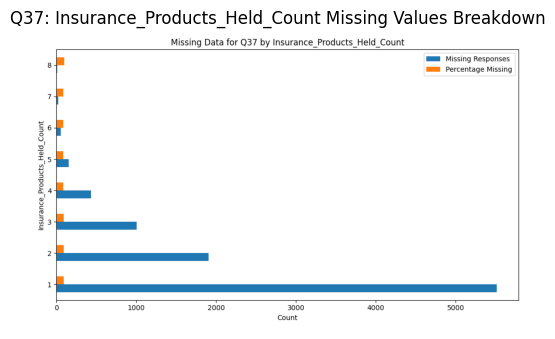


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        7092             7854               90.30
14.0                        432              470               91.91
4.0                         342              360               95.00
9.0                         142              151               94.04
10.0                        133              141               94.33
15.0                        105              111               94.59
2.0                          90              100               90.00
13.0                         73               77               94.81
6.0                          67               79               84.81
5.0                          61               62               98.39
12.0                         57               59               96.61
8.0                          54  

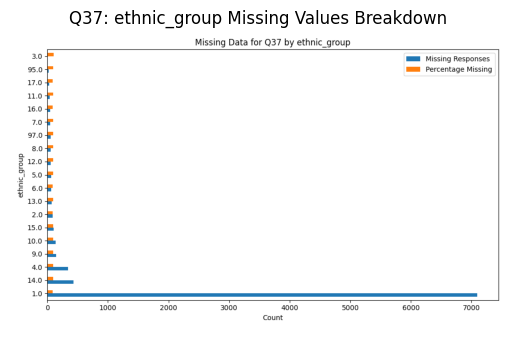


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

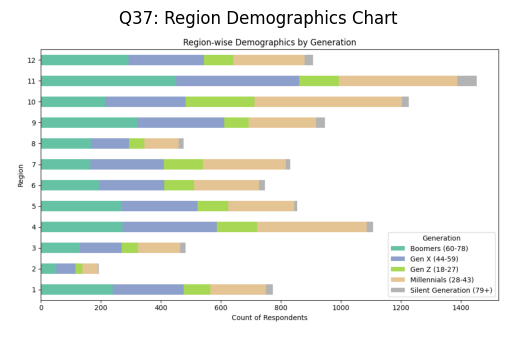


📄 Analyzing Sheet: Q38

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


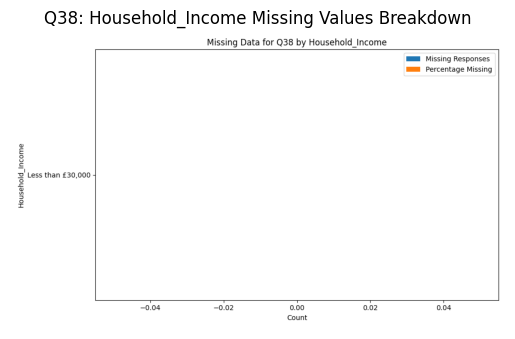


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


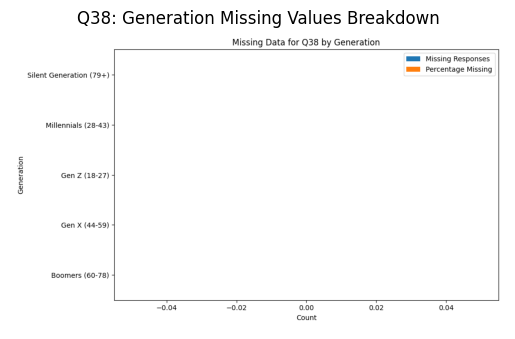


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


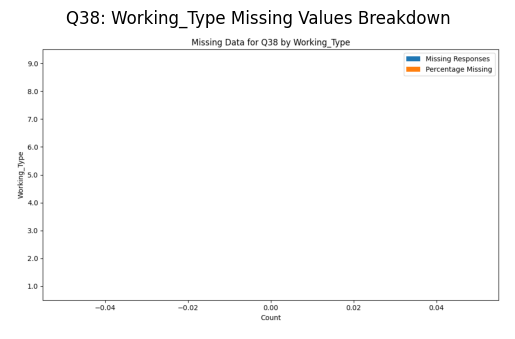


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

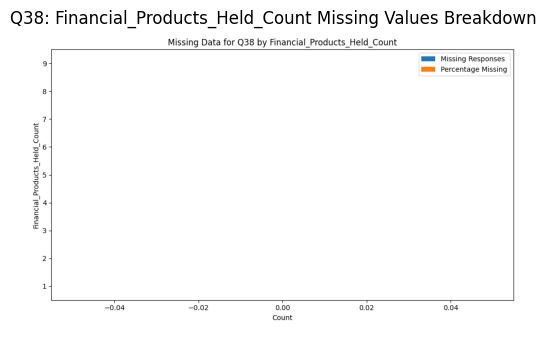


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


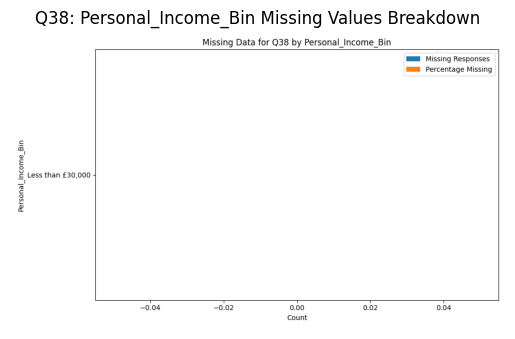


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

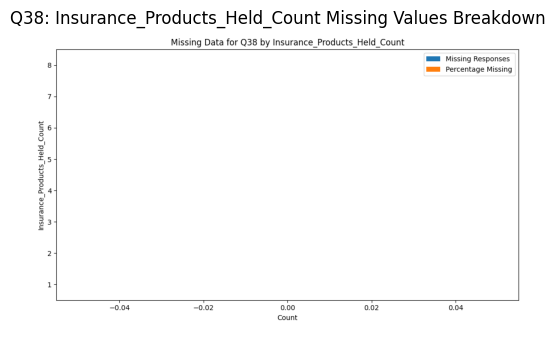


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

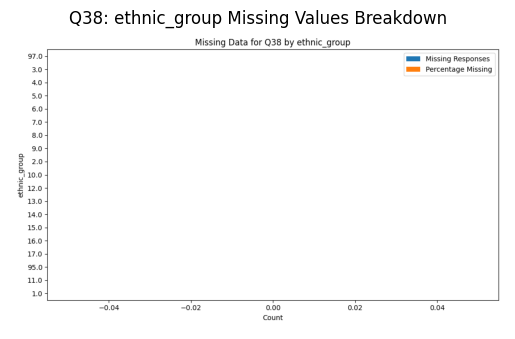


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

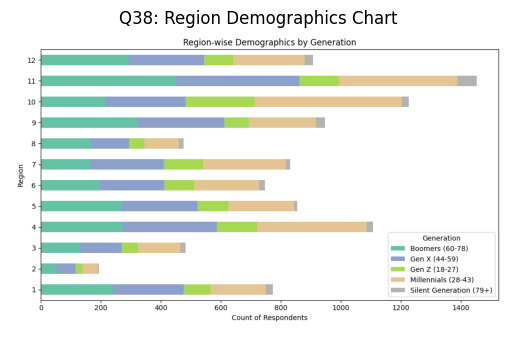


📄 Analyzing Sheet: Q39

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               3137            10000               31.37


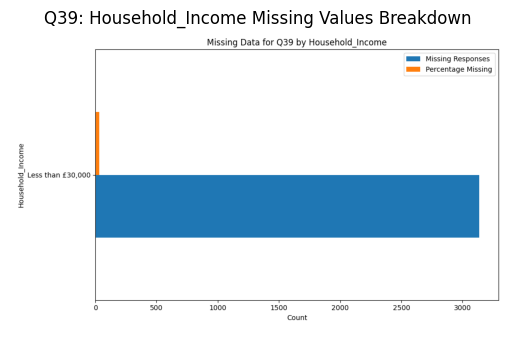


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        960             2774   
Gen X (44-59)                          912             2808   
Millennials (28-43)                    836             2924   
Gen Z (18-27)                          342             1226   
Silent Generation (79+)                 87              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                       34.61  
Gen X (44-59)                         32.48  
Millennials (28-43)                   28.59  
Gen Z (18-27)                         27.90  
Silent Generation (79+)               32.46  


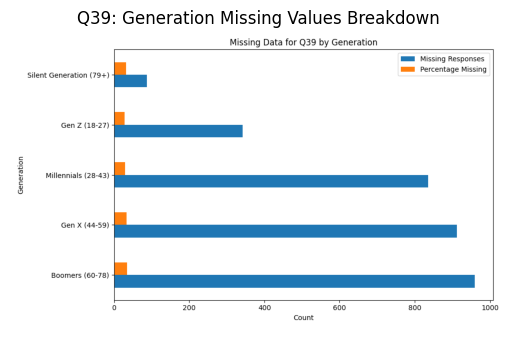


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        1588             5467               29.05
2.0                         188              642               29.28
6.0                          27              102               26.47
9.0                          26               90               28.89
5.0                          14               78               17.95
3.0                          13               33               39.39
8.0                          12               42               28.57
7.0                           9               28               32.14
4.0                           6               18               33.33


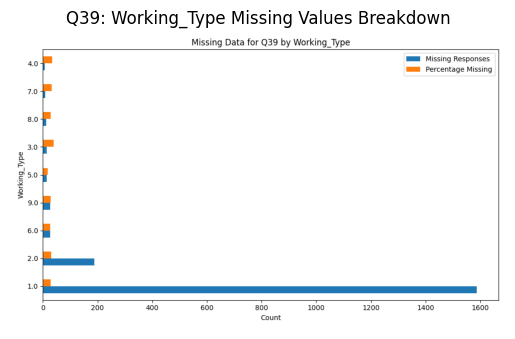


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           1657             5073   
2                                            775             2367   
3                                            371             1338   
4                                            167              618   
5                                            105              327   
6                                             39              161   
7                                             15               58   
8                                              5               32   
9                                              3               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           32.66

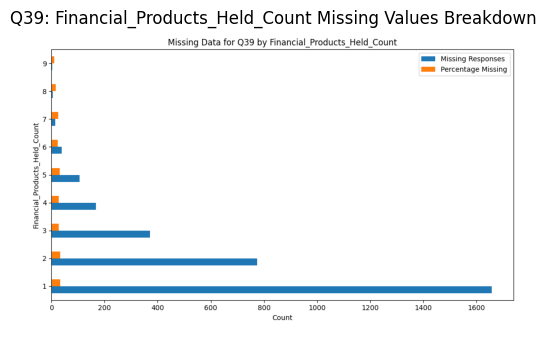


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 3137            10000               31.37


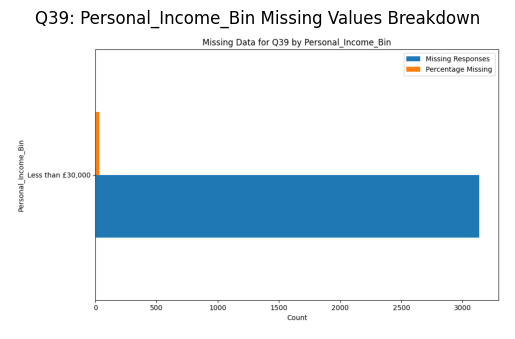


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           1996             5942   
2                                            631             2156   
3                                            315             1128   
4                                            130              494   
5                                             45              181   
6                                             11               65   
7                                              5               24   
8                                              4               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           33.59  
2                                           29.27  
3             

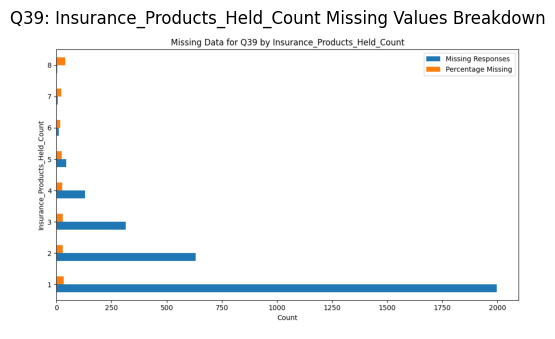


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        2594             7854               33.03
14.0                        105              470               22.34
4.0                          85              360               23.61
9.0                          37              151               24.50
10.0                         30              141               21.28
2.0                          29              100               29.00
15.0                         29              111               26.13
5.0                          18               62               29.03
97.0                         17               57               29.82
8.0                          16               58               27.59
13.0                         16               77               20.78
11.0                         15  

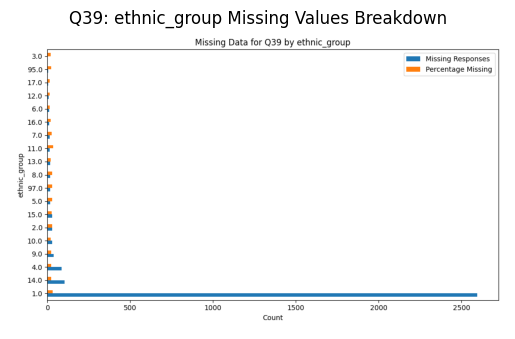


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

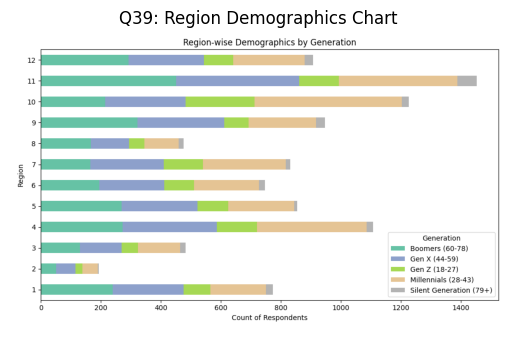


📄 Analyzing Sheet: D15

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                0.0            10000                 0.0


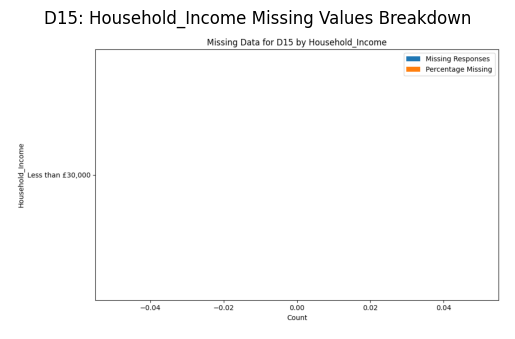


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Boomers (60-78)                        0.0             2774   
Gen X (44-59)                          0.0             2808   
Gen Z (18-27)                          0.0             1226   
Millennials (28-43)                    0.0             2924   
Silent Generation (79+)                0.0              268   

                         Percentage Missing  
Generation                                   
Boomers (60-78)                         0.0  
Gen X (44-59)                           0.0  
Gen Z (18-27)                           0.0  
Millennials (28-43)                     0.0  
Silent Generation (79+)                 0.0  


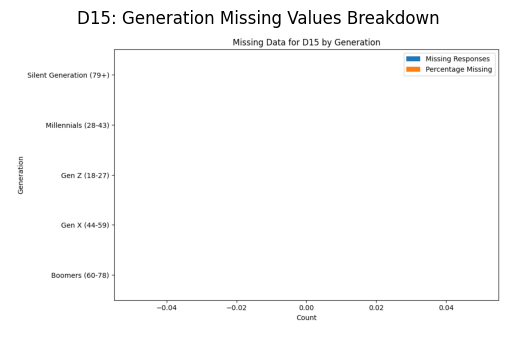


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                         0.0             5467                 0.0
2.0                         0.0              642                 0.0
3.0                         0.0               33                 0.0
4.0                         0.0               18                 0.0
5.0                         0.0               78                 0.0
6.0                         0.0              102                 0.0
7.0                         0.0               28                 0.0
8.0                         0.0               42                 0.0
9.0                         0.0               90                 0.0


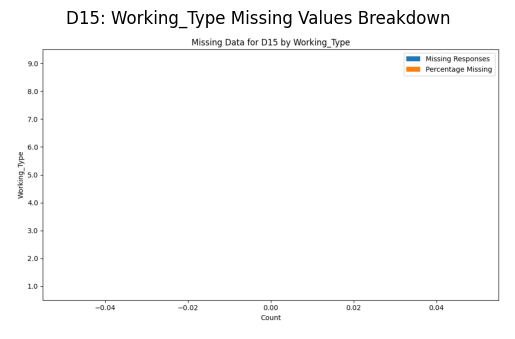


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                            0.0             5073   
2                                            0.0             2367   
3                                            0.0             1338   
4                                            0.0              618   
5                                            0.0              327   
6                                            0.0              161   
7                                            0.0               58   
8                                            0.0               32   
9                                            0.0               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                             0.0

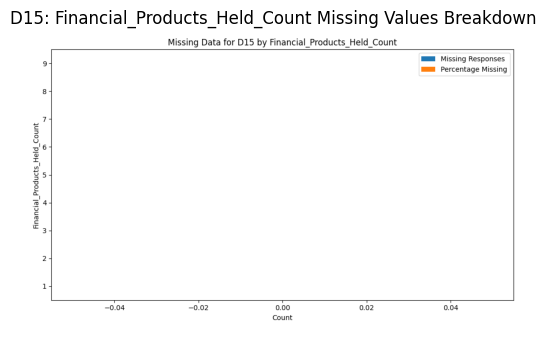


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  0.0            10000                 0.0


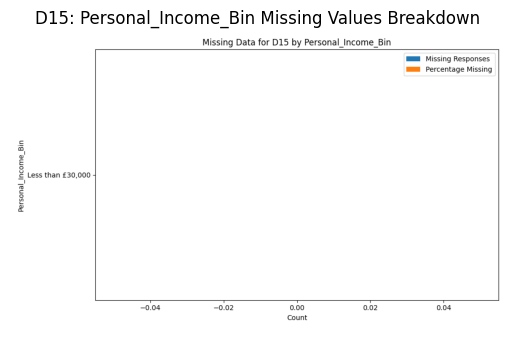


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                            0.0             5942   
2                                            0.0             2156   
3                                            0.0             1128   
4                                            0.0              494   
5                                            0.0              181   
6                                            0.0               65   
7                                            0.0               24   
8                                            0.0               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                             0.0  
2                                             0.0  
3             

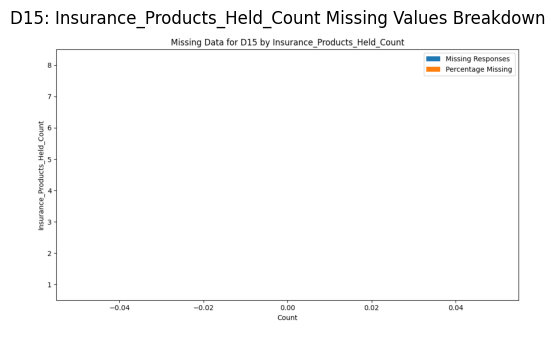


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

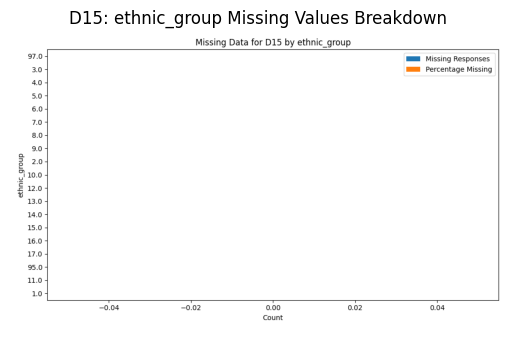


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

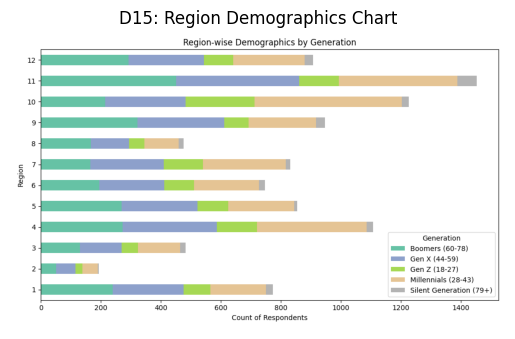


📄 Analyzing Sheet: D16

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                205            10000                2.05


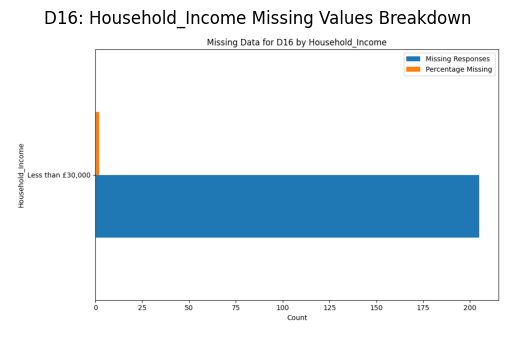


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                     74             2924   
Gen X (44-59)                           53             2808   
Gen Z (18-27)                           48             1226   
Boomers (60-78)                         28             2774   
Silent Generation (79+)                  2              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                    2.53  
Gen X (44-59)                          1.89  
Gen Z (18-27)                          3.92  
Boomers (60-78)                        1.01  
Silent Generation (79+)                0.75  


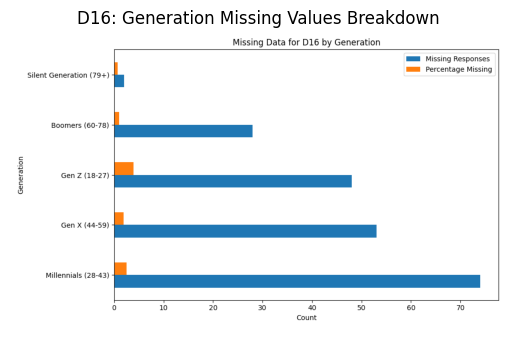


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        95.0             5467                1.74
2.0                        17.0              642                2.65
9.0                         5.0               90                5.56
6.0                         2.0              102                1.96
8.0                         2.0               42                4.76
3.0                         1.0               33                3.03
5.0                         1.0               78                1.28
4.0                         0.0               18                0.00
7.0                         0.0               28                0.00


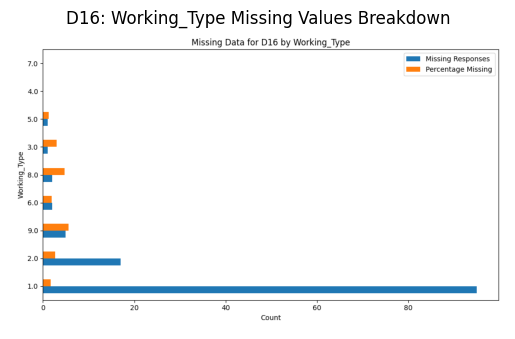


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                          132.0             5073   
2                                           36.0             2367   
3                                           21.0             1338   
4                                            8.0              618   
5                                            5.0              327   
6                                            2.0              161   
9                                            1.0               26   
7                                            0.0               58   
8                                            0.0               32   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                            2.60

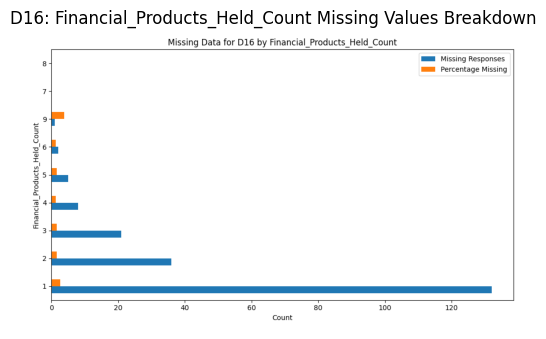


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  205            10000                2.05


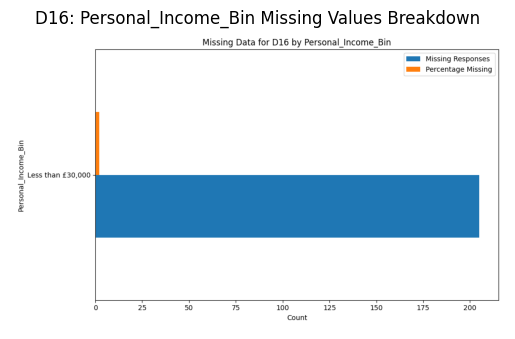


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                          160.0             5942   
3                                           18.0             1128   
2                                           16.0             2156   
4                                            8.0              494   
5                                            1.0              181   
6                                            1.0               65   
8                                            1.0               10   
7                                            0.0               24   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                            2.69  
3                                            1.60  
2             

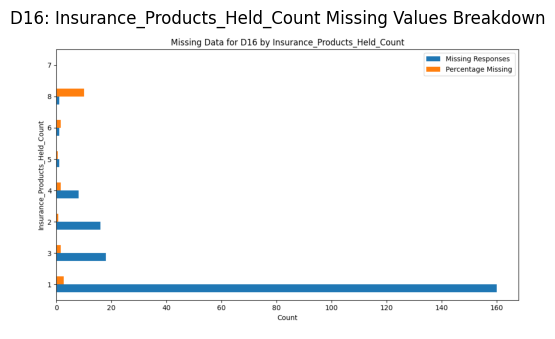


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

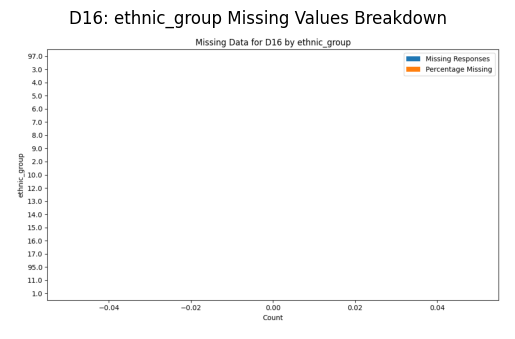


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

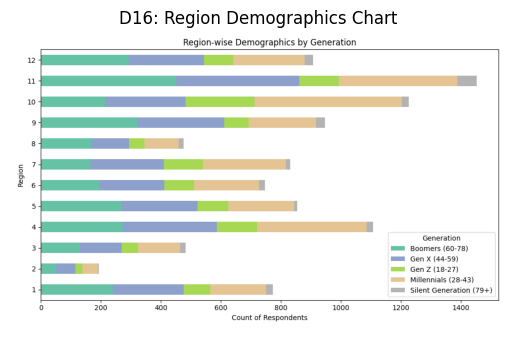


📄 Analyzing Sheet: D17

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000               6787            10000               67.87


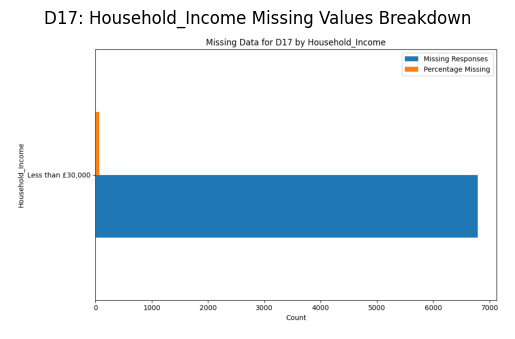


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                   2238             2924   
Gen X (44-59)                         1876             2808   
Boomers (60-78)                       1656             2774   
Gen Z (18-27)                          885             1226   
Silent Generation (79+)                132              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                   76.54  
Gen X (44-59)                         66.81  
Boomers (60-78)                       59.70  
Gen Z (18-27)                         72.19  
Silent Generation (79+)               49.25  


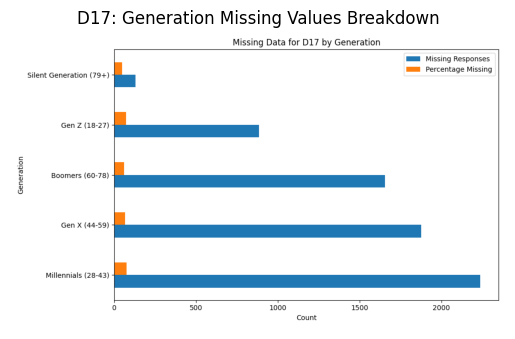


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        4222             5467               77.23
2.0                         458              642               71.34
6.0                          77              102               75.49
9.0                          68               90               75.56
5.0                          53               78               67.95
8.0                          36               42               85.71
3.0                          26               33               78.79
7.0                          18               28               64.29
4.0                          11               18               61.11


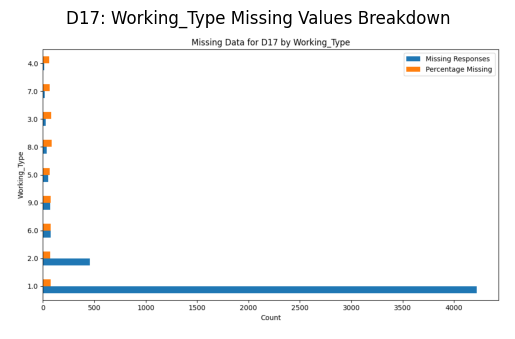


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                           3148             5073   
2                                           1688             2367   
3                                            997             1338   
4                                            482              618   
5                                            251              327   
6                                            128              161   
7                                             43               58   
8                                             25               32   
9                                             25               26   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                           62.05

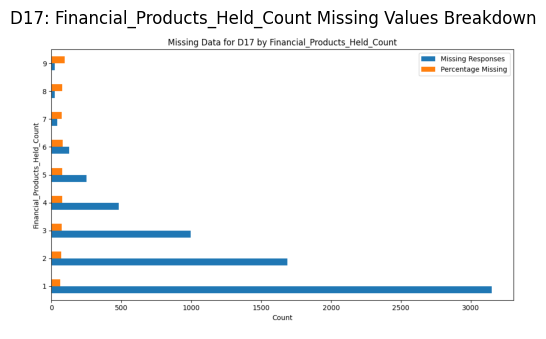


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                 6787            10000               67.87


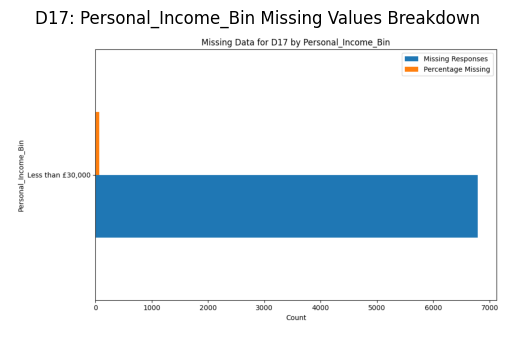


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                           3856             5942   
2                                           1502             2156   
3                                            833             1128   
4                                            383              494   
5                                            142              181   
6                                             48               65   
7                                             15               24   
8                                              8               10   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                           64.89  
2                                           69.67  
3             

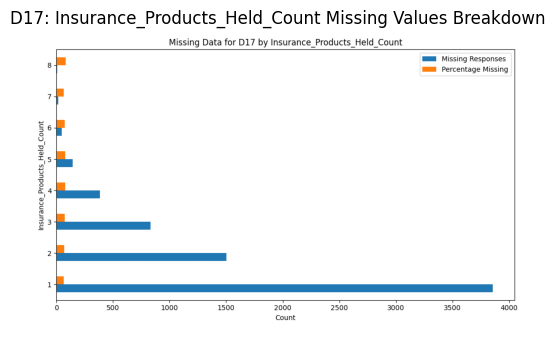


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                        5060             7854               64.43
14.0                        433              470               92.13
4.0                         258              360               71.67
9.0                         112              151               74.17
10.0                        104              141               73.76
15.0                         83              111               74.77
2.0                          71              100               71.00
6.0                          62               79               78.48
13.0                         60               77               77.92
12.0                         51               59               86.44
16.0                         49               57               85.96
97.0                         47  

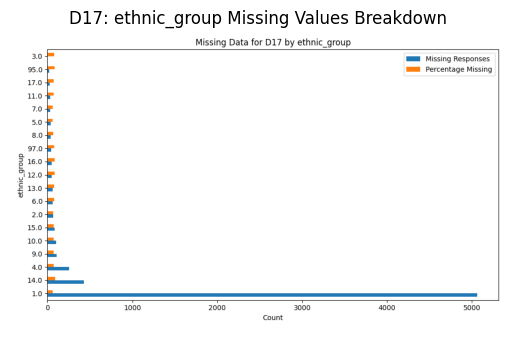


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

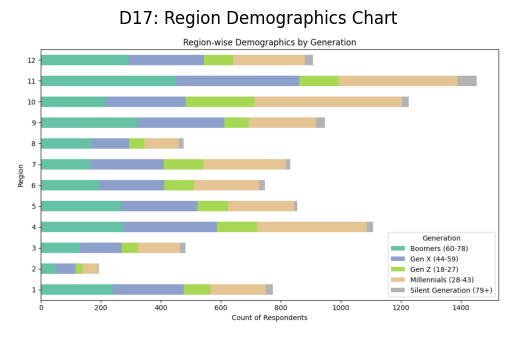


📄 Analyzing Sheet: D8_Ethnicity

🔍 Missing Value Breakdown for: Household_Income Missing Values Breakdown
                   Missing Responses  Total Responses  Percentage Missing
Household_Income                                                         
Less than £30,000                205            10000                2.05


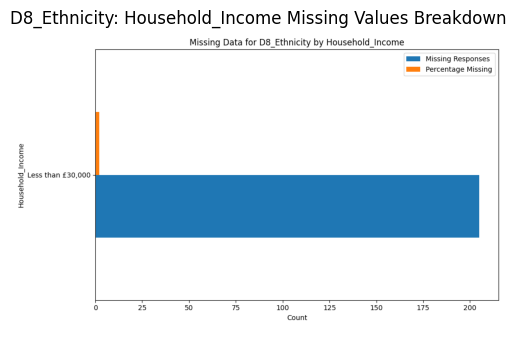


🔍 Missing Value Breakdown for: Generation Missing Values Breakdown
                         Missing Responses  Total Responses  \
Generation                                                    
Millennials (28-43)                     74             2924   
Gen X (44-59)                           53             2808   
Gen Z (18-27)                           48             1226   
Boomers (60-78)                         28             2774   
Silent Generation (79+)                  2              268   

                         Percentage Missing  
Generation                                   
Millennials (28-43)                    2.53  
Gen X (44-59)                          1.89  
Gen Z (18-27)                          3.92  
Boomers (60-78)                        1.01  
Silent Generation (79+)                0.75  


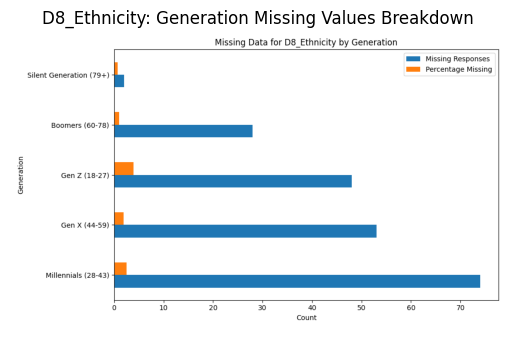


🔍 Missing Value Breakdown for: Working_Type Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
Working_Type                                                        
1.0                        95.0             5467                1.74
2.0                        17.0              642                2.65
9.0                         5.0               90                5.56
6.0                         2.0              102                1.96
8.0                         2.0               42                4.76
3.0                         1.0               33                3.03
5.0                         1.0               78                1.28
4.0                         0.0               18                0.00
7.0                         0.0               28                0.00


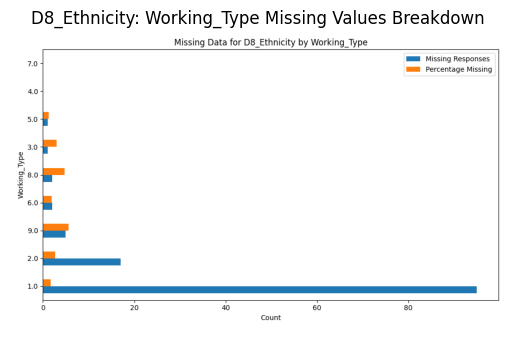


🔍 Missing Value Breakdown for: Financial_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                          132.0             5073   
2                                           36.0             2367   
3                                           21.0             1338   
4                                            8.0              618   
5                                            5.0              327   
6                                            2.0              161   
9                                            1.0               26   
7                                            0.0               58   
8                                            0.0               32   

                               Percentage Missing  
Financial_Products_Held_Count                      
1                                            2.60

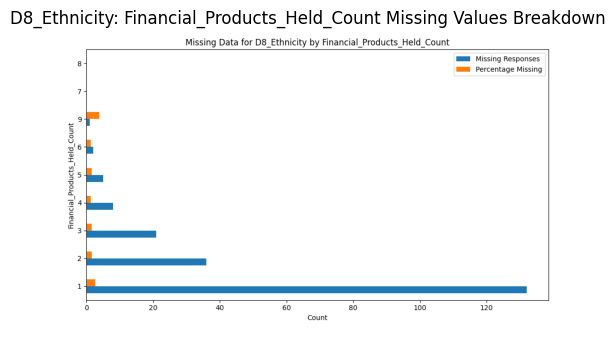


🔍 Missing Value Breakdown for: Personal_Income_Bin Missing Values Breakdown
                     Missing Responses  Total Responses  Percentage Missing
Personal_Income_Bin                                                        
Less than £30,000                  205            10000                2.05


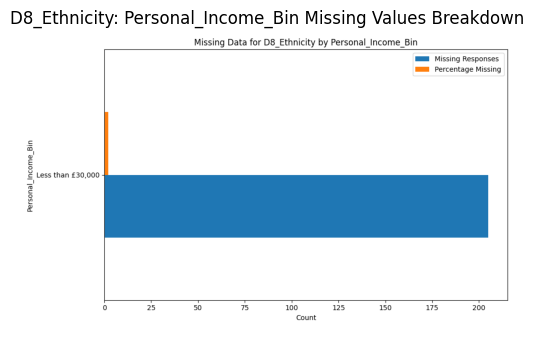


🔍 Missing Value Breakdown for: Insurance_Products_Held_Count Missing Values Breakdown
                               Missing Responses  Total Responses  \
Insurance_Products_Held_Count                                       
1                                          160.0             5942   
3                                           18.0             1128   
2                                           16.0             2156   
4                                            8.0              494   
5                                            1.0              181   
6                                            1.0               65   
8                                            1.0               10   
7                                            0.0               24   

                               Percentage Missing  
Insurance_Products_Held_Count                      
1                                            2.69  
3                                            1.60  
2             

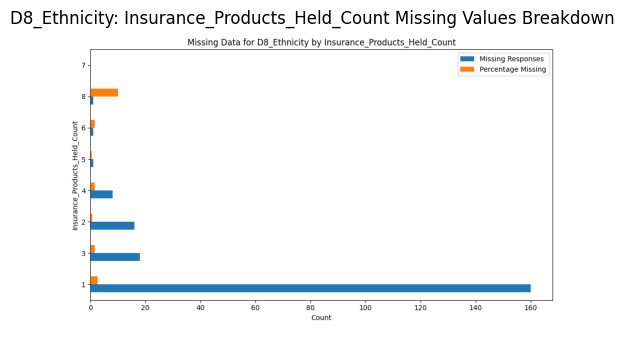


🔍 Missing Value Breakdown for: ethnic_group Missing Values Breakdown
              Missing Responses  Total Responses  Percentage Missing
ethnic_group                                                        
1.0                         0.0             7854                 0.0
11.0                        0.0               42                 0.0
95.0                        0.0               23                 0.0
17.0                        0.0               35                 0.0
16.0                        0.0               57                 0.0
15.0                        0.0              111                 0.0
14.0                        0.0              470                 0.0
13.0                        0.0               77                 0.0
12.0                        0.0               59                 0.0
10.0                        0.0              141                 0.0
2.0                         0.0              100                 0.0
9.0                         0.0  

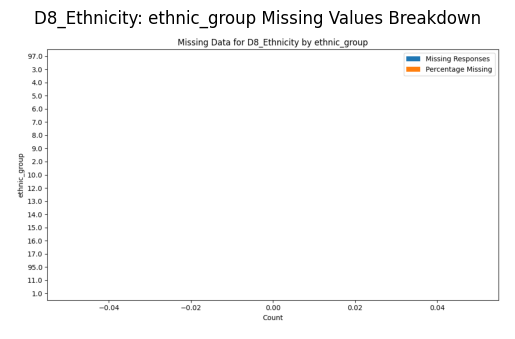


📊 Region vs Generation - Count
Generation  Boomers (60-78)  Gen X (44-59)  Gen Z (18-27)  \
Region                                                      
1                       240            236             89   
2                        51             65             23   
3                       130            139             55   
4                       273            314            133   
5                       269            253            103   
6                       195            216            100   
7                       166            244            130   
8                       167            127             52   
9                       323            288             81   
10                      215            267            230   
11                      452            409            132   
12                      293            250             98   

Generation  Millennials (28-43)  Silent Generation (79+)  
Region                                                

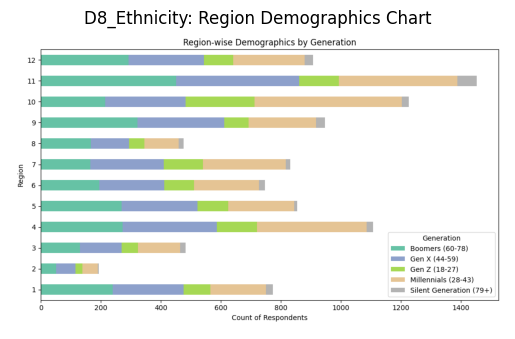


📄 Analyzing Sheet: Tables


In [12]:
# ========== EXECUTION ==========
sheets_data = load_excel_files(folder_path)
all_data = {}

for sheet_name, (df, question_text)  in sheets_data.items():
    print(f"\n📄 Analyzing Sheet: {sheet_name}")
    question_col = df.columns[0]

    # Analyze and display missing values
    missing_analyses = analyze_missing_values(df, question_col, 'Region', 'Gender_Cat', 'ethnic_group', sheet_name)
    for var, (df_missing, chart_path) in missing_analyses.items():
        print(f"\n🔍 Missing Value Breakdown for: {var}")
        print(df_missing)
        # Display the chart
        img = plt.imread(chart_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{sheet_name}: {var}")
        plt.show()

    # Analyze and display region demographics
    region_count, region_pct, region_chart = analyze_region_demographics_by_generation(df, 'Region', 'Generation', sheet_name)
    if region_count is not None:
        print("\n📊 Region vs Generation - Count")
        print(region_count)
        print("\n📊 Region vs Generation - Percentage")
        print(region_pct)
        img = plt.imread(region_chart)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{sheet_name}: Region Demographics Chart")
        plt.show()

    # Store all for Excel
    analyses = missing_analyses
    if region_count is not None:
        analyses["Region vs Generation Count"] = (region_count, region_chart)
        analyses["Region vs Generation Percentage"] = (region_pct, region_chart)

    all_data[sheet_name] = {
        "question_text": question_text,
        "analyses": analyses
    }


In [15]:
# Save the final Excel file
save_to_excel(all_data, os.path.join(output_folder, output_file))

Streaming output truncated to the last 5000 lines.
3.0                          10               33               30.30
7.0                           6               28               21.43
4.0                           2               18               11.11, '/content/drive/MyDrive/PythonApps/DrIrfan_survayData/AnalysisCharts/Q10_Working_Type_missing_chart.png'), 'Financial_Products_Held_Count Missing Values Breakdown': (                               Missing Responses  Total Responses  \
Financial_Products_Held_Count                                       
1                                         2243.0             5073   
2                                          195.0             2367   
3                                           76.0             1338   
4                                           32.0              618   
5                                            8.0              327   
6                                            2.0              161   
7                      